# Dallas, Texas, Python automatic variable generation file for Circular Buffer

# Import the library

# Follow the below link to install Geopanda


#https://medium.com/analytics-vidhya/fastest-way-to-install-geopandas-in-jupyter-notebook-on-windows-8f734e11fa2b

In [1]:
import time
start = time.time()
# First Run all these in command prompt cell to use geopanda
#conda create -n geo_env
#conda activate geo_env
#conda config --env --add channels conda-forge
#conda config --env --set channel_priority strict
#conda install python=3 geopandas

In [2]:
#conda activate geo_env


In [3]:
#python -m ipykernel install --user --name geo_env

In [4]:
import geopandas as gpd

In [5]:
import pandas as pd
from functools import reduce

In [6]:
import sys
'geopandas' in sys.modules

True

In [7]:
#!pip3 install matplotlib
import matplotlib.pyplot as plt

In [8]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import io
import pandas as pd

In [9]:
import rasterio
from rasterio.plot import show
from rasterio import plot as rioplot
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox

# All inputs

# Inputr your Euclidean Buffer size or your GIS Customize buffer file Here

In [578]:
#buffer size in meter
size=3218.69 #in m, this input is also required for area conversation,1/10 mile==160.934m,1/4mile=402.336m, 0.5 mile=804.672, 3/4mile=1207.008m, 1 mile=1609.34,1.5 mile=2414.02, 2 mile=3218.69

In [579]:
# Import the emerging data
nf=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/all-aadbt-final-all.csv")
nf=nf[nf["region"]=="Dallas"]
nf=nf[nf["year"]==2019]
nf.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
182,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN
183,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...
184,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN
185,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN
186,P005DAL,Everglade Park Loop,permanent,2019,Dallas,2.0,10.631548,NaN,NaN,1.0,32.78616,-96.69895,not in strava-osm


In [580]:
c1=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/sites_all_study_area.csv")
c1=c1[c1["region"]=="Dallas"]
c1=c1[c1["in_2019"]==1]
c1=c1[['site_id','osm_id_sensor']]
c1.head()

,site_id,osm_id_sensor
382,P001DAL,496723098.0
383,P002DAL,356309596.0
384,P003DAL,493380742.0
385,P004DAL,461234382.0
387,P006DAL,472409339.0


In [581]:
# merge by site_id
nf1=pd.merge(nf,c1, right_on='site_id', left_on='site_id',how='inner')
nf1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0


In [582]:
emerging_data=nf1.loc[:,['osm_id_sensor','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']]
emerging_data.columns=['osm_id','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']
emerging_data.head(3)

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0


# Input the Strava Annual Network shape file here

In [583]:
strava=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/Dallas_strava_osm_buffer_3mi.shp")
print(strava.crs)
# Define the current EPSG
strava = strava.set_crs("EPSG:4326")
# Let's take a copy of our layer
strava_proj = strava.copy()

# Reproject the geometries by replacing the values with projected ones
strava_proj = strava_proj.to_crs(epsg=2845)

epsg:4326


# Input Bike share data here

In [304]:
#bs1=pd.read_csv("C:/Users/mxm5116/Desktop/Eugene Portland/Eugene-bike-share-trips-2019.csv")
#bs1.head(5)
#print(bs1.shape)

# Mention your Study Region here

In [20]:
region = "Dallas"

# Input OSM file here

In [21]:
# Input OSM land use shape file here
luse = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/landuse.shp")
# Define the current EPSG (normall for OSM this 3D EPSG code does not change)
lusec = luse.set_crs("EPSG:4326")


# Input OSM Natural shape file here
nature=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/natural.shp")
# Define the current EPSG
nature = nature.set_crs("EPSG:4326")

# Input OSM Point shape file here
pts=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/points.shp")
# Define the current EPSG
pts = pts.set_crs("EPSG:4326")

# Input the place of your study Area to calculate the intersection Density (city or county, Country)
#place="Oregon,USA"

# Input OSM road shape file here
road = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/roads.shp")
# Define the current EPSG
road = road.set_crs("EPSG:4326")

# Import OSM Building shape file to get CBD (City Hall)

In [22]:
# Input OSM road shape file here
building = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/buildings.shp")
print(building.crs)
# Define the current EPSG
building1 = building.set_crs("EPSG:4326")

epsg:4326


# Input NHGIS Block Group shape and CSV file here

In [23]:
# Input the block group shape file of your study area here
bg=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/TX_blck_grp_2019.shp")

# Input Race csv file here
race=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/race.csv")

# Input Age by Sex csv file here
gender=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/age by sex.csv")

# Input education csv file here
edu=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/education.csv")
# Import school enrollmemt 
scll=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/School Enrollment.csv")

# Input Median age csv file here
age=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/median_age.csv")

# Input Median House Hold income csv file here
income=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/median_hh_income.csv")

# Input House hold Type csv file here
hhdensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/household_type.csv")

# Input Population csv file here
pdensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/population.csv")

# Input Employment csv file here
edensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/employment.csv")

# Means of Transportation data
bike_commute=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/Bike_commute_tx_2019_blck_grp.csv")

# Insert LEHD Job Data, WAC file

In [24]:
# Input job csv file here
Number_job=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/tx_wac_S000_JT00_2018.csv")
Number_job.head(4)
# Input the block group shape file of your study area here
bg_lehd=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/tabblock2010_48_pophu.shp")


# Import Slope File here

In [25]:
eu = rasterio.open('E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/dallasc.img')

# Weather data needs to input three things
1. Chrome driver link (no need for kaggle as it is already set)
2. Dates you want to extract the data (format: yyyy-m, for example, 2019-4)
3. page of weather underground from where you want to extract the data

Please change the dates and page link only for other sttudy area at weather section which you will find before the Random forest variable selections.

WGS84 Latitude/Longitude: "EPSG:4326"

UTM Zones (North): "EPSG:32633"

UTM Zones (South): "EPSG:32733

# Input Study Area Boundary Shape file here

In [584]:
BA_all=gpd.read_file('http://web.pdx.edu/~jbroach/bike-data-fusion/study_area_boundaries.geojson')


In [585]:
BA_all

,fid,region,comment,epsg_local,geometry
0,1,Boulder,None,2772,"MULTIPOLYGON (((-105.64858 40.06198, -105.6480..."
1,2,Eugene,None,2839,"MULTIPOLYGON (((-123.73473 43.94406, -123.7392..."
2,3,Bend,None,2839,"MULTIPOLYGON (((-121.40550 44.39315, -121.4025..."
3,4,Charlotte,None,3358,"MULTIPOLYGON (((-80.74046 35.37771, -80.73779 ..."
4,5,Dallas,None,2845,"MULTIPOLYGON (((-96.52941 32.54528, -96.52964 ..."
5,6,Portland,metro planning area,2838,"MULTIPOLYGON (((-123.13045 45.47864, -123.1307..."


<AxesSubplot:>

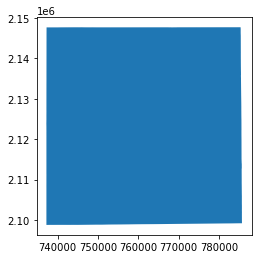

In [586]:
#region = "Eugene"
# select regional boundary and transform to local coords for buffering
local_poly = BA_all[BA_all['region'] == region]
local_srid = int(local_poly['epsg_local'])
local_poly = local_poly.to_crs(local_srid)
local_poly.plot()

<AxesSubplot:>

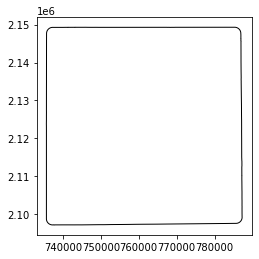

In [587]:
one_mile = 1609.34 # meters
pba = local_poly.buffer(one_mile)
pba.plot(color="none")

<AxesSubplot:>

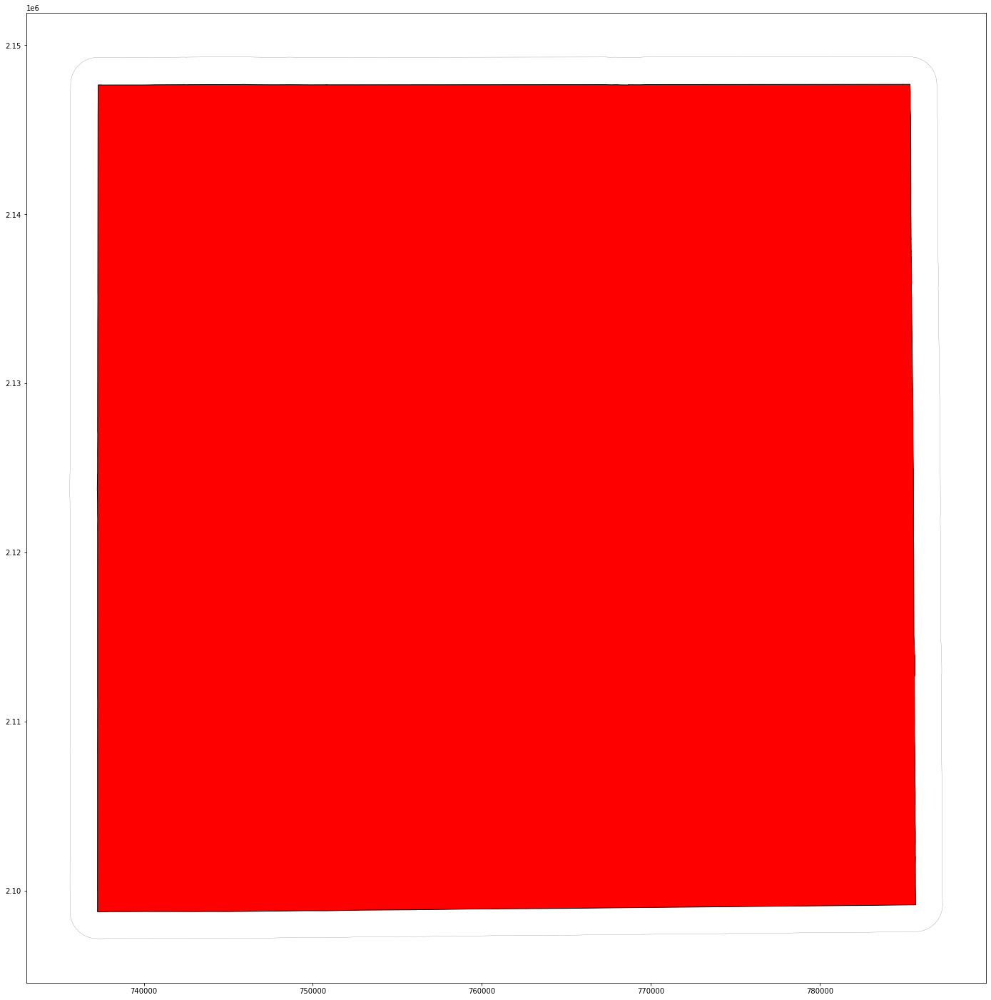

In [588]:
fig, ax = plt.subplots(figsize = (30,25)) 
local_poly.plot(ax=ax,color="red",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 0.15,ax=ax) #Use your second dataframe

# Read the Eco and short term location file as gpd to get geometry

In [589]:
df = gpd.GeoDataFrame(
    nf1, geometry=gpd.points_from_xy(nf1.longitude, nf1.latitude))
df.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (-96.70881 32.70787)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (-96.84244 32.76284)
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (-96.76442 32.91885)
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (-96.66779 32.71307)
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (-96.70038 32.75781)


In [590]:
# set the co-ordinate system first
df = df.set_crs("EPSG:4211")

In [591]:
print(df.crs)

EPSG:4211


In [592]:
# Let's take a copy of our layer
gdf0_proj = df.copy()

# Reproject the geometries by replacing the values with projected ones
eco_proj = gdf0_proj.to_crs(epsg=2845)
eco_proj.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663)
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028)
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411)
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975)


In [593]:
# We can now plot our ``GeoDataFrame``.
#eco_proj.plot(eco_proj, color='red',figsize=(10,10))
#plt.show()

In [594]:
ecoshort0=eco_proj
#ecoshort0=pd.concat([eco_proj,short_proj],axis=0)
ecoshort0.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663)
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028)
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411)
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975)


In [595]:
#ecoshort0.reset_index(inplace=True)

In [596]:
#ecoshort0[ecoshort0.index.duplicated()]

# Filter the location by Extended Study area Boundary

In [597]:
# Clip the data using GeoPandas clip
ecoshort = gpd.clip(ecoshort0, pba)
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
21,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,32.85529,-96.86743,strava-osm divided 1676157 (as primary) & 1194253,419107440.0,POINT (752792.765 2132993.353)
11,P013DAL,Kiest Park Loop Trail at Conservation,permanent,2019,Dallas,3.0,23.417593,0.643836,0.054795,494.0,32.70667,-96.85372,NaN,356118935.0,POINT (754334.030 2116535.270)
10,P012DAL,Kiest Park Loop at Perryton,permanent,2019,Dallas,3.0,108.399134,0.931507,0.123288,627.0,32.71396,-96.84969,NaN,356118935.0,POINT (754699.102 2117349.465)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663)
20,P022DAL,Trinity Strand Trail at Wycliff,permanent,2019,Dallas,3.0,28.393916,4.589041,0.876712,42.0,32.79750,-96.83536,NaN,444489305.0,POINT (755895.496 2126633.035)


In [598]:
count_station=ecoshort.copy()

In [599]:
ecoshort=ecoshort.drop_duplicates(subset='osm_id_sensor')
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
21,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,32.85529,-96.86743,strava-osm divided 1676157 (as primary) & 1194253,419107440.0,POINT (752792.765 2132993.353)
11,P013DAL,Kiest Park Loop Trail at Conservation,permanent,2019,Dallas,3.0,23.417593,0.643836,0.054795,494.0,32.70667,-96.85372,NaN,356118935.0,POINT (754334.030 2116535.270)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663)
20,P022DAL,Trinity Strand Trail at Wycliff,permanent,2019,Dallas,3.0,28.393916,4.589041,0.876712,42.0,32.79750,-96.83536,NaN,444489305.0,POINT (755895.496 2126633.035)
19,P021DAL,Trinity Strand Trail at Turtle Creek Plaza,permanent,2019,Dallas,3.0,42.425728,5.835616,1.123288,23.0,32.79480,-96.82566,NaN,444480443.0,POINT (756808.607 2126348.112)


<AxesSubplot:>

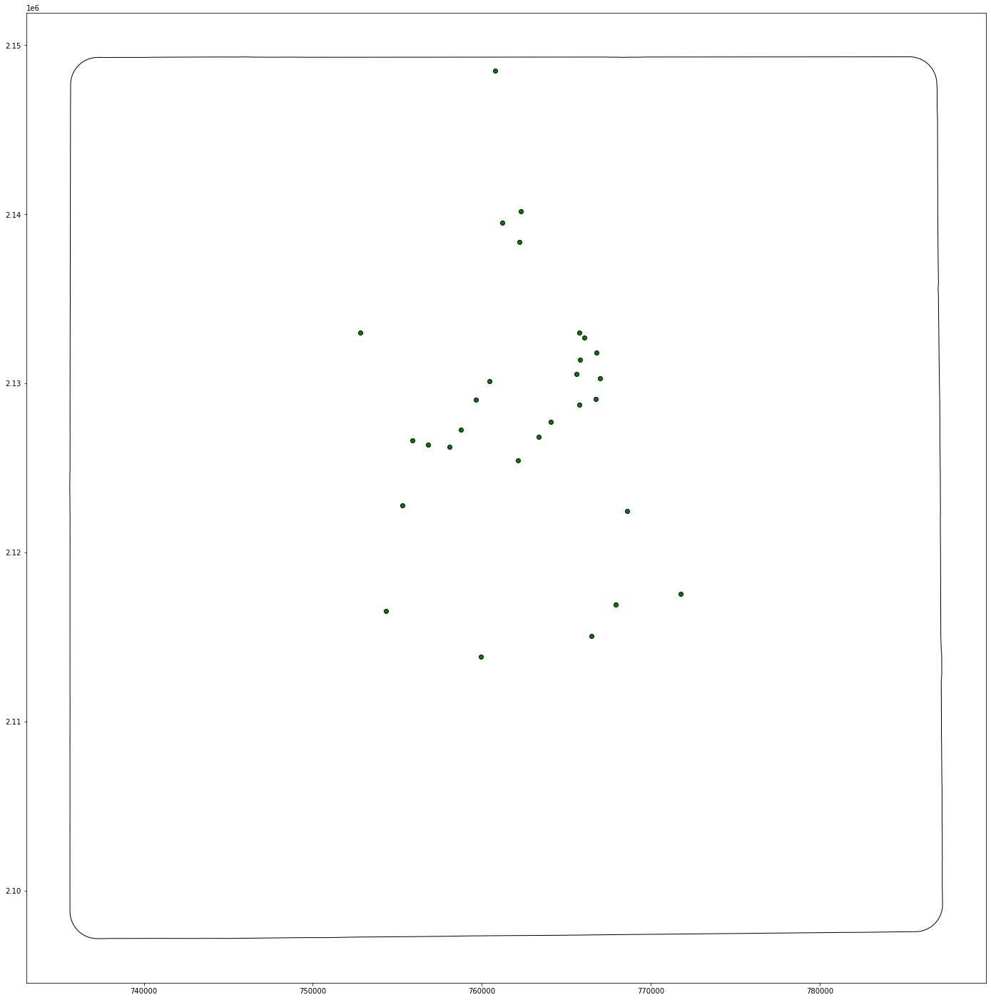

In [600]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="green",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

# geopanda buffer function: https://geopandas.org/docs/user_guide/geometric_manipulations.html

In [601]:
# Buffer file
#gdf1=nf3


In [602]:
gdf1 = ecoshort.copy()
gdf1['geometry'] = gdf1['geometry'].buffer(size)
gdf1.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
21,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,32.85529,-96.86743,strava-osm divided 1676157 (as primary) & 1194253,419107440.0,"POLYGON ((756011.455 2132993.353, 755995.956 2..."
11,P013DAL,Kiest Park Loop Trail at Conservation,permanent,2019,Dallas,3.0,23.417593,0.643836,0.054795,494.0,32.70667,-96.85372,NaN,356118935.0,"POLYGON ((757552.720 2116535.270, 757537.221 2..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,"POLYGON ((758511.829 2122779.663, 758496.330 2..."
20,P022DAL,Trinity Strand Trail at Wycliff,permanent,2019,Dallas,3.0,28.393916,4.589041,0.876712,42.0,32.79750,-96.83536,NaN,444489305.0,"POLYGON ((759114.186 2126633.035, 759098.687 2..."
19,P021DAL,Trinity Strand Trail at Turtle Creek Plaza,permanent,2019,Dallas,3.0,42.425728,5.835616,1.123288,23.0,32.79480,-96.82566,NaN,444480443.0,"POLYGON ((760027.297 2126348.112, 760011.798 2..."


In [603]:
#conda install -c conda-forge contextily #install in your geo_env using command prompt 

#https://geopandas.org/gallery/plotting_basemap_background.html

In [604]:
import contextily as ctx

In [605]:
print(gdf1.crs)

epsg:2845


In [606]:
# Insert City Specific EPSG here to convert 3D to 2D map,for exaple, state plane system EPSG =2838 for Portland
# set the co-ordinate system first
gdfm = gdf1.set_crs("EPSG:2845") # provided by PSU
gdfm = gdfm.to_crs(epsg=3857) # This EPSG just for ploting

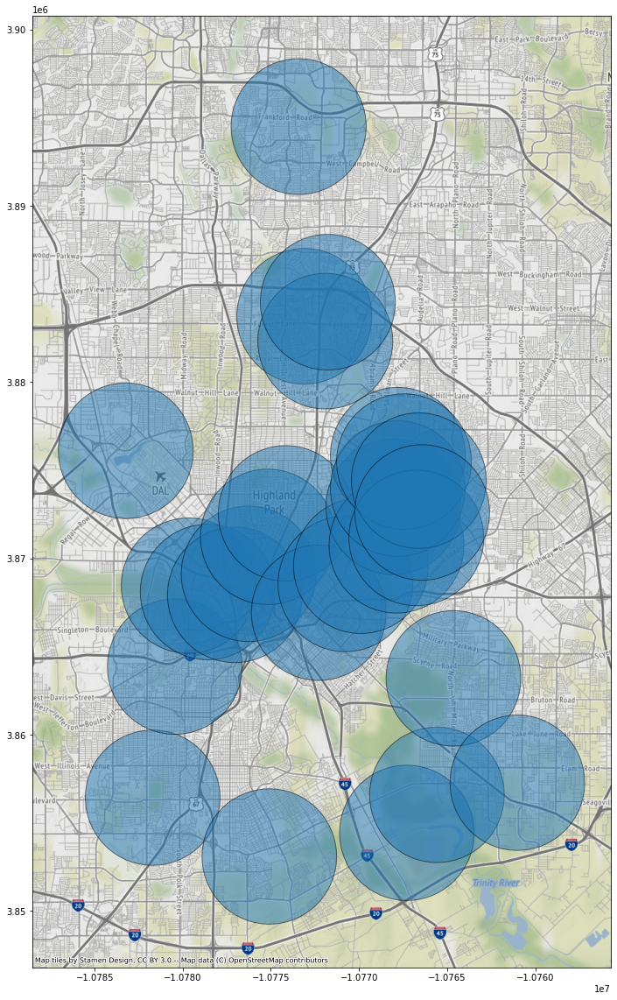

In [607]:
ax = gdfm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

# ploting code: http://darribas.org/gds15/content/labs/lab_03.html

# Calculate O, D and OD line

In [142]:
#bs1

In [143]:
#bs1['StartLatitude'] = bs1['StartLatitude'].apply(pd.to_numeric, errors='coerce')
#bs1['StartLongitude'] = bs1['StartLongitude'].apply(pd.to_numeric, errors='coerce')
#bs1['EndLatitude'] = bs1['EndLatitude'].apply(pd.to_numeric, errors='coerce')
#bs1['EndLongitude'] = bs1['EndLongitude'].apply(pd.to_numeric, errors='coerce')

In [517]:
#bs3=bs1[bs1['StartLatitude'].notna()]
#bs3.shape

# BS Origin

In [518]:
# Origin
#bso = gpd.GeoDataFrame(bs3, geometry=gpd.points_from_xy(bs3.StartLongitude, bs3.StartLatitude))
#bso=bso.loc[:,['RouteID','StartLatitude','StartLongitude','geometry']]
#bso.head(5)

In [519]:
# set the co-ordinate system first
#bso1 = bso.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
#bso1_proj = bso1.to_crs(epsg=2845)
#bso1_proj.head(5)

In [520]:
# Clip the data using GeoPandas clip
#bso1_clip = gpd.clip(bso1_proj, gdf1)
#bso1_clip.head(5)

In [521]:
 #int_bso=gpd.overlay(gdf1, bso1_clip, how='intersection', make_valid=True, keep_geom_type=False)
 #int_bso.head(5)

In [522]:
#int_bso.shape

In [523]:
#int_bso.geometry.plot()
#ax = gdf1.plot(figsize=(40, 30))
#int_bso.geometry.plot(color="red",edgecolor='k',ax=ax)

In [524]:
#output_origin=int_bso.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_origin.columns=["osm_id","Bike Share Origin"]
#output_origin.head()

# BS destination

In [525]:
# Destination
#bsd = gpd.GeoDataFrame(
#    bs3, geometry=gpd.points_from_xy(bs3.EndLongitude, bs3.EndLatitude))
#bsd=bsd.loc[:,['RouteID','EndLatitude','EndLongitude','geometry']]
#bsd.head(5)

In [526]:
# set the co-ordinate system first
#bsd1 = bsd.set_crs("EPSG:4211")
# Reproject the geometries by replacing the values with projected ones
#bsd1_proj = bsd1.to_crs(epsg=2845)
#bsd1_proj.head(5)

In [527]:
# Clip the data using GeoPandas clip
#bsd1_clip = gpd.clip(bsd1_proj, gdf1)
#bsd1_clip.head(5)

In [528]:
#int_bsd=gpd.overlay(gdf1, bsd1_clip, how='intersection', make_valid=True, keep_geom_type=False)
#int_bsd.head(5)

In [529]:
#int_bsd.shape

In [530]:
#int_bsd.geometry.plot()
#plotting    
#ax = gdf1.plot(figsize=(40, 30))
#int_bsd.geometry.plot(color="red",edgecolor='k',ax=ax)

In [531]:
#output_destination=int_bsd.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_destination.columns=["osm_id","Bike Share Destination"]
#output_destination.head()

# Bike Share OD line Crossing

In [532]:
#https://gis.stackexchange.com/questions/303615/creating-linestring-and-length-of-linestring-from-multiple-latlon-points-for-eac
#import shapely.geometry as geom
#bs_all_od=bs3.copy()
#bs_all_od['geometry'] = bs_all_od.apply(lambda x: geom.LineString([(x['StartLongitude'], x['StartLatitude']) , (x['EndLongitude'], x['EndLatitude'])]), axis = 1)
#bs_all_od.head(5)

In [533]:
# exclude the points outside of Portland
#bs_all_od1=bs_all_od[(bs_all_od.StartLongitude<=-122)&(bs_all_od.StartLongitude>=-124)]
#bs_all_od1=bs_all_od1[(bs_all_od1.EndLongitude<=-122)&(bs_all_od1.EndLongitude>=-124)]
#bs_all_od1=bs_all_od1[(bs_all_od1.StartLatitude>=45)&(bs_all_od1.StartLatitude<=46)]
#bs_all_od1=bs_all_od1[(bs_all_od1.EndLatitude>=45)&(bs_all_od1.EndLatitude<=46)]
#bs_all_od1.head(5)

In [534]:
#print(bs_all_od.crs)

In [535]:
#print(bs_all_od1.info())

In [536]:
#bs_all_od2 = gpd.GeoDataFrame(bs_all_od, geometry='geometry', crs={'init': 'epsg:4211'})
#bs_all_od2.head(5)

In [537]:
#print(bs_all_od2.crs)

In [538]:
#print(bs_all_od2.info())

In [539]:
# set the co-ordinate system first
#bs_all_od2 = bs_all_od1.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
#bs_all_od2_proj = bs_all_od2.to_crs(epsg=2845)
#bs_all_od2_proj.head(5)

In [540]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#bs_all_od2_proj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [541]:
#spj = gpd.sjoin( bs_all_od2_proj,gdf1, how="inner", op='intersects')

In [542]:
# Clip the data using GeoPandas clip
#odc1_clip = gpd.clip(bs_all_od2_proj,gdf1)
#odc1_clip.head(5)

In [543]:
#int_odl=gpd.overlay(gdf1, odc1_clip, how='intersection', make_valid=True, keep_geom_type=False)
#int_odl.head(5)

In [544]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#spj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [545]:
#output_odl=spj.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_odl.columns=["osm_id","Bike Share Crossing"]
#output_odl.head()

# Now import land use shape file

In [546]:
#luse = gpd.read_file("../input/osm-data/landuse.shp")
luse.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((-96.79838 32.80328, -96.79565 32.800..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((-96.79683 32.80305, -96.79627 32.802..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((-96.76081 32.76285, -96.75738 32.765..."
3,27449698,None,cemetery,"POLYGON ((-96.68890 32.69676, -96.68956 32.696..."
4,27934749,None,brownfield,"POLYGON ((-96.80863 32.92689, -96.80772 32.926..."


# Define and then Convert the co-ordinate system

In [547]:
# set the co-ordinate system first
#lusec = luse.set_crs("EPSG:4326")

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [548]:
# Let's take a copy of our layer
luse_proj = lusec.copy()

# Reproject the geometries by replacing the values with projected ones
luse_proj = luse_proj.to_crs(epsg=2845)
luse_proj.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((759349.176 2127329.116, 759608.290 2..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((759494.448 2127305.231, 759547.747 2..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((762940.873 2122904.128, 763256.324 2..."
3,27449698,None,cemetery,"POLYGON ((769803.942 2115689.980, 769742.562 2..."
4,27934749,None,brownfield,"POLYGON ((758168.521 2141018.687, 758253.580 2..."


# Visualize

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

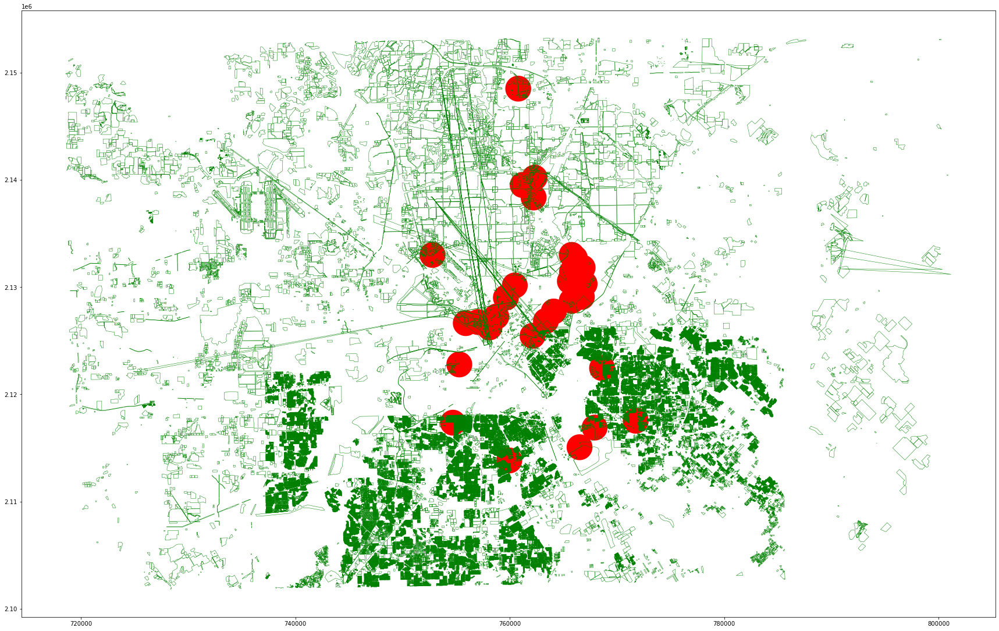

In [549]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
luse_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# Now clip landuse with buffer

In [550]:
import os 
from shapely.geometry import Point
from geopandas import GeoDataFrame, read_file
from geopandas.tools import overlay

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [551]:
#!pip install Rtree
#!pip install pygeos
#!pip install ujson
#!pip install wheel

In [552]:
#luse_proj.exterior.type

In [553]:
#gdf1.exterior.type

In [554]:
#luse_proj.exterior.is_valid

In [555]:
#gdf1.exterior.is_valid

In [556]:
# Avoid this error- TopologyException: Input geom 0 is invalid: Self-intersection at 2307899.6553931381 208383.49467431975. Do the followings
luse_proj["geometry2"]=luse_proj.geometry.buffer(0)
# Now drop geometry column and rename geometry 2 equal to geometry again
luse_proj=luse_proj.drop(["geometry"],axis=1)
luse_proj.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
luse_proj.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((759349.176 2127329.116, 759608.290 2..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((759494.448 2127305.231, 759543.886 2..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((762940.873 2122904.128, 763256.324 2..."
3,27449698,None,cemetery,"POLYGON ((769803.942 2115689.980, 770385.811 2..."
4,27934749,None,brownfield,"POLYGON ((758168.521 2141018.687, 758253.580 2..."


In [557]:
# Clip the data using GeoPandas clip
buffer_clip = gpd.clip(luse_proj, gdf1)
buffer_clip.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((759608.290 2127074.504, 759607.778 2..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((759543.886 2127352.345, 759589.139 2..."
8,28544622,None,meadow,"POLYGON ((757582.466 2127403.473, 757620.844 2..."
16,30779080,None,transport,"MULTIPOLYGON (((760654.700 2128362.523, 760652..."
17,30789572,McCommas Bluff Sanitary Landfill,landfill,"POLYGON ((766260.945 2114043.743, 766048.183 2..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


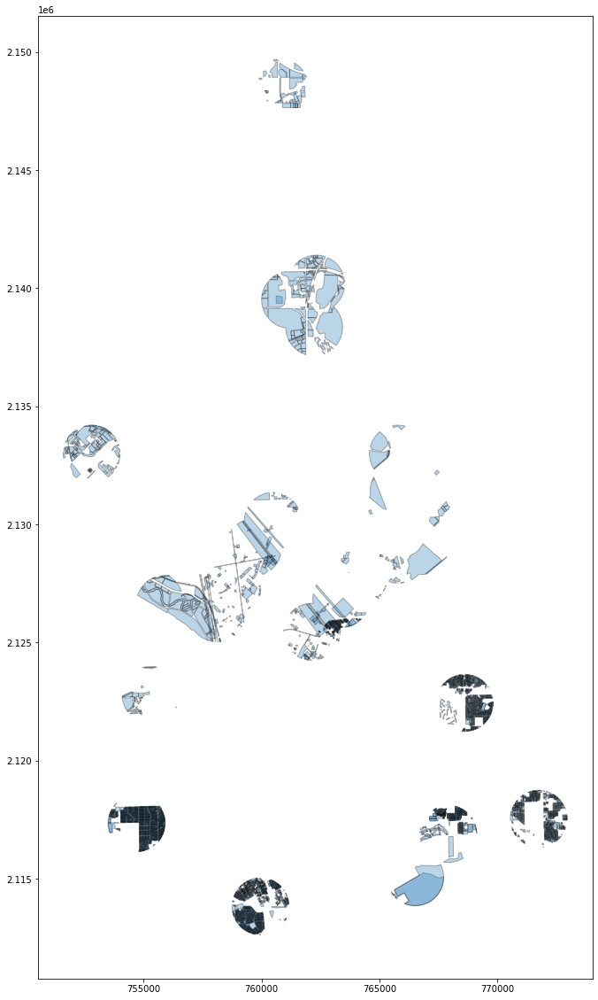

In [558]:
ax = buffer_clip.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect the clipped area with Buffer ID

In [559]:
 intdata=gpd.overlay(gdf1, buffer_clip, how='intersection', make_valid=True, keep_geom_type=False)
 intdata.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406180,None,residential,"POLYGON ((767398.963 2117459.989, 767386.896 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406182,None,residential,"POLYGON ((767399.296 2117545.712, 767119.731 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406183,None,residential,"POLYGON ((767399.822 2117647.663, 767263.157 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172574,None,residential,"POLYGON ((768961.546 2117162.529, 768914.863 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172577,None,residential,"POLYGON ((769099.211 2117126.045, 769101.828 2..."


In [560]:
intdata["Area"]=intdata["geometry"].area*10.76 # in ft2
intdata.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406180,None,residential,"POLYGON ((767398.963 2117459.989, 767386.896 2...",286544.030916
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406182,None,residential,"POLYGON ((767399.296 2117545.712, 767119.731 2...",287271.314365
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406183,None,residential,"POLYGON ((767399.822 2117647.663, 767263.157 2...",165181.370002
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172574,None,residential,"POLYGON ((768961.546 2117162.529, 768914.863 2...",667901.961734
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172577,None,residential,"POLYGON ((769099.211 2117126.045, 769101.828 2...",73775.695366


#https://geopandas.org/docs/user_guide/set_operations.html

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

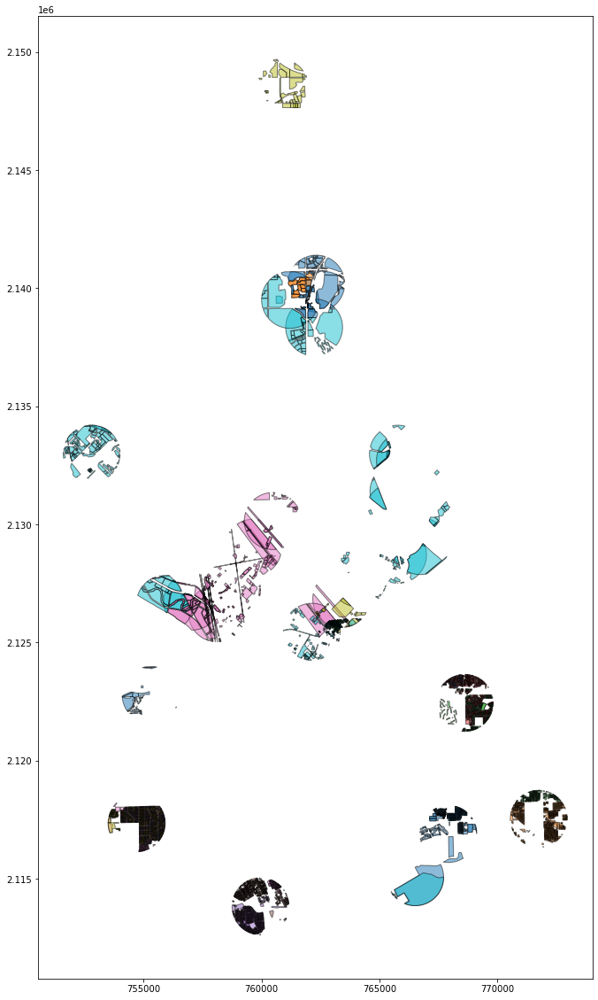

In [561]:
intdata.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

# Aggregate data by ID

#https://geopandas.org/docs/user_guide/aggregation_with_dissolve.html

In [562]:
output_landuse=intdata.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_landuse.columns=['osm_id','type','Area']
output_landuse.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,type,Area
0,28545390.0,commercial,164633.018854
1,28545390.0,grass,105891.039020
2,28545390.0,residential,471404.636935
3,28545390.0,retail,741190.263530
4,97891369.0,brownfield,452586.009073


In [563]:
# Calculate commercial area
commercial  = intdata[intdata['type'].str.contains('commercial')]
output_commercial = commercial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_commercial.columns=['osm_id','Commercial Area ']
output_commercial.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Commercial Area
0,28545390.0,1.646330e+05
1,97891369.0,6.427435e+06
2,144869316.0,2.041074e+05
3,170833583.0,1.250162e+07
4,178552402.0,6.062868e+03


In [564]:
gdf1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,"POLYGON ((769122.403 2116890.570, 769116.591 2..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,"POLYGON ((756500.147 2122779.663, 756494.335 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,"POLYGON ((763523.226 2140195.028, 763517.414 2..."
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,"POLYGON ((772957.388 2117533.411, 772951.576 2..."
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,"POLYGON ((769817.739 2122440.975, 769811.927 2..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

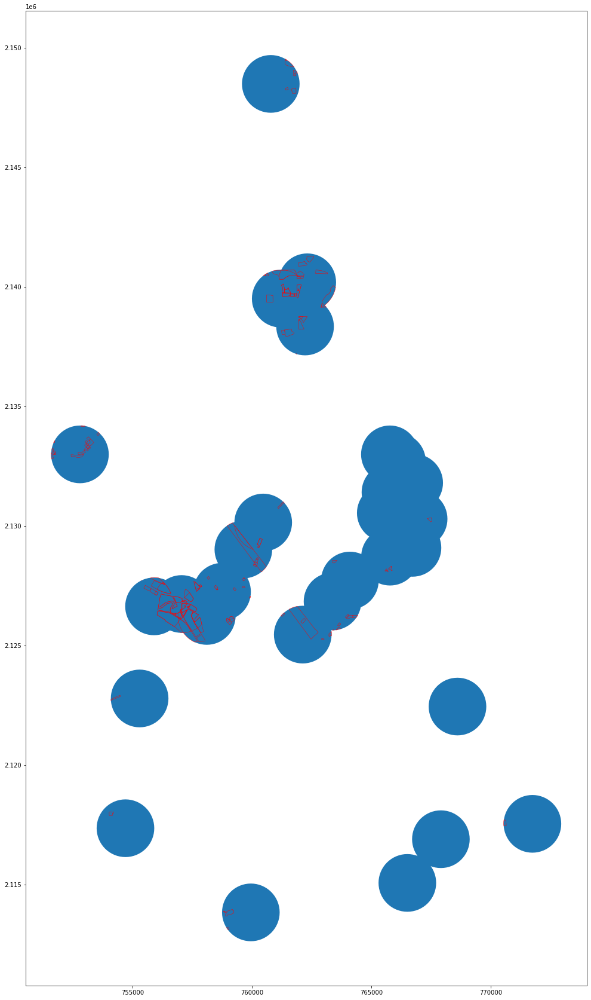

In [565]:
#plotting    
ax = gdf1.plot(figsize=(40, 30))
commercial.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [566]:
# Calculate inductrial area
industrial  = intdata[intdata['type'].str.contains('industrial')]
output_industrial = industrial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_industrial.columns=['osm_id','Industrial Area ']
output_industrial.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Industrial Area
0,97891369.0,7.602619e+05
1,170833583.0,3.665475e+03
2,419107440.0,1.767779e+06
3,444480443.0,1.368979e+06
4,444489305.0,8.510734e+06


In [567]:
# Calculate residential area
residential  = intdata[intdata['type'].str.contains('residential')]
output_residential = residential.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_residential.columns=['osm_id','Residential_Area ']
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Area
0,28545390.0,4.714046e+05
1,97891369.0,9.799915e+06
2,144869316.0,8.518198e+06
3,170833583.0,1.189110e+06
4,178552402.0,1.263517e+07


In [568]:
residential.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406180,None,residential,"POLYGON ((767398.963 2117459.989, 767386.896 2...",286544.030916
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406182,None,residential,"POLYGON ((767399.296 2117545.712, 767119.731 2...",287271.314365
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,472406183,None,residential,"POLYGON ((767399.822 2117647.663, 767263.157 2...",165181.370002
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172574,None,residential,"POLYGON ((768961.546 2117162.529, 768914.863 2...",667901.961734
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,673172577,None,residential,"POLYGON ((769099.211 2117126.045, 769101.828 2...",73775.695366


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

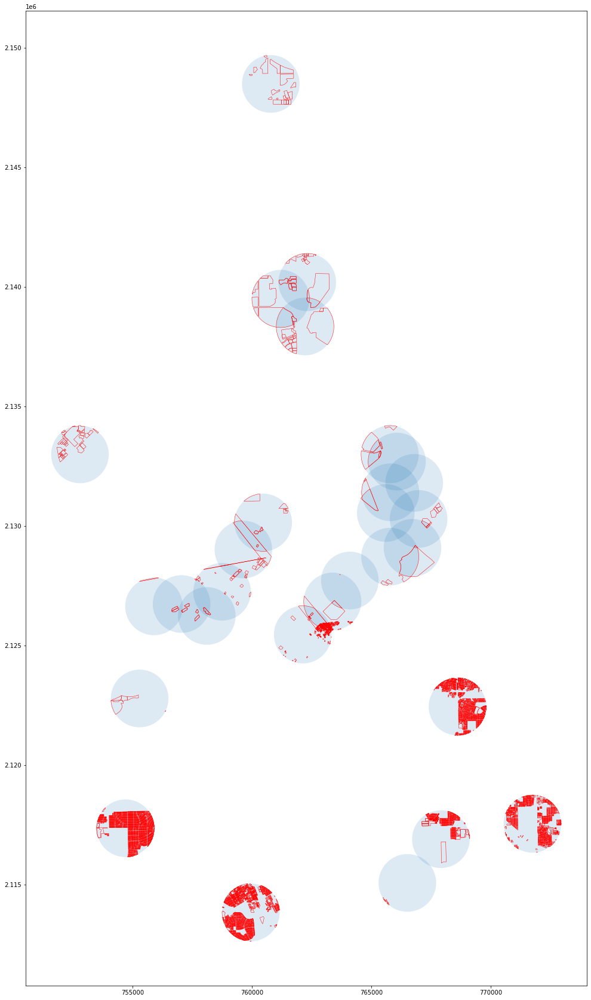

In [569]:
#plotting    
ax = gdf1.plot(figsize=(40, 30),alpha=0.15)
residential.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [570]:
# Calculate retail area
retail  = intdata[intdata['type'].str.contains('retail')]
output_retail = retail.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_retail.columns=['osm_id','Retail Area']
output_retail.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Retail Area
0,28545390.0,7.411903e+05
1,97891369.0,9.707575e+05
2,144869316.0,1.054881e+06
3,170833583.0,2.277859e+05
4,178552402.0,5.193749e+05


In [571]:
# Calculate grass area
grass  = intdata[intdata['type'].str.contains('grass')]
output_grass = grass.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_grass.columns=['osm_id','Grass Area']
output_grass.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Grass Area
0,28545390.0,1.058910e+05
1,97891369.0,1.119178e+06
2,144869316.0,1.553107e+04
3,170833583.0,1.415823e+06
4,223881858.0,8.067830e+05


In [572]:
output_grass.index

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RangeIndex(start=0, stop=20, step=1)

# Use the Natural Shape file to calculate the Park, water and green spaces

In [573]:
#nature=gpd.read_file("../input/osm-data/natural.shp")
nature.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((-97.22756 32.86751, -97.22378 32.867..."
1,6091409,North Lake,water,"POLYGON ((-96.85277 32.83343, -96.85291 32.833..."
2,10067542,None,water,"POLYGON ((-97.12306 32.98145, -97.12292 32.981..."
3,13991735,Dick Faram Park,park,"POLYGON ((-97.20499 32.86722, -97.20500 32.868..."
4,13992439,Northfield Park,park,"POLYGON ((-97.20021 32.88953, -97.20018 32.891..."


In [574]:
# set the co-ordinate system first
# nature = nature.set_crs("EPSG:4326")
# Let's take a copy of our layer
nature_proj = nature.copy()

# Reproject the geometries by replacing the values with projected ones
nature_proj = nature_proj.to_crs(epsg=2845)
nature_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"POLYGON ((754203.211 2130590.609, 754190.014 2..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [575]:
#nature_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

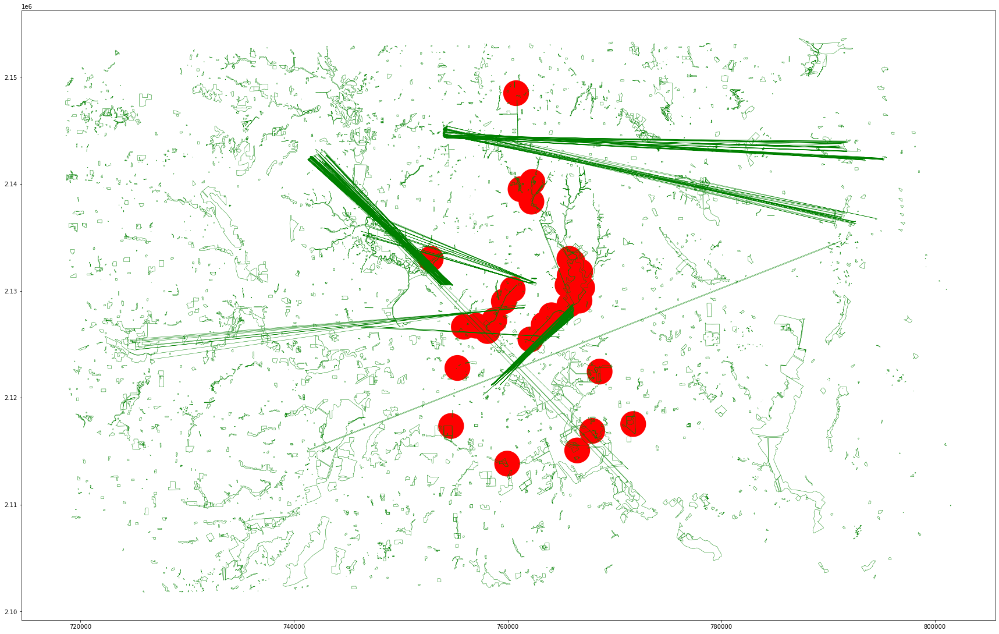

In [576]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
nature_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# There is some invalid polygon in the shape file that need to pass through zero geom to correct it

In [577]:
nature_proj["geometry2"]=nature_proj.geometry.buffer(0)
nature_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry,geometry2
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2...","POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"POLYGON ((754203.211 2130590.609, 754190.014 2...","MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2...","POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2...","POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2...","POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [578]:
# Now drop geometry column and rename geometry 2 equal to geometry again
nature_proj1=nature_proj.drop(["geometry"],axis=1)
nature_proj1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry2
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [579]:
nature_proj1.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
nature_proj1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [580]:
# Clip the data using GeoPandas clip
buffer_clip_nature = gpd.clip(nature_proj1, gdf1)
buffer_clip_nature.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
1,6091409,North Lake,water,"MULTIPOLYGON (((753184.512 2132170.255, 753397..."
14,25605587,None,park,"POLYGON ((758510.503 2125966.696, 758520.658 2..."
20,25662645,Bachman Lake,water,"POLYGON ((753760.431 2133474.809, 753802.112 2..."
24,25662923,None,water,"POLYGON ((753761.551 2133710.858, 753783.170 2..."
32,25856940,Griggs Park,park,"POLYGON ((759687.328 2126709.575, 759700.802 2..."
51,26477079,Kiest Park,park,"POLYGON ((754026.821 2117360.715, 754791.744 2..."
52,26565221,None,park,"POLYGON ((759647.344 2127661.700, 759713.130 2..."
53,26565940,Glencoe Park,park,"POLYGON ((761056.463 2130718.785, 761305.365 2..."
54,27089872,White Rock Lake,water,"POLYGON ((766391.140 2133042.124, 766407.650 2..."
60,27098690,None,water,"POLYGON ((752202.015 2131995.772, 752211.800 2..."


In [581]:
inter_nature=gpd.overlay(gdf1, buffer_clip_nature, how='intersection', make_valid=True, keep_geom_type=False)
inter_nature.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,28545862,None,forest,"MULTIPOLYGON (((769099.211 2116655.094, 769070..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,28545862,None,forest,"POLYGON ((765656.388 2115914.687, 765744.154 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,28780504,None,forest,"POLYGON ((766911.805 2117561.148, 766953.396 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,29261977,None,forest,"POLYGON ((767797.088 2115689.374, 767679.920 2..."
4,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.79357,-96.81182,parallel link (1687094),170833583.0,29261977,None,forest,"POLYGON ((758675.838 2125167.995, 758568.761 2..."


In [582]:
inter_nature["Area"]=inter_nature["geometry"].area*10.76 # in ft2
inter_nature.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,28545862,None,forest,"MULTIPOLYGON (((769099.211 2116655.094, 769070...",1.775864e+07
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,28545862,None,forest,"POLYGON ((765656.388 2115914.687, 765744.154 2...",1.085739e+07
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,28780504,None,forest,"POLYGON ((766911.805 2117561.148, 766953.396 2...",1.197586e+05
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,29261977,None,forest,"POLYGON ((767797.088 2115689.374, 767679.920 2...",4.306792e+06
4,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.79357,-96.81182,parallel link (1687094),170833583.0,29261977,None,forest,"POLYGON ((758675.838 2125167.995, 758568.761 2...",7.226831e+06


In [583]:
#inter_nature.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [584]:
output_nature=inter_nature.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_nature.head()

,osm_id_sensor,type,Area
0,28545390.0,forest,4.149158e+06
1,28545390.0,park,3.623662e+06
2,28545390.0,water,4.762897e+06
3,97891369.0,forest,6.681534e+06
4,97891369.0,park,4.797505e+06


In [585]:
# Calculate park area
park  = inter_nature[inter_nature['type'].str.contains('park')]
output_park = park.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_park.columns=['osm_id',"Park Area"]
output_park.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Park Area
0,28545390.0,3.623662e+06
1,97891369.0,4.797505e+06
2,144869316.0,1.648904e+07
3,170833583.0,2.532343e+06
4,178552402.0,2.406286e+07


In [586]:
# Calculate water area
water  = inter_nature[inter_nature['type'].str.contains('water')]
output_water= water.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_water.columns=['osm_id',"Water Area"]
output_water.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Water Area
0,28545390.0,4.762897e+06
1,97891369.0,6.821404e+06
2,144869316.0,1.294224e+07
3,170833583.0,2.084396e+02
4,178552402.0,1.413142e+07


In [587]:
# Calculate forest area
forest  = inter_nature[inter_nature['type'].str.contains('forest')]
output_forest= forest.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_forest.columns=['osm_id',"Forest Area"]
output_forest.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Forest Area
0,28545390.0,4.149158e+06
1,97891369.0,6.681534e+06
2,144869316.0,3.258024e+06
3,170833583.0,1.758050e+07
4,178552402.0,2.345186e+05


# Use the Point Shape file to calculate the Bicycle parking, Bus/Train stops, Intersection Density, School/College/University

In [588]:
#pts=gpd.read_file("../input/osm-data/points.shp")
pts.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
0,26451915,None,None,motorway_junctio,POINT (-96.99637 32.98783)
1,26452038,None,None,motorway_junctio,POINT (-96.98721 32.98615)
2,26452114,None,None,motorway_junctio,POINT (-96.97995 32.98980)
3,26452174,None,None,motorway_junctio,POINT (-96.96866 32.99386)
4,26452225,None,None,motorway_junctio,POINT (-96.95477 32.99772)


In [589]:
# set the co-ordinate system first
#pts = pts.set_crs("EPSG:4326")
# Let's take a copy of our layer
pts_proj = pts.copy()

# Reproject the geometries by replacing the values with projected ones
pts_proj = pts_proj.to_crs(epsg=2845)
pts_proj.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
0,26451915,None,None,motorway_junctio,POINT (740516.824 2147508.476)
1,26452038,None,None,motorway_junctio,POINT (741375.369 2147334.832)
2,26452114,None,None,motorway_junctio,POINT (742047.382 2147748.615)
3,26452174,None,None,motorway_junctio,POINT (743096.215 2148214.553)
4,26452225,None,None,motorway_junctio,POINT (744387.980 2148661.297)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

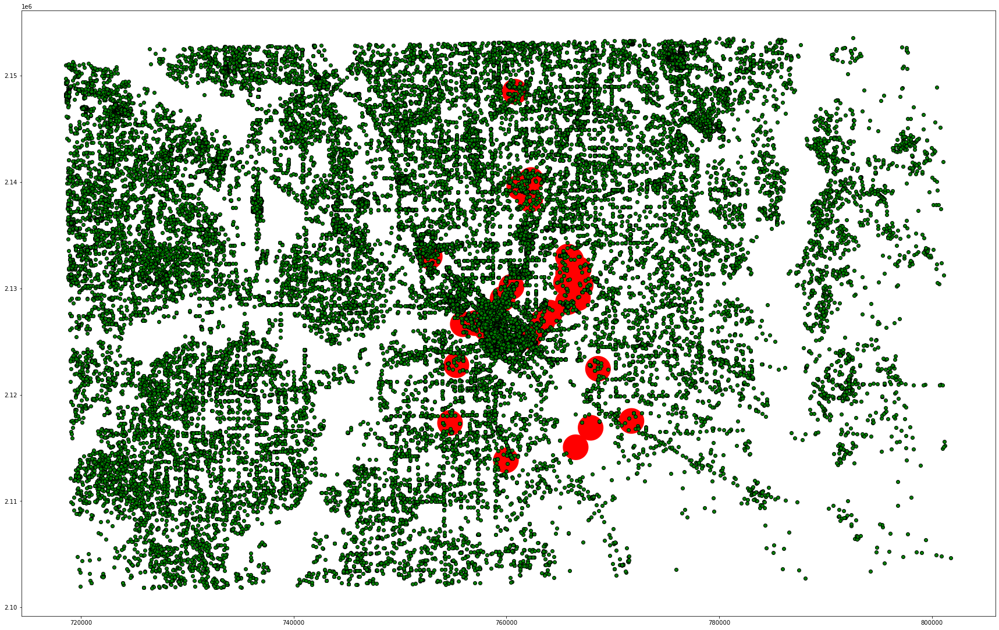

In [590]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
pts_proj.plot(color="green",edgecolor='k',ax=ax) #Use your second dataframe

In [591]:
# Clip the data using GeoPandas clip
buffer_clip_pts = gpd.clip(pts_proj, gdf1)
buffer_clip_pts.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
7,29577601,None,None,motorway_junctio,POINT (763354.045 2140552.899)
8,30759132,None,None,motorway_junctio,POINT (762502.684 2141082.144)
32,81539330,None,None,motorway_junctio,POINT (758512.337 2125193.483)
41,81540205,None,None,motorway_junctio,POINT (756754.381 2127084.885)
55,81541904,None,None,motorway_junctio,POINT (759855.915 2127070.728)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


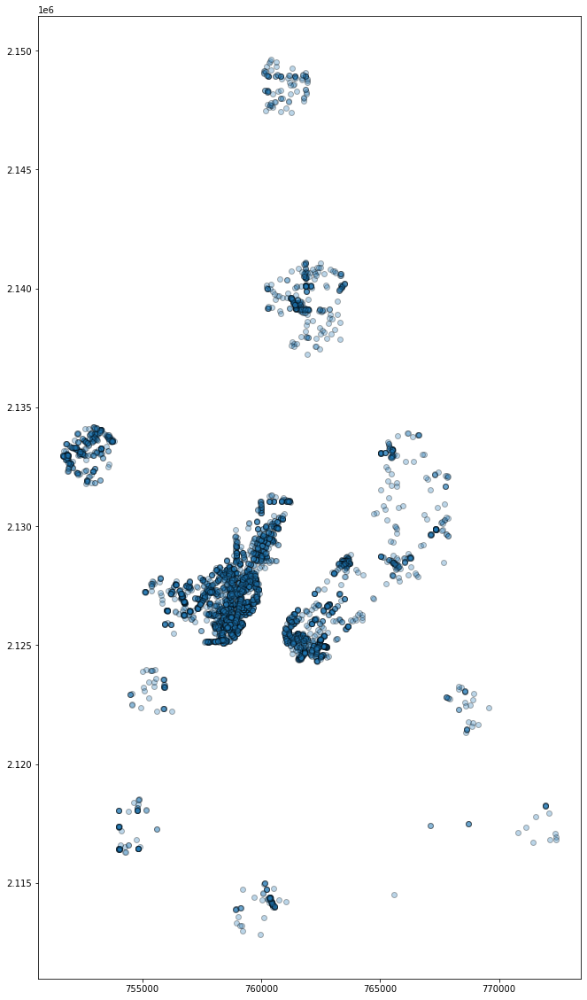

In [592]:
ax = buffer_clip_pts.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [593]:
inter_pts=gpd.overlay(gdf1, buffer_clip_pts, how='intersection', make_valid=True, keep_geom_type=False)
inter_pts.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,81816362,None,None,traffic_signals,POINT (768723.207 2117479.242)
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,82057789,None,None,traffic_signals,POINT (767108.384 2117408.341)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,82067285,None,None,traffic_signals,POINT (768716.296 2117494.661)
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,82127664,None,None,traffic_signals,POINT (768728.773 2117495.839)
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1629231181,None,None,traffic_signals,POINT (767107.710 2117421.006)


# Calculate the bicycle parking

In [594]:
#k1 = df.loc[(df.Product == p_id) & (df.Time >= start_time) & (df.Time < end_time), ['Time', 'Product']]
b_parking = inter_pts[inter_pts['type'].str.contains('bicycle_parking')]
b_parking.head(5)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
178,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,925479183,None,None,bicycle_parking,POINT (762002.986 2139077.348)
179,P024DAL,White Rock Creek Trail at Cottonwood Creek Trail,permanent,2019,Dallas,3.0,301.800595,50.068493,7.753425,1029.0,32.90218,-96.76572,NaN,449047423.0,925479183,None,None,bicycle_parking,POINT (762002.986 2139077.348)
180,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,32.91284,-96.77643,NaN,492447672.0,925479183,None,None,bicycle_parking,POINT (762002.986 2139077.348)
842,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.79357,-96.81182,parallel link (1687094),170833583.0,1529252099,None,None,bicycle_parking,POINT (758996.396 2125662.590)
1860,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.79357,-96.81182,parallel link (1687094),170833583.0,2018218498,None,None,bicycle_parking,POINT (757648.053 2126341.627)


In [595]:
output_bparking=b_parking.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bparking.columns=["osm_id","Bicycle Parking"]
output_bparking.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Bicycle Parking
0,170833583.0,2
1,178552402.0,1
2,313514317.0,1
3,373275516.0,1
4,419107440.0,1


# Calculate bus stops

In [596]:
transit_stops= inter_pts[inter_pts['type'].str.contains('bus_stop')]
transit_stops.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
115,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,-79070454,None,None,bus_stop,POINT (762566.041 2139060.752)
116,P024DAL,White Rock Creek Trail at Cottonwood Creek Trail,permanent,2019,Dallas,3.0,301.800595,50.068493,7.753425,1029.0,32.90218,-96.76572,NaN,449047423.0,-79070454,None,None,bus_stop,POINT (762566.041 2139060.752)
117,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,-79070453,None,None,bus_stop,POINT (763483.641 2140153.735)
159,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,897774774,None,None,bus_stop,POINT (761849.302 2141026.551)
160,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,897787074,None,None,bus_stop,POINT (761885.195 2140161.224)


In [597]:
output_bstop=transit_stops.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bstop.columns=["osm_id","Bus Stops"]
output_bstop.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Bus Stops
0,223881880.0,2
1,419107440.0,2
2,444480443.0,2
3,444489305.0,1
4,449047423.0,1


# Calculate school/college/university

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


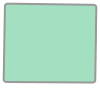

In [598]:
polygon = pba.to_crs(4326).iloc[0]
polygon

In [599]:
# Import school
tags = {'amenity': 'school'}
scl = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]

In [600]:
# set the co-ordinate system first
scl = scl.set_crs("EPSG:4326")
# Let's take a copy of our layer
scl_proj = scl.copy()

# Reproject the geometries by replacing the values with projected ones
scl_proj =scl_proj.to_crs(epsg=2845)
scl_proj.head(5)
scl_proj['geometry']=scl_proj['geometry'].centroid
buffer_clip_scl = gpd.clip(scl_proj, gdf1)
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
output_school=inter_scl.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_school.columns=["osm_id","School"]
output_school.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,School
0,28545390.0,4
1,97891369.0,2
2,144869316.0,1
3,178552402.0,1
4,223881858.0,3


# Closest distance to school

In [601]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [602]:
ecoshort['min_dist_to_school'] = ecoshort.geometry.apply(min_distance_ppoly, args=(scl_proj,))*3.28084
output_school_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_school"]]
output_school_distance.columns=["osm_id","min_dist_to_school"]
output_school_distance.head()

,osm_id,min_dist_to_school
0,496723098.0,4010.859297
1,356309596.0,2112.838300
2,493380742.0,1681.682738
3,461234382.0,2926.101046
4,472409339.0,3209.924147


In [603]:
# Import college
tags = {'amenity': 'college'}
coll = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
coll = coll.set_crs("EPSG:4326")
# Let's take a copy of our layer
coll_proj = coll.copy()

# Reproject the geometries by replacing the values with projected ones
coll_proj =coll_proj.to_crs(epsg=2845)
coll_proj['geometry']=coll_proj['geometry'].centroid
buffer_clip_coll = gpd.clip(coll_proj, gdf1)
inter_coll=gpd.overlay(gdf1, buffer_clip_coll, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [604]:
output_college=inter_coll.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_college.columns=["osm_id","college"]
output_college.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,college
0,97891369.0,1


# Closest distance to college

In [605]:
ecoshort['min_dist_to_college'] = ecoshort.geometry.apply(min_distance_ppoly, args=(coll_proj,))*3.28084
output_college_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_college"]]
output_college_distance.columns=["osm_id","min_dist_to_college"]
output_college_distance.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,min_dist_to_college
0,496723098.0,35171.758189
1,356309596.0,12970.284590
2,493380742.0,6991.896593
3,461234382.0,35625.793719
4,472409339.0,23656.239658


In [606]:
# Import University
tags = {'amenity': 'university'}
uni = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
uni = uni.set_crs("EPSG:4326")
# Let's take a copy of our layer
uni_proj = uni.copy()

# Reproject the geometries by replacing the values with projected ones
uni_proj =uni_proj.to_crs(epsg=2845)
uni_proj['geometry']=uni_proj['geometry'].centroid
buffer_clip_uni = gpd.clip(uni_proj, gdf1)
inter_uni=gpd.overlay(gdf1, buffer_clip_uni, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [607]:
inter_uni

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,abbr_name,old_ref,building,alt_name,phone,denomination,religion,ways,type,geometry
0,P017DAL,Santa Fe at Hill,permanent,2019,Dallas,3.0,209.282738,50.09589,13.273973,710.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (761371.943 2126218.297)


In [608]:
output_university=inter_uni.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_university.loc[output_university['geometry'] > 0, 'geometry'] = 1 # if you get error, comment off this line
output_university.loc[output_university['geometry'] ==0, 'geometry'] = 0 # if you get error, comment off this line
output_university.columns=["osm_id","University"]
output_university.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,University
0,97891369.0,1


# Closest distance to university

In [609]:
ecoshort['min_dist_to_university'] = ecoshort.geometry.apply(min_distance_ppoly, args=(uni_proj,))*3.28084
output_university_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_university"]]
output_university_distance.columns=["osm_id","min_dist_to_university"]
output_university_distance.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,min_dist_to_university
0,496723098.0,17504.499814
1,356309596.0,16150.771328
2,493380742.0,25103.203284
3,461234382.0,29384.589591
4,472409339.0,23751.485989


# Calculate OSM node density

In [610]:
# lets bring the road shape file node to calculate the intersection density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


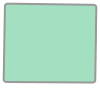

In [611]:
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

In [612]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
ox.config(log_file=True,log_console=True,use_cache=True)
#place="Portland,USA"
#Construct the street network
G=ox.graph_from_polygon(polygon,network_type="drive",simplify=False)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(G,node_color='yellow',edge_color='blue')

In [613]:
nodes, edges = ox.graph_to_gdfs(G)
nodes.head(5)

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81538115,32.618647,-96.770977,3,NaN,NaN,POINT (-96.77098 32.61865)
81538167,32.650720,-96.908446,3,NaN,NaN,POINT (-96.90845 32.65072)
81538169,32.650717,-96.909002,2,NaN,NaN,POINT (-96.90900 32.65072)
81538171,32.650703,-96.909191,2,NaN,NaN,POINT (-96.90919 32.65070)
81538173,32.650684,-96.909440,2,NaN,NaN,POINT (-96.90944 32.65068)


In [614]:
print(nodes.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [615]:
# set the co-ordinate system first
node = nodes.set_crs("EPSG:4326")
# Let's take a copy of our layer
node_proj = node.copy()

# Reproject the geometries by replacing the values with projected ones
node_proj = node_proj.to_crs(epsg=2845)
node_proj.head(5)

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81538115,32.618647,-96.770977,3,NaN,NaN,POINT (762251.609 2106899.984)
81538167,32.650720,-96.908446,3,NaN,NaN,POINT (749298.720 2110252.171)
81538169,32.650717,-96.909002,2,NaN,NaN,POINT (749246.602 2110251.005)
81538171,32.650703,-96.909191,2,NaN,NaN,POINT (749228.869 2110249.228)
81538173,32.650684,-96.909440,2,NaN,NaN,POINT (749205.544 2110246.767)


In [616]:
# Clip the data using GeoPandas clip
buffer_clip_node = gpd.clip(node_proj, gdf1)
buffer_clip_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81551355,32.767034,-96.854269,2,NaN,NaN,POINT (754178.466 2123226.620)
81551357,32.766894,-96.854288,2,NaN,NaN,POINT (754176.893 2123211.025)
81551359,32.766652,-96.854397,2,NaN,NaN,POINT (754167.121 2123184.022)
81551361,32.766545,-96.854474,2,NaN,NaN,POINT (754160.018 2123172.156)
81551363,32.766449,-96.854572,2,NaN,NaN,POINT (754151.015 2123161.257)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


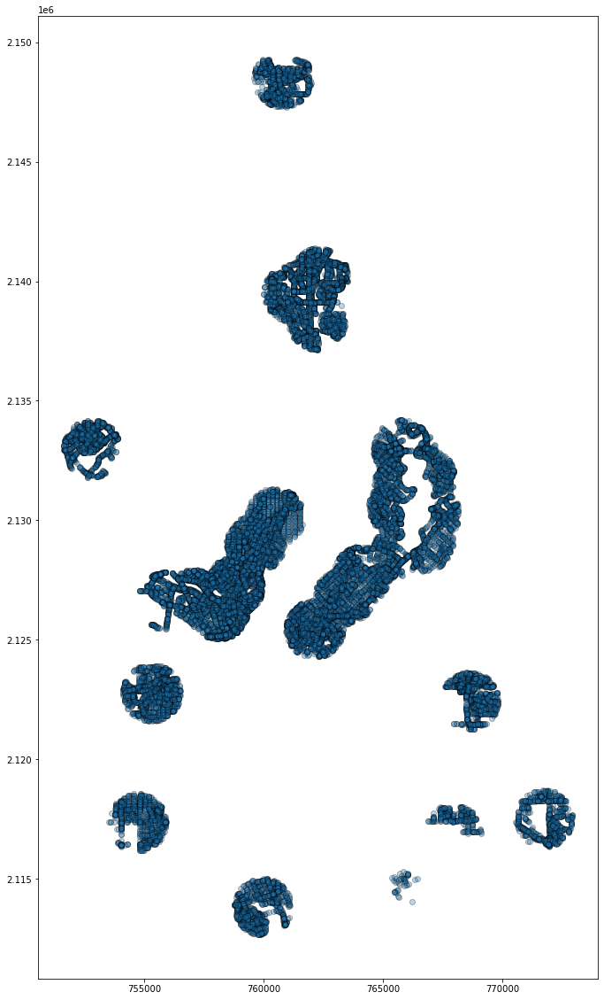

In [617]:
ax = buffer_clip_node.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [618]:
 inter_node=gpd.overlay(gdf1, buffer_clip_node, how='intersection', make_valid=True, keep_geom_type=False)
 inter_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,y,x,street_count,highway,ref,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,32.715286,-96.701587,3,NaN,NaN,POINT (768579.078 2117723.733)
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,32.714841,-96.700167,2,NaN,NaN,POINT (768713.037 2117676.642)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,32.717860,-96.705470,1,NaN,NaN,POINT (768210.257 2118002.890)
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,32.708282,-96.698520,2,NaN,NaN,POINT (768879.860 2116952.119)
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,32.716310,-96.701621,2,NaN,NaN,POINT (768573.949 2117837.166)


Intersection density per mile2

In [619]:
output_intersection_density= inter_node.groupby(by=['osm_id_sensor'])['geometry'].count()/(3.1416*size*size*3.861e-07)
output_intersection_density.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor
28545390.0      729.993046
97891369.0     1233.631660
144869316.0     503.638613
170833583.0    1690.301728
178552402.0     331.609244
Name: geometry, dtype: float64

In [620]:
output_intersection_density1=output_intersection_density.reset_index()
output_intersection_density1.columns=["osm_id","OSM_node_Density"]
output_intersection_density1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,OSM_node_Density
0,28545390.0,729.993046
1,97891369.0,1233.631660
2,144869316.0,503.638613
3,170833583.0,1690.301728
4,178552402.0,331.609244


# Calculate the true intersection density

In [621]:
custom_filter = ox.downloader._get_osm_filter("drive")
custom_filter += '["highway"!~"motor"]'  # filter out freeways
Ga = ox.graph_from_polygon(polygon, custom_filter=custom_filter, simplify=True)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [622]:
nodesa, edgesa = ox.graph_to_gdfs(Ga)
# set the co-ordinate system first
nodea = nodesa.set_crs("EPSG:4326")
# Let's take a copy of our layer
nodea_proj = nodea.copy()

In [623]:
# Reproject the geometries by replacing the values with projected ones
nodea_proj = nodea_proj.to_crs(epsg=2845)
buffer_clip_nodea = gpd.clip(nodea_proj, gdf1)
inter_nodea=gpd.overlay(gdf1, buffer_clip_nodea, how='intersection', make_valid=True, keep_geom_type=False)
outputa_intersection_density= inter_nodea.groupby(by=['osm_id_sensor'])['geometry'].count()/(3.1416*size*size*3.861e-07)
output_intersection_densitya=outputa_intersection_density.reset_index()
output_intersection_densitya.columns=["osm_id","Intersection_Density"]
output_intersection_densitya.head()

,osm_id,Intersection_Density
0,28545390.0,175.990572
1,97891369.0,214.470825
2,144869316.0,94.502976
3,170833583.0,215.036711
4,178552402.0,72.999305


# Calculate the Number of Lanes

In [624]:
edges.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes  ref maxspeed bridge access  \
u        v          key                                                     
81538115 7373901193 0     False   3.063   NaN  NaN      NaN    NaN    NaN   
         7373977034 0     False  42.250   NaN  NaN      NaN    NaN    NaN   
         81538113   0     False  72.282   NaN  NaN      NaN    NaN    NaN   
81538167 7281969133 0     False  31.936   NaN  NaN      NaN    NaN    NaN   
         81719249   0     False  24.908   NaN  NaN      NaN    NaN    NaN   

                        junction tunnel  \
u        v          key                   
81538115 7373901193 0        NaN    NaN   
         7373977034 0        NaN    NaN   
         81538113   0        NaN    NaN   
81538167 7281969133 0        NaN    NaN   
         81719249   0        NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (-96.77098 32.61865, -96.77101 32.6...  
         7373977034 0    LINESTRING (-96.77098 32.61865, -96.77053 32.6...  
         81538113   0    LINESTRING (-96.77098 32.61865, -96.77099 32.6...  
81538167 7281969133 0    LINESTRING (-96.90845 32.65072, -96.90879 32.6...  
         81719249   0    LINESTRING (-96.90845 32.65072, -96.90845 32.6...

In [625]:
print(edges.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [626]:
# set the co-ordinate system first
edge = edges.set_crs("EPSG:4326")
# Let's take a copy of our layer
edge_proj = edge.copy()

# Reproject the geometries by replacing the values with projected ones
edge_proj = edge_proj.to_crs(epsg=2845)
edge_proj.head(5)

osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes  ref maxspeed bridge access  \
u        v          key                                                     
81538115 7373901193 0     False   3.063   NaN  NaN      NaN    NaN    NaN   
         7373977034 0     False  42.250   NaN  NaN      NaN    NaN    NaN   
         81538113   0     False  72.282   NaN  NaN      NaN    NaN    NaN   
81538167 7281969133 0     False  31.936   NaN  NaN      NaN    NaN    NaN   
         81719249   0     False  24.908   NaN  NaN      NaN    NaN    NaN   

                        junction tunnel  \
u        v          key                   
81538115 7373901193 0        NaN    NaN   
         7373977034 0        NaN    NaN   
         81538113   0        NaN    NaN   
81538167 7281969133 0        NaN    NaN   
         81719249   0        NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (762251.609 2106899.984, 762248.540...  
         7373977034 0    LINESTRING (762251.609 2106899.984, 762293.942...  
         81538113   0    LINESTRING (762251.609 2106899.984, 762251.950...  
81538167 7281969133 0    LINESTRING (749298.720 2110252.171, 749266.722...  
         81719249   0    LINESTRING (749298.720 2110252.171, 749298.307...

In [627]:
# Consider rows without NAN
edge_clean = edge_proj[edge_proj['lanes'].notna()]
edge_clean2 = edge_clean [edge_clean.lanes!=0]
edge_clean2.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                           name  \
u        v          key                                             
81538180 82077735   0    759044969           South Santa Fe Trail   
         82077732   0    759044969           South Santa Fe Trail   
81538203 82109937   0    367429087               West Main Street   
         81869578   0    367429087               West Main Street   
81538621 3700583568 0    315701237           East Pioneer Parkway   
81539117 4949974111 0      9936907                            NaN   
81539119 81843586   0    122797972  South Walton Walker Boulevard   
         4949974113 0    504903996                            NaN   
81539635 3894617040 0      9939870                            NaN   
81539637 81539639   0      9939870                            NaN   

                               highway  oneway   length lanes       ref  \
u        v          key                                                   
81538180 82077735   0         tertiary   False   60.471     4       NaN   
         82077732   0         tertiary   False   36.220     4       NaN   
81538203 82109937   0          primary   False  101.143     4    TX 180   
         81869578   0          primary   False  100.139     4    TX 180   
81538621 3700583568 0          primary    True    6.532     3  Spur 303   
81539117 4949974111 0    motorway_link    True  101.864     1       NaN   
81539119 81843586   0         motorway    True   49.161     4   Loop 12   
         4949974113 0    motorway_link    True   47.086     1       NaN   
81539635 3894617040 0    motorway_link    True   34.289     1       NaN   
81539637 81539639   0    motorway_link    True   37.131     1       NaN   

                        maxspeed bridge access junction tunnel  \
u        v          key                                          
81538180 82077735   0        NaN    NaN    NaN      NaN    NaN   
         82077732   0        NaN    NaN    NaN      NaN    NaN   
81538203 82109937   0        NaN    NaN    NaN      NaN    NaN   
         81869578   0        NaN    NaN    NaN      NaN    NaN   
81538621 3700583568 0     45 mph    NaN    NaN      NaN    NaN   
81539117 4949974111 0        NaN    NaN    NaN      NaN    NaN   
81539119 81843586   0     70 mph    NaN    NaN      NaN    NaN   
         4949974113 0        NaN    NaN    NaN      NaN    NaN   
81539635 3894617040 0        NaN    NaN    NaN      NaN    NaN   
81539637 81539639   0        NaN    NaN    NaN      NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538180 82077735   0    LINESTRING (749158.821 2110246.836, 749117.913...  
         82077732   0    LINESTRING (749158.821 2110246.836, 749181.663...  
81538203 82109937   0    LINESTRING (738208.942 2120111.242, 738108.964...  
         81869578   0    LINESTRING (738208.942 2120111.242, 738307.929...  
81538621 3700583568 0    LINESTRING (741157.339 2116633.344, 741163.878...  
81539117 4949974111 0    LINESTRING (748132.706 2119263.040, 748148.190...  
81539119 81843586   0    LINESTRING (748119.432 2119149.789, 748114.236...  
         4949974113 0    LINESTRING (748119.432 2119149.789, 748127.838...  
81539635 3894617040 0    LINESTRING (748139.606 2117962.134, 748127.808...  
81539637 81539639   0    LINESTRING (748036.036 2117720.102, 748018.017...

In [628]:
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'lanes']

ecoshort['lanes'] = ecoshort.geometry.apply(nearest_linestring, df_lines=edge_clean2)
ecoshort
ecoshort_lane=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [629]:
ecoshort_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3


In [630]:
output_lane=ecoshort_lane.loc[:,['osm_id_sensor','lanes']]
output_lane.columns=['osm_id','lanes']
output_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,lanes
0,496723098.0,1
1,356309596.0,2
2,493380742.0,1
3,461234382.0,4
4,472409339.0,3


# Calculate the cycleway-left, cycleway-right and cycleway from OSM bike Network within the buffer

In [631]:
# This is osmnx's default OSM tag set for links
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction']


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [632]:
### Modify run params here ###
extra_way_tags = ['cycleway', 'cycleway:left', 'cycleway:right']  # add'l OSM tags to keep

In [633]:
# Can add any OSM tag--will be populated if available
useful_tags = ox.settings.useful_tags_way + extra_way_tags
ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction', 'cycleway', 'cycleway:left', 'cycleway:right']


In [634]:
Gc=ox.graph_from_polygon(polygon, network_type='bike',simplify=False)
#G = gpd.clip(G, pba)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(Gc,node_color='yellow',edge_color='blue')

In [635]:
nodesc, edgesc = ox.graph_to_gdfs(Gc)
edgesc.head(5)

osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes service  ref maxspeed  \
u        v          key                                               
81538115 7373901193 0     False   3.063   NaN     NaN  NaN      NaN   
         7373977034 0     False  42.250   NaN     NaN  NaN      NaN   
         81538113   0     False  72.282   NaN     NaN  NaN      NaN   
81538167 7281969133 0     False  31.936   NaN     NaN  NaN      NaN   
         81719249   0     False  24.908   NaN     NaN  NaN      NaN   

                        cycleway:right cycleway access bridge cycleway:left  \
u        v          key                                                       
81538115 7373901193 0              NaN      NaN    NaN    NaN           NaN   
         7373977034 0              NaN      NaN    NaN    NaN           NaN   
         81538113   0              NaN      NaN    NaN    NaN           NaN   
81538167 7281969133 0              NaN      NaN    NaN    NaN           NaN   
         81719249   0              NaN      NaN    NaN    NaN           NaN   

                        junction tunnel width  \
u        v          key                         
81538115 7373901193 0        NaN    NaN   NaN   
         7373977034 0        NaN    NaN   NaN   
         81538113   0        NaN    NaN   NaN   
81538167 7281969133 0        NaN    NaN   NaN   
         81719249   0        NaN    NaN   NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (-96.77098 32.61865, -96.77101 32.6...  
         7373977034 0    LINESTRING (-96.77098 32.61865, -96.77053 32.6...  
         81538113   0    LINESTRING (-96.77098 32.61865, -96.77099 32.6...  
81538167 7281969133 0    LINESTRING (-96.90845 32.65072, -96.90879 32.6...  
         81719249   0    LINESTRING (-96.90845 32.65072, -96.90845 32.6...

In [636]:
# set the co-ordinate system first
edgesc = edgesc.set_crs("EPSG:4326")
# Let's take a copy of our layer
cycleway_proj = edgesc.copy()

# Reproject the geometries by replacing the values with projected ones
cycleway_proj = cycleway_proj.to_crs(epsg=2845)
cycleway_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes service  ref maxspeed  \
u        v          key                                               
81538115 7373901193 0     False   3.063   NaN     NaN  NaN      NaN   
         7373977034 0     False  42.250   NaN     NaN  NaN      NaN   
         81538113   0     False  72.282   NaN     NaN  NaN      NaN   
81538167 7281969133 0     False  31.936   NaN     NaN  NaN      NaN   
         81719249   0     False  24.908   NaN     NaN  NaN      NaN   

                        cycleway:right cycleway access bridge cycleway:left  \
u        v          key                                                       
81538115 7373901193 0              NaN      NaN    NaN    NaN           NaN   
         7373977034 0              NaN      NaN    NaN    NaN           NaN   
         81538113   0              NaN      NaN    NaN    NaN           NaN   
81538167 7281969133 0              NaN      NaN    NaN    NaN           NaN   
         81719249   0              NaN      NaN    NaN    NaN           NaN   

                        junction tunnel width  \
u        v          key                         
81538115 7373901193 0        NaN    NaN   NaN   
         7373977034 0        NaN    NaN   NaN   
         81538113   0        NaN    NaN   NaN   
81538167 7281969133 0        NaN    NaN   NaN   
         81719249   0        NaN    NaN   NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (762251.609 2106899.984, 762248.540...  
         7373977034 0    LINESTRING (762251.609 2106899.984, 762293.942...  
         81538113   0    LINESTRING (762251.609 2106899.984, 762251.950...  
81538167 7281969133 0    LINESTRING (749298.720 2110252.171, 749266.722...  
         81719249   0    LINESTRING (749298.720 2110252.171, 749298.307...

In [637]:
# Clip the data using GeoPandas clip
buffer_clip_cycleway = gpd.clip(cycleway_proj, gdf1)
buffer_clip_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                    name      highway  oneway  \
u        v        key                                                           
81560115 82233330 0     10012948    Winding Brook Circle      service   False   
         82016010 0     91208328     North Plymouth Road     tertiary   False   
         82015841 0    599487791     North Plymouth Road     tertiary   False   
81563870 81563872 0      9938370                     NaN      service   False   
         81969781 0    590657832  North Montclair Avenue  residential   False   

                        length lanes service  ref maxspeed cycleway:right  \
u        v        key                                                       
81560115 82233330 0     24.231   NaN     NaN  NaN      NaN            NaN   
         82016010 0     17.891   NaN     NaN  NaN      NaN            NaN   
         82015841 0     18.358   NaN     NaN  NaN      NaN            NaN   
81563870 81563872 0    145.563   NaN     NaN  NaN      NaN            NaN   
         81969781 0     73.613   NaN     NaN  NaN      NaN            NaN   

                      cycleway access bridge cycleway:left junction tunnel  \
u        v        key                                                        
81560115 82233330 0        NaN    NaN    NaN           NaN      NaN    NaN   
         82016010 0        NaN    NaN    NaN           NaN      NaN    NaN   
         82015841 0        NaN    NaN    NaN           NaN      NaN    NaN   
81563870 81563872 0        NaN    NaN    NaN           NaN      NaN    NaN   
         81969781 0        NaN    NaN    NaN           NaN      NaN    NaN   

                      width                                           geometry  
u        v        key                                                           
81560115 82233330 0     NaN  LINESTRING (754527.145 2122900.339, 754551.006...  
         82016010 0     NaN  LINESTRING (754527.145 2122900.339, 754541.729...  
         82015841 0     NaN  LINESTRING (754527.145 2122900.339, 754509.353...  
81563870 81563872 0     NaN  LINESTRING (754935.071 2121801.888, 755051.985...  
         81969781 0     NaN  LINESTRING (754935.071 2121801.888, 754934.384...

In [638]:
 inter_cycleway=gpd.overlay(gdf1, buffer_clip_cycleway, how='intersection', make_valid=True, keep_geom_type=False)
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed,cycleway:right,cycleway,access,bridge,cycleway:left,junction,tunnel,width,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768579.691..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768647.986..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768564.916..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768578.012..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.691 2117715.315, 768582.427..."


In [639]:
 inter_cycleway["Length"]= inter_cycleway["geometry"].length*3.28084 # in ft
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,cycleway:right,cycleway,access,bridge,cycleway:left,junction,tunnel,width,geometry,Length
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768579.691...",27.691759
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768647.986...",226.074470
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768564.916...",46.475967
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.078 2117723.733, 768578.012...",154.145744
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (768579.691 2117715.315, 768582.427...",129.327186


In [640]:
# Calculate the cycleway left, right and lane length within the buffer
bike_left=inter_cycleway[inter_cycleway['cycleway:left']=='lane']
bike_right=inter_cycleway[inter_cycleway['cycleway:right']=='lane']
bikeway_lane= inter_cycleway[inter_cycleway['cycleway']=='lane']
bikeway_all_lane=pd.concat([bike_left,bike_right,bikeway_lane],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_lane=bikeway_all_lane.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_lane.columns=["osm_id","cycleway_lane_all"]
output_bikeway_all_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_all
0,97891369.0,444.819462
1,170833583.0,8665.802834
2,356309596.0,16418.975081
3,444480443.0,1942.305866
4,444489305.0,6769.028164


In [641]:
cycleway_lane0= cycleway_proj[cycleway_proj['cycleway']=='lane']
cycleway_lane01= cycleway_proj[cycleway_proj['cycleway:left']=='lane']
cycleway_lane011= cycleway_proj[cycleway_proj['cycleway:right']=='lane']
cycleway_lane=pd.concat([cycleway_lane0,cycleway_lane01,cycleway_lane01],axis=0)
cycleway_lane.head()
lane_merged_inner = pd.merge(right=ecoshort, left=cycleway_lane, left_on='osmid', right_on='osm_id_sensor',how='inner')
# Convert output_bikeway_all as binary
output_bikeway_all_lane_binary=lane_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_lane_binary.columns=["osm_id","cycleway_lane_binary"]
output_bikeway_all_lane_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_binary


In [642]:
# Calculate the cycleway left, right amd track all together
bike_left_track=inter_cycleway[inter_cycleway['cycleway:left']=='track']
bike_right_track=inter_cycleway[inter_cycleway['cycleway:right']=='track']
bikeway_track= inter_cycleway[inter_cycleway['cycleway']=='track']
bikeway_all_track=pd.concat([bike_left_track,bike_right_track,bikeway_track],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_track=bikeway_all_track.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_track.columns=["osm_id","cycleway_track_all"]
output_bikeway_all_track.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all


In [643]:
cycleway_track0= cycleway_proj[cycleway_proj['cycleway:left']=='track']
cycleway_track01= cycleway_proj[cycleway_proj['cycleway:right']=='track']
cycleway_track011= cycleway_proj[cycleway_proj['cycleway']=='track']
cycleway_track1=pd.concat([cycleway_track0,cycleway_track01,cycleway_track011],axis=0)
cycleway_track1.head()
track_merged_inner = pd.merge(right=ecoshort, left=cycleway_track1, left_on='osmid', right_on='osm_id_sensor',how='inner')
# Convert output_bikeway_track all as binary
# Convert output_bikeway_track all as binary
output_bikeway_all_track_binary=track_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_track_binary.columns=["osm_id","cycleway_track_all_binary"]
output_bikeway_all_track_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all_binary


# OSM Functional System Programming

In [644]:
#road = gpd.read_file("../input/osm-data/roads.shp")
road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (-96.99746 32.98827, -97.00047 32.9..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (-97.00603 32.99058, -97.00568 32.9..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (-96.99295 32.98645, -96.99329 32.9..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (-96.99882 32.98826, -96.99810 32.9..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (-96.99669 32.98806, -96.99731 32.9..."


In [645]:
print(road.crs)

EPSG:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [646]:
# set the co-ordinate system first
#road = road.set_crs("EPSG:4326")

In [647]:
# Let's take a copy of our layer
road_proj = road.copy()

# Reproject the geometries by replacing the values with projected ones
road_proj = road_proj.to_crs(epsg=2845)
road_proj.head(5)

,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [648]:
#road_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

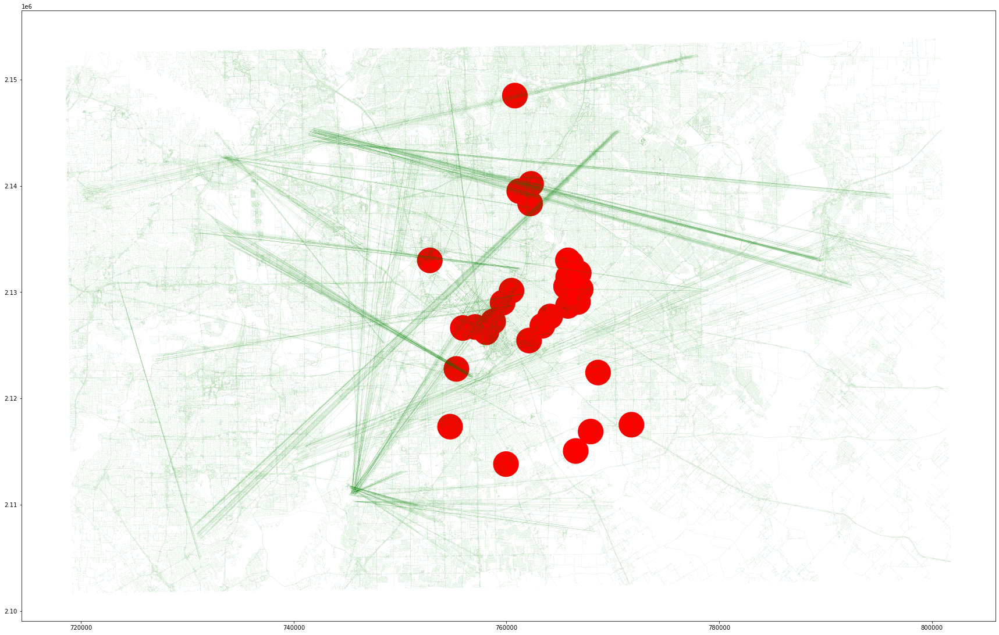

In [649]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
road_proj.plot(color="green",edgecolor='k',linewidth = 0.05,ax=ax) #Use your second dataframe

#Clip road file with buffer file

In [650]:
# Clip the data using GeoPandas clip
buffer_clip_road = gpd.clip(road_proj, gdf1)
buffer_clip_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
27,4652037,None,None,motorway_link,1,1,70.0,"LINESTRING (762792.986 2140831.593, 762739.061..."
72,9936845,Trellis Court,None,residential,0,0,NaN,"LINESTRING (761588.953 2126425.830, 761634.595..."
75,9936848,Rutgers Drive,None,residential,0,0,NaN,"LINESTRING (764609.574 2132697.084, 764625.863..."
94,9936872,Fairfield Avenue,None,residential,0,0,NaN,"LINESTRING (759314.678 2130067.372, 759312.822..."
98,9936877,Southeast 8th Street,None,residential,1,0,NaN,"MULTILINESTRING ((767446.530 2122754.756, 7694..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


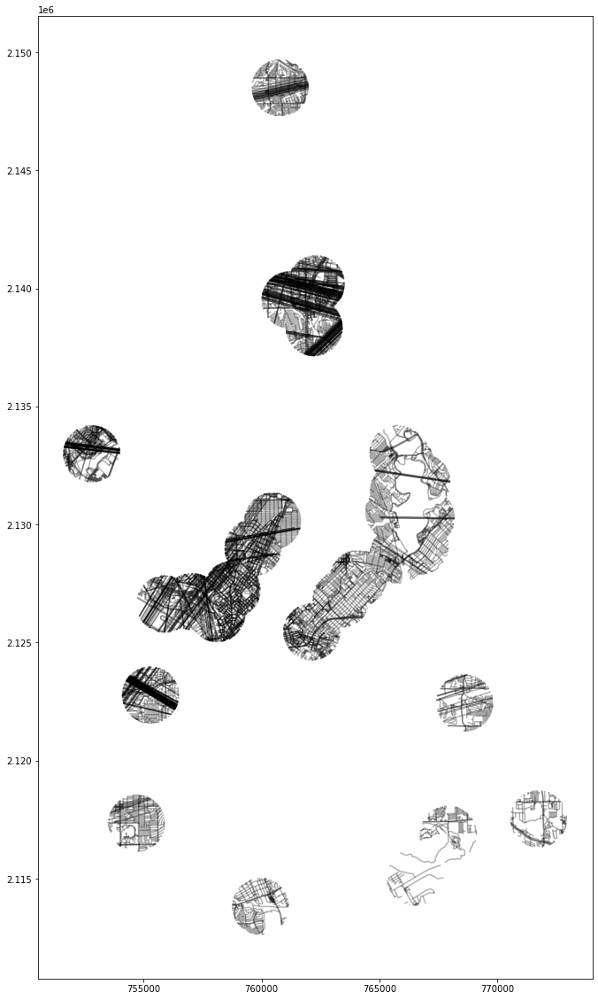

In [651]:
ax = buffer_clip_road.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect

In [652]:
 inter_road=gpd.overlay(gdf1, buffer_clip_road, how='intersection', make_valid=True, keep_geom_type=False)
 inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,9937044,Bissonet Avenue,None,service,0,0,NaN,"LINESTRING (768579.078 2117723.733, 768579.691..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,9939127,None,None,track,0,0,NaN,"LINESTRING (769087.159 2116606.982, 769077.346..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,9940840,None,None,service,0,0,NaN,"LINESTRING (768879.067 2116967.188, 768878.189..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,9940843,None,None,service,0,0,NaN,"LINESTRING (768402.433 2117993.812, 768359.128..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,9941146,None,None,service,0,0,NaN,"LINESTRING (768573.949 2117837.166, 768516.413..."


# Calculate the length of the road segments

In [653]:
inter_road["Length"]=inter_road["geometry"].length*3.28084 # in ft
inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,9937044,Bissonet Avenue,None,service,0,0,NaN,"LINESTRING (768579.078 2117723.733, 768579.691...",157.018944
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,9939127,None,None,track,0,0,NaN,"LINESTRING (769087.159 2116606.982, 769077.346...",2083.508417
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,9940840,None,None,service,0,0,NaN,"LINESTRING (768879.067 2116967.188, 768878.189...",935.627521
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,9940843,None,None,service,0,0,NaN,"LINESTRING (768402.433 2117993.812, 768359.128...",496.722555
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,9941146,None,None,service,0,0,NaN,"LINESTRING (768573.949 2117837.166, 768516.413...",523.636505


# Aggregrate the road functional class

In [654]:
output_roadfc=inter_road.groupby(by=['osm_id_sensor','type'])['Length'].sum()
output_roadfc

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor  type        
28545390.0     cycleway          8656.144855
               footway          70411.590036
               primary           9827.390925
               residential     155366.933496
               secondary        16907.472018
                                   ...      
547170074.0    service         289166.908654
               steps                4.438626
               tertiary         20648.190727
               track             1703.372962
               unclassified       134.982196
Name: Length, Length: 367, dtype: float64

# Calculate the primary road

In [655]:
primary= inter_road[inter_road['type'].str.contains('primary')]
output_primary=primary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_primary.columns=["osm_id","Primary"]
output_primary.head()

,osm_id,Primary
0,28545390.0,9827.390925
1,97891369.0,34200.971467
2,144869316.0,32776.113826
3,170833583.0,47443.011617
4,178552402.0,29444.795305


In [656]:
# Calculate secondary
secondary= inter_road[inter_road['type'].str.contains('secondary')]
output_secondary=secondary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_secondary.columns=["osm_id","Secondary"]
output_secondary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Secondary
0,28545390.0,17704.980073
1,97891369.0,28101.080590
2,144869316.0,31462.371202
3,170833583.0,64634.910244
4,178552402.0,22999.527231


In [657]:
# Calculate tertiary
tertiary= inter_road[inter_road['type'].str.contains('tertiary')]
output_tertiary=tertiary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_tertiary.columns=["osm_id","Tertiary"]
output_tertiary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Tertiary
0,28545390.0,14022.275001
1,97891369.0,21767.687362
2,144869316.0,21256.498018
3,170833583.0,66081.326633
4,178552402.0,20274.531720


In [658]:
# Calculate residential
residential= inter_road[inter_road['type'].str.contains('residential')]
output_residential= residential.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_residential.columns=["osm_id","Residential_Road"]
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Road
0,28545390.0,155366.933496
1,97891369.0,137503.924602
2,144869316.0,83202.586579
3,170833583.0,133874.012568
4,178552402.0,75505.159980


In [659]:
# Calculate path
path= inter_road[inter_road['type'].str.contains('path')]
output_path= path.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_path.columns=["osm_id","Path"]
output_path.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Path
0,97891369.0,3.441499
1,144869316.0,1903.287283
2,170833583.0,8881.342494
3,178552402.0,1353.396453
4,223881858.0,4860.378264


In [660]:
# calculate cycleway
# Calculate path
cycleway = inter_road[inter_road['type'].str.contains('cycleway')]
output_cycleway = cycleway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_cycleway.columns=["osm_id","Cycleway"] 
output_cycleway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Cycleway
0,28545390.0,8656.144855
1,97891369.0,7609.144274
2,144869316.0,13636.740505
3,170833583.0,34124.332984
4,178552402.0,5067.852688


In [661]:
# Calculate footway
footway = inter_road[inter_road['type'].str.contains('footway')]
output_footway = footway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_footway.columns=["osm_id","Footway"] 
output_footway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Footway
0,28545390.0,70411.590036
1,97891369.0,125893.438166
2,144869316.0,39365.109357
3,170833583.0,268199.948788
4,178552402.0,35397.967788


# Calculcate the mean Speed

In [662]:
# Exclude NAN and zero value first then take the mean
inter_road.maxspeed.describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    948.000000
mean      46.023207
std       15.373131
min        5.000000
25%       35.000000
50%       40.000000
75%       60.000000
max       75.000000
Name: maxspeed, dtype: float64

In [663]:
# Consider rows without NAN
inter_road1 = inter_road[inter_road['maxspeed'].notna()]
inter_road1.head(5) 

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
71,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,430418547,South Longacre Lane,None,residential,0,0,30.0,"LINESTRING (767909.417 2117339.622, 767910.994...",3012.152427
72,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,430418552,South Longacre Lane,None,residential,0,0,30.0,"LINESTRING (768185.805 2116511.977, 768211.902...",97.671383
158,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,756500433,South Longacre Lane,None,residential,1,0,30.0,"LINESTRING (767916.030 2117431.796, 767908.332...",186.505452
159,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,756500434,South Longacre Lane,None,residential,1,0,30.0,"LINESTRING (767909.417 2117339.622, 767914.209...",131.349043
173,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,844156457,South Longacre Lane,None,residential,1,0,30.0,"LINESTRING (767909.029 2117377.201, 767909.417...",123.295615


In [664]:
road_proj_type11=inter_road1 [inter_road1 ['type']=='primary']                          
road_proj_type22=inter_road1 [inter_road1 ['type']=='secondary']
road_proj_type33=inter_road1[inter_road1 ['type']=='tertiary']
road_proj_type44=inter_road1 [inter_road1 ['type']=='residential']
road_proj_type55=inter_road1 [inter_road1 ['type']=='path']
road_proj_type66=inter_road1 [inter_road1 ['type']=='cycleway']
road_proj_type77=inter_road1 [inter_road1 ['type']=='footway']
road_proj_types=pd.concat([road_proj_type11,road_proj_type22,road_proj_type33,road_proj_type44,road_proj_type55,road_proj_type66,road_proj_type77],axis=0).reset_index()
road_proj_types.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,901,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,9958993,Coit Road,None,primary,1,0,35.0,"LINESTRING (761865.629 2140316.634, 761866.021...",60.504066
1,902,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,...,492447672.0,9958993,Coit Road,None,primary,1,0,35.0,"LINESTRING (761865.629 2140316.634, 761866.021...",60.504066
2,1222,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,419342632,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.772 2140449.392, 761878.737...",377.604252
3,1223,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,...,492447672.0,419342632,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.772 2140449.392, 761878.737...",202.795108
4,1227,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,419347323,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.281 2140060.265, 761877.837...",136.574198


In [665]:
# Then remove the rows with zero speed
inter_road2 = road_proj_types[road_proj_types.maxspeed != 0]
inter_road2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,901,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,9958993,Coit Road,None,primary,1,0,35.0,"LINESTRING (761865.629 2140316.634, 761866.021...",60.504066
1,902,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,...,492447672.0,9958993,Coit Road,None,primary,1,0,35.0,"LINESTRING (761865.629 2140316.634, 761866.021...",60.504066
2,1222,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,419342632,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.772 2140449.392, 761878.737...",377.604252
3,1223,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,...,492447672.0,419342632,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.772 2140449.392, 761878.737...",202.795108
4,1227,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,...,493380742.0,419347323,Coit Road,None,primary,1,0,40.0,"LINESTRING (761878.281 2140060.265, 761877.837...",136.574198


In [666]:
# Now calculate the mean speed for each count location
output_meanspeed=inter_road2.groupby(by=['osm_id_sensor'])['maxspeed'].apply(pd.Series.mode).reset_index() # revised
output_meanspeed=output_meanspeed.drop(['level_1'],axis=1)
output_meanspeed.columns=['osm_id','maxspeed']
output_meanspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,maxspeed
0,28545390.0,30.0
1,97891369.0,30.0
2,144869316.0,40.0
3,170833583.0,35.0
4,178552402.0,40.0


# Calculate the point speed of the link over which count location exist, 
# Intersect or within or overlap function does not work for sjoin unless the count location exactly over the link, in that case zero results willl be produced. To avoid zero output, nearest link from count station has been claculated like ARcGIS spatial GISJOIN.

In [667]:
def min_distance_pline(point, line):
    return line.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [668]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3


In [669]:
road_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [670]:
print(road_proj.crs)
print(ecoshort.crs)

epsg:2845
epsg:2845


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [671]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,57,5959308,Texan Trail,TX 26,primary,1,0,NaN,"LINESTRING (734601.175 2140339.510, 734601.195..."
1,334,9937281,North Griffin Street,None,primary,1,0,NaN,"LINESTRING (758929.397 2124893.034, 758928.000..."
2,523,9937606,Harry Hines Boulevard,None,primary,1,0,NaN,"LINESTRING (749647.644 2139485.380, 749663.401..."
3,534,9937629,East R L Thornton Freeway,None,primary,1,0,NaN,"LINESTRING (769618.398 2126708.429, 769667.385..."
4,640,9937823,Dallas-Fort Worth Turnpike,None,primary,1,0,NaN,"LINESTRING (741012.542 2122045.087, 741051.936..."


# In the below pline distance, you can see counter is located little far away from the link

In [672]:
#ecoshort['min_distance_pline'] = ecoshort.geometry.apply(min_distance_pline, args=(road_proj,))*3.28084
#ecoshort

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [673]:
#ecoshort.min_distance_pline.plot(xlabel="Index of Count ID",ylabel="Distance from count station to nearest link in ft")

# we need consider nearest distance link

# Remove the NAN and Zero speed link first from road shape file

In [674]:
road_proj1=road_proj_type[road_proj_type['maxspeed'].notna()]
road_proj2=road_proj1[road_proj1.maxspeed != 0]

In [675]:
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'maxspeed']

ecoshort['maxspeed'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj2)
ecoshort
ecoshort_speed=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [676]:
# Now merged with road shape file
#pt_speed=pd.merge(ecoshort_speed, road_proj2, right_on='osm_id', left_on='osm_id',how='inner')
pt_speed=ecoshort_speed
pt_speed.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0


In [677]:
# Now merged with road shape file based on OSM ID
pt_speed_v1=pd.merge(ecoshort, road_proj2, right_on='osm_id', left_on='osm_id_sensor',how='inner')
pt_speed_v1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed_x,index,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

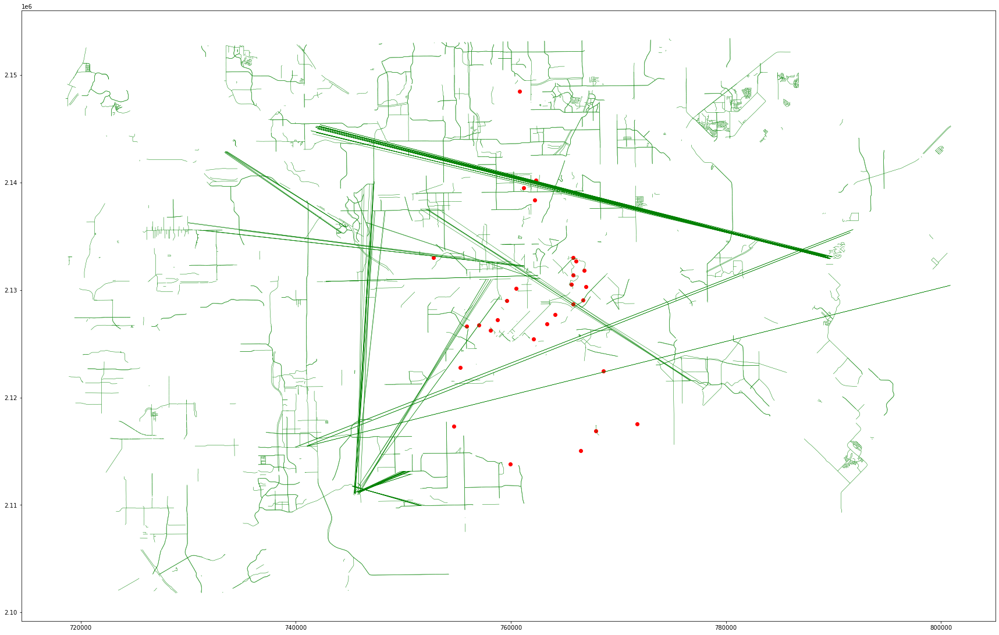

In [678]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="red")
road_proj2.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

In [679]:
# Now calculate the mean speed for each count location
output_pointspeed=pt_speed.groupby(by=['osm_id_sensor'])['maxspeed'].mean().reset_index()
output_pointspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,maxspeed
0,28545390.0,30.0
1,97891369.0,30.0
2,144869316.0,40.0
3,170833583.0,35.0
4,178552402.0,40.0


In [680]:
output_pointspeed.columns=["osm_id","Point Speed"]
output_pointspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Speed
0,28545390.0,30.0
1,97891369.0,30.0
2,144869316.0,40.0
3,170833583.0,35.0
4,178552402.0,40.0


In [681]:
pt_speed_v1.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'geometry_x',
       'min_dist_to_school', 'min_dist_to_college', 'min_dist_to_university',
       'lanes', 'maxspeed_x', 'index', 'osm_id', 'name', 'ref', 'type',
       'oneway', 'bridge', 'maxspeed_y', 'geometry_y'],
      dtype='object')

In [682]:
# Now calculate the mean speed for each count location
output_pointspeed_v2=pt_speed_v1.groupby(by=['osm_id_sensor'])['maxspeed_x'].mean().reset_index()
output_pointspeed_v2.columns=['osm_id','maxspeed']
output_pointspeed_v2

,osm_id,maxspeed


# Calculate the road type of the closest link of count station

In [683]:
# Keep only functional class of road that we considered in our study to create catagorical varaibale

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [684]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,57,5959308,Texan Trail,TX 26,primary,1,0,NaN,"LINESTRING (734601.175 2140339.510, 734601.195..."
1,334,9937281,North Griffin Street,None,primary,1,0,NaN,"LINESTRING (758929.397 2124893.034, 758928.000..."
2,523,9937606,Harry Hines Boulevard,None,primary,1,0,NaN,"LINESTRING (749647.644 2139485.380, 749663.401..."
3,534,9937629,East R L Thornton Freeway,None,primary,1,0,NaN,"LINESTRING (769618.398 2126708.429, 769667.385..."
4,640,9937823,Dallas-Fort Worth Turnpike,None,primary,1,0,NaN,"LINESTRING (741012.542 2122045.087, 741051.936..."


In [685]:
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'type']

#ecoshort['type'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort
#ecoshort_rt=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [686]:
# Now merged with road shape file
#road_merged_inner=pd.merge(ecoshort_speed, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#ecoshort_rt.head()

In [687]:
road_merged_inner = pd.merge(left=road_proj_type, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
road_merged_inner.head()

,index,osm_id,name,ref,type,oneway,bridge,maxspeed_x,geometry_x,site_id,...,latitude,longitude,comment,osm_id_sensor,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed_y
0,90760,419107440,West Northwest Highway,Loop 12,primary,1,0,NaN,"LINESTRING (753148.004 2133160.291, 753120.953...",P023DAL,...,32.85529,-96.86743,strava-osm divided 1676157 (as primary) & 1194253,419107440.0,POINT (752792.765 2132993.353),2047.986092,11749.756249,14874.402141,3,35.0
1,107293,492413557,East Lawther Drive,None,tertiary,0,0,NaN,"LINESTRING (767720.304 2131470.625, 767697.870...",P031DAL,...,32.84249,-96.71805,Sidewalk + bike lane,492413557.0,POINT (766796.078 2131801.387),2938.260248,18449.755665,19810.486171,2,20.0
2,82760,356309596,None,None,path,0,0,NaN,"LINESTRING (754571.892 2122470.501, 754588.555...",P002DAL,...,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
3,99554,444480443,Trinity Strand Trail,None,path,0,0,NaN,"LINESTRING (756963.689 2126459.131, 756956.659...",P020DAL,...,32.79823,-96.82301,NaN,444480443.0,POINT (757050.698 2126732.368),3954.639809,8655.926310,7572.166900,3,30.0
4,99558,444489305,Trinity Strand Trail,None,path,0,0,NaN,"LINESTRING (755943.260 2126602.934, 755935.830...",P022DAL,...,32.79750,-96.83536,NaN,444489305.0,POINT (755895.496 2126633.035),4714.556238,11277.126535,5573.834690,3,40.0


In [688]:
# First identify the closest link from count station
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'osm_id']

#ecoshort['osm_id'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [689]:
# Now merge with road shape file with OSM ID
#closest_road_type=pd.merge(ecoshort, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#closest_road_type
road_merged_inner.columns


Index(['index', 'osm_id', 'name', 'ref', 'type', 'oneway', 'bridge',
       'maxspeed_x', 'geometry_x', 'site_id', 'site_name', 'sensor_type',
       'year', 'region', 'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb',
       'stl_raw', 'latitude', 'longitude', 'comment', 'osm_id_sensor',
       'geometry_y', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_y'],
      dtype='object')

In [690]:
pt_road_type1=road_merged_inner.loc[:,['osm_id_sensor','type']]
pt_road_type1.columns=['osm_id','road_type']
pt_road_type1.head()

,osm_id,road_type
0,419107440.0,primary
1,492413557.0,tertiary
2,356309596.0,path
3,444480443.0,path
4,444489305.0,path


# Convert this road catagory to binary as follows-

In [691]:
import numpy as np
pt_road_type1['primary_binary'] = np.where(pt_road_type1['road_type'] == 'primary', 1, 0)
pt_road_type1['secondary_binary'] = np.where(pt_road_type1['road_type'] == 'secondary', 1, 0)
pt_road_type1['tertiary_binary'] = np.where(pt_road_type1['road_type'] == 'tertiary', 1, 0)
pt_road_type1['residential_binary'] = np.where(pt_road_type1['road_type'] == 'residential', 1, 0)
pt_road_type1['path_binary'] = np.where(pt_road_type1['road_type'] == 'path', 1, 0)
pt_road_type1['cycleway_binary'] = np.where(pt_road_type1['road_type'] == 'cycleway', 1, 0)
pt_road_type1['footway_binary'] = np.where(pt_road_type1['road_type'] == 'footway', 1, 0)
pt_road_type1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,road_type,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,419107440.0,primary,1,0,0,0,0,0,0
1,492413557.0,tertiary,0,0,1,0,0,0,0
2,356309596.0,path,0,0,0,0,1,0,0
3,444480443.0,path,0,0,0,0,1,0,0
4,444489305.0,path,0,0,0,0,1,0,0


In [692]:
pt_road_type2=pt_road_type1.drop(['road_type'],axis=1)
pt_road_type2.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,419107440.0,1,0,0,0,0,0,0
1,492413557.0,0,0,1,0,0,0,0
2,356309596.0,0,0,0,0,1,0,0
3,444480443.0,0,0,0,0,1,0,0
4,444489305.0,0,0,0,0,1,0,0


# Calculate the Bridges

In [693]:
bridge=inter_road.copy()
output_bridge=bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
# Convert binary, presence of bridge=1, absence of bridge=0
output_bridge.loc[output_bridge['bridge'] > 0, 'bridge'] = 1
output_bridge.loc[output_bridge['bridge'] ==0, 'bridge'] = 2
output_bridge.columns=['osm_id','bridge']
output_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,bridge
0,28545390.0,1
1,97891369.0,1
2,144869316.0,1
3,170833583.0,1
4,178552402.0,1


# Calculate the bridge from spatial join of count location and bridge line shape file

In [694]:
bridge_only=road_proj
bridge_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [695]:
#count_station
bridge_only.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['osm_id', 'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed',
       'geometry'],
      dtype='object')

In [696]:
# Join count location file with road file
pointInline_bridge =pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
pointInline_bridge.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,lanes,maxspeed_x,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,1,30.0,496723098,Trinity Forest Trail,None,cycleway,0,0,NaN,"LINESTRING (768587.951 2115996.687, 768608.508..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,2,30.0,356309596,None,None,path,0,0,NaN,"LINESTRING (754571.892 2122470.501, 754588.555..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,1,30.0,493380742,Cottonwood Trail,None,footway,0,0,NaN,"LINESTRING (762445.986 2138988.431, 762445.648..."
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,4,35.0,461234382,Crawford Memorial Park Loop Trail,None,footway,0,0,NaN,"LINESTRING (771717.859 2118245.487, 771724.754..."
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,3,35.0,472409339,None,None,footway,0,0,NaN,"LINESTRING (768518.879 2122403.054, 768558.690..."


In [697]:
# Join by OSM ID
#pointInline_bridge_v2 = pd.merge(left=bridge_only, right=count_station, left_on='osm_id', right_on='OSM_ID',how='inner')
#pointInline_bridge_v2


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [698]:
output_point_bridge=pointInline_bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
output_point_bridge.head()

,osm_id_sensor,bridge
0,28545390.0,0
1,97891369.0,0
2,144869316.0,0
3,170833583.0,0
4,178552402.0,0


In [699]:
output_point_bridge.loc[output_point_bridge['bridge'] > 0, 'bridge'] = 1
output_point_bridge.loc[output_point_bridge['bridge'] ==0, 'bridge'] = 2
output_point_bridge.columns=["osm_id","Point Bridge"]
output_point_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Bridge
0,28545390.0,2
1,97891369.0,2
2,144869316.0,2
3,170833583.0,2
4,178552402.0,2


# Calculate the Distance from count station to land use:Distance to water body, Distance to park,Distance to green space area,Distance to commercial,Distance to industrial area,Distance to residential area ,Distance to Retail area,Distance to Residential area



# Distance to park

In [700]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [701]:
nature_proj1.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [702]:
park_only=nature_proj1[nature_proj1['type'].str.contains('park')]
park_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."
5,14071359,Hurst Athletic Complex,park,"POLYGON ((722985.265 2132583.173, 723029.412 2..."
14,25605587,None,park,"POLYGON ((758509.903 2125863.758, 758510.503 2..."


In [703]:
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0


In [704]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(park_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,2865.444865
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,290.275785
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,0.000000
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,0.000000
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,0.000000


In [705]:
Park_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
Park_distance1.columns=["osm_id","Distance to Park"]
Park_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park
0,496723098.0,2865.444865
1,356309596.0,290.275785
2,493380742.0,0.000000
3,461234382.0,0.000000
4,472409339.0,0.000000


# cc distance to park

In [706]:
parkcc=park_only.copy()
parkcc['geometry']=parkcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(parkcc,))*3.28084
parkcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
parkcc_distance1.columns=["osm_id","Distance to Park Center"]
parkcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park Center
0,496723098.0,3713.110779
1,356309596.0,397.308399
2,493380742.0,501.161426
3,461234382.0,579.268452
4,472409339.0,935.413490


# Distance to water body

In [707]:
water_only=nature_proj1[nature_proj1['type'].str.contains('water')]
water_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
9,25494092,None,water,"POLYGON ((733993.444 2137940.887, 733990.588 2..."
10,25494093,None,water,"POLYGON ((734023.423 2137987.164, 734022.663 2..."
20,25662645,Bachman Lake,water,"POLYGON ((753700.304 2133466.871, 753760.431 2..."


In [708]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(water_only,))*3.28084
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,132.128805
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,2649.234231
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,2881.901507
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,8566.030521
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,2388.632421


In [709]:
water_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
water_distance1.columns=["osm_id","Distance to Water Body"]
water_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Body
0,496723098.0,132.128805
1,356309596.0,2649.234231
2,493380742.0,2881.901507
3,461234382.0,8566.030521
4,472409339.0,2388.632421


In [710]:
watercc=water_only.copy()
watercc['geometry']=watercc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(watercc,))*3.28084
watercc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
watercc_distance1.columns=["osm_id","Distance to Water Center"]
watercc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Center
0,496723098.0,389.728219
1,356309596.0,2683.078976
2,493380742.0,3029.625659
3,461234382.0,8930.111785
4,472409339.0,2497.597080


# Distance To  Forest

In [711]:
forest_only=nature_proj1[nature_proj1['type'].str.contains('forest')]
forest_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
6,25493636,None,forest,"POLYGON ((734809.814 2134910.410, 734811.176 2..."
7,25493638,None,forest,"POLYGON ((734915.952 2134907.275, 735001.187 2..."
8,25493693,None,forest,"POLYGON ((735150.525 2134692.159, 735161.491 2..."
11,25552761,None,forest,"POLYGON ((735603.438 2132951.693, 735590.487 2..."
12,25552762,None,forest,"POLYGON ((735896.820 2131620.310, 736455.180 2..."


In [712]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forest_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,233.848140
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,5407.992048
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,30.788199
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,59.491484
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,594.853292


In [713]:
forest_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forest_distance1.columns=["osm_id","Distance to forest"]
forest_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to forest
0,496723098.0,233.848140
1,356309596.0,5407.992048
2,493380742.0,30.788199
3,461234382.0,59.491484
4,472409339.0,594.853292


In [714]:
forestcc=forest_only.copy()
forestcc['geometry']=forestcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forestcc,))*3.28084
forestcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forestcc_distance1.columns=["osm_id","Distance to Forest Center"]
forestcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Forest Center
0,496723098.0,2743.173277
1,356309596.0,6170.142400
2,493380742.0,357.539293
3,461234382.0,1052.731985
4,472409339.0,1264.261886


# Distance to green space area

In [715]:
grass_only=luse_proj[luse_proj['type'].str.contains('grass')]
grass_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
10,29186461,None,grass,"POLYGON ((746860.052 2116303.318, 746937.829 2..."
11,29191160,None,grass,"POLYGON ((758191.133 2124526.816, 758255.977 2..."
12,29191170,None,grass,"POLYGON ((758132.196 2124667.745, 758132.213 2..."
13,29191222,None,grass,"POLYGON ((758123.383 2124388.863, 758152.120 2..."
21,32490476,None,grass,"POLYGON ((753455.154 2120767.565, 753458.330 2..."


In [716]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grass_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,58.042113
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,898.654405
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,371.038587
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,3646.932425
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,1602.358212


In [717]:
grass_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grass_distance1.columns=["osm_id","Distance to Grass"]
grass_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass
0,496723098.0,58.042113
1,356309596.0,898.654405
2,493380742.0,371.038587
3,461234382.0,3646.932425
4,472409339.0,1602.358212


In [718]:
grasscc=grass_only.copy()
grasscc['geometry']=grasscc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grasscc,))*3.28084
grasscc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grasscc_distance1.columns=["osm_id","Distance to Grass Center"]
grasscc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass Center
0,496723098.0,202.811011
1,356309596.0,921.484254
2,493380742.0,482.392579
3,461234382.0,4203.724074
4,472409339.0,1742.614556


# Distance to commercial

In [719]:
commercial_only=luse_proj[luse_proj['type'].str.contains('commercial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercial_only,))*3.28084
commercial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercial_distance1.columns=["osm_id","Distance to Commercial Area"]
commercial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area
0,496723098.0,8295.206494
1,356309596.0,2648.126813
2,493380742.0,777.677838
3,461234382.0,3598.210466
4,472409339.0,5450.289833


In [720]:
commercialcc=commercial_only.copy()
commercialcc['geometry']=commercialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercialcc,))*3.28084
commercialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercialcc_distance1.columns=["osm_id","Distance to Commercial Area Center"]
commercialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area Center
0,496723098.0,8769.777085
1,356309596.0,3446.389523
2,493380742.0,1197.191805
3,461234382.0,4168.030547
4,472409339.0,5540.351898


# Distance to industrial area

In [721]:
industrial_only=luse_proj[luse_proj['type'].str.contains('industrial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrial_only,))*3.28084
industrial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrial_distance1.columns=["osm_id","Distance to Industrial Area"]
industrial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Area
0,496723098.0,1177.825126
1,356309596.0,5022.382691
2,493380742.0,2625.882273
3,461234382.0,2451.344867
4,472409339.0,6358.174558


In [722]:
industrialcc=industrial_only.copy()
industrialcc['geometry']=industrialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrialcc,))*3.28084
industrialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrialcc_distance1.columns=["osm_id","Distance to Industrial Center"]
industrialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Center
0,496723098.0,1431.220601
1,356309596.0,5282.052023
2,493380742.0,5074.001595
3,461234382.0,2699.318182
4,472409339.0,6532.521450


# Distance to Retail area

In [723]:
retail_only=luse_proj[luse_proj['type'].str.contains('retail')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retail_only,))*3.28084
retail_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retail_distance1.columns=["osm_id","Distance to Retail Area"]
retail_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Area
0,496723098.0,9840.040603
1,356309596.0,6689.962864
2,493380742.0,707.203212
3,461234382.0,6649.161902
4,472409339.0,4775.472819


In [724]:
retailcc=retail_only.copy()
retailcc['geometry']=retailcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retailcc,))*3.28084
retailcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retailcc_distance1.columns=["osm_id","Distance to Retail Center"]
retailcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Center
0,496723098.0,10028.639706
1,356309596.0,7133.916094
2,493380742.0,1062.613841
3,461234382.0,7000.161032
4,472409339.0,5090.465363


# Distance to Residential

In [725]:
residential_only=luse_proj[luse_proj['type'].str.contains('residential')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residential_only,))*3.28084
residential_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residential_distance1.columns=["osm_id","Distance to Residential Area"]
residential_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Area
0,496723098.0,369.547646
1,356309596.0,168.767603
2,493380742.0,836.134846
3,461234382.0,702.751801
4,472409339.0,136.205652


In [726]:
residentialcc=residential_only.copy()
residentialcc['geometry']=residentialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residentialcc,))*3.28084
residentialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residentialcc_distance1.columns=["osm_id","Distance to Residential Center"]
residentialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Center
0,496723098.0,1416.286315
1,356309596.0,966.507266
2,493380742.0,1842.555130
3,461234382.0,803.735072
4,472409339.0,218.202498


# Import the OSM Building file and use Dallas City Hall as the CBD, then calculate the distance from CBD

In [727]:
building1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,9940535,None,None,"POLYGON ((-96.55965 32.85357, -96.55965 32.853..."
1,9950509,None,industrial,"POLYGON ((-96.98419 33.02686, -96.98437 33.026..."
2,13990575,North Richland Hills Library,library,"POLYGON ((-97.19288 32.85488, -97.19278 32.854..."
3,25312698,American Airlines Center,commercial,"POLYGON ((-96.81024 32.79138, -96.80997 32.791..."
4,25470104,None,garage,"POLYGON ((-97.03883 32.89944, -97.03839 32.899..."


In [728]:
# Reproject the geometries by replacing the values with projected ones
bld_proj = building1.to_crs(epsg=2845)
bld_proj.head(10)
bld_proj1=bld_proj.loc[(bld_proj.name=='Dallas City Hall')]
bld_proj1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
217,27129838,Dallas City Hall,civic,"POLYGON ((759612.242 2124327.140, 759596.565 2..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

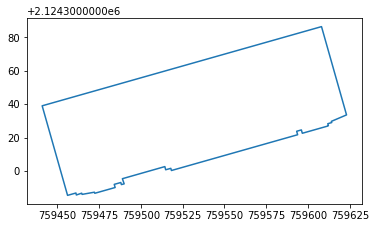

In [729]:
bld_proj1.geometry.boundary.plot()

In [730]:
# copy GeoDataFrame
bld_proj2 = bld_proj1.copy()
# change geometry 
bld_proj2['geometry'] = bld_proj2['geometry'].centroid
bld_proj2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
217,27129838,Dallas City Hall,civic,POINT (759532.530 2124335.210)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

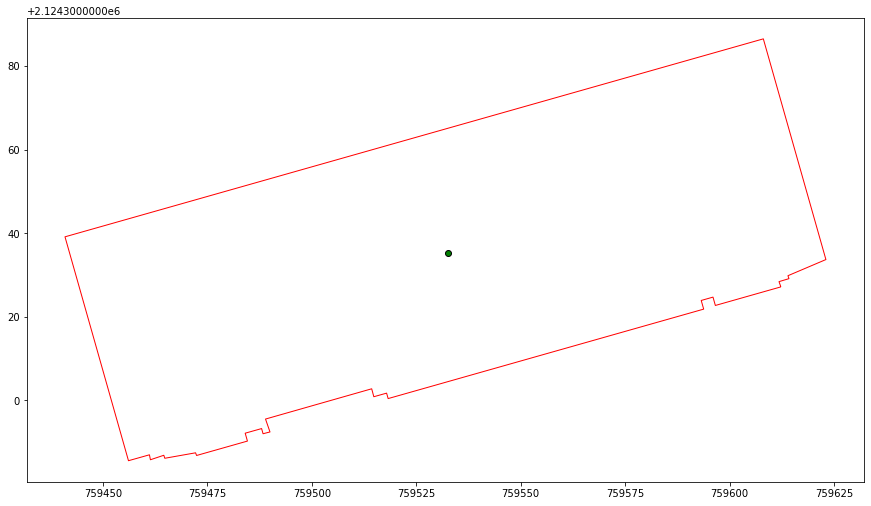

In [731]:
fig, ax = plt.subplots(figsize = (15,10)) 
bld_proj2.plot(ax=ax,color="green",edgecolor='k')
bld_proj1.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

In [732]:
# Calculate the distance from CBD to all count locations
ecoshort['min_dist_to_CBD'] = ecoshort.geometry.apply(min_distance_ppoly, args=(bld_proj2,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,1416.286315,36782.751742
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,966.507266,14815.512107
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,1842.555130,52828.936547
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,803.735072,45877.867288
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,218.202498,30425.587446


In [733]:
CBD_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_CBD']]
CBD_distance1.columns=["osm_id","Distance to CBD"]
CBD_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to CBD
0,496723098.0,36782.751742
1,356309596.0,14815.512107
2,493380742.0,52828.936547
3,461234382.0,45877.867288
4,472409339.0,30425.587446


# End of Distance calculation

# Now write coding for socio-demographic variable extraction

1. Population density
2. Employment density
3. Household Density
4. Number of students (student access)
5. Median age
6. Percentage of female
7. Percentage of male
8. Percentage of African American population
9. Percentage of white population
10. Median Household Income
11. Education (% of population having at least college education)

In [608]:
# Read the Block group 
#bg=gpd.read_file("../input/oregon-sd-data/OR_blck_grp_2017.shp")
bg.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry,wktcolumn
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((50399.526 -607563.809, 50320.786 -60...",POLYGON ((50399.526299998164 -607563.808500000...
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((53916.253 -605431.909, 53967.236 -60...","POLYGON ((53916.25329999998 -605431.909, 53967..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((44426.240 -607223.004, 44421.949 -60...",POLYGON ((44426.23999999836 -607223.0040999996...
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((17420.769 -641639.860, 17426.775 -64...",POLYGON ((17420.769400000572 -641639.859699999...
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((9903.482 -632316.102, 9938.024 -6323...",POLYGON ((9903.482400000095 -632316.1017000005...


In [609]:
bg.shape

(15799, 17)

In [610]:
print(bg.crs)

PROJCS["USA_Contiguous_Albers_Equal_Area_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",37.5],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","102003"]]


In [611]:
from geopandas import GeoDataFrame
from shapely.geometry import Point
import shapely.wkt
bg["wktcolumn"]= bg.apply(lambda row:row['geometry'].wkt, axis=1)
bg
geometry = bg['wktcolumn'].map(shapely.wkt.loads)
bg1 = bg.drop('wktcolumn', axis=1)
bg2 = gpd.GeoDataFrame(bg1, crs='esri:102003', geometry=geometry)
bg2.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((50399.526 -607563.809, 50320.786 -60..."
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((53916.253 -605431.909, 53967.236 -60..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((44426.240 -607223.004, 44421.949 -60..."
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((17420.769 -641639.860, 17426.775 -64..."
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((9903.482 -632316.102, 9938.024 -6323..."


In [612]:
# set the co-ordinate system first
#bg2 = bg.set_crs("EPSG:102003")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_proj = bg2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_proj = bg_proj.to_crs('epsg:2845')
bg_proj.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2..."
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2..."
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2..."
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2..."


In [613]:
bg_proj["Total block Area"]=bg_proj.area
bg_proj.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry,Total block Area
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2...",1.521411e+07
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2...",2.341138e+08
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2...",2.418926e+08
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2...",1.685126e+07
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2...",7.511659e+07


In [614]:
#race=pd.read_csv("../input/oregon-sd-data/race.csv")
race.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALUCM001,ALUCM002,ALUCM003,ALUCM004,ALUCM005,ALUCM006,ALUCM007,ALUCM008,ALUCM009,ALUCM010
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,296,291,75,13,27,14,14,51,14,51
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,419,421,16,14,14,14,96,42,14,42
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,365,338,105,20,14,14,14,29,14,29
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,235,212,176,21,14,14,20,33,14,33
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,398,348,313,21,14,16,19,19,19,19


In [615]:
race1=pd.merge(bg_proj, race, left_on='GISJOIN', right_on='GISJOIN', how='left')
race1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALUCM001,ALUCM002,ALUCM003,ALUCM004,ALUCM005,ALUCM006,ALUCM007,ALUCM008,ALUCM009,ALUCM010
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,296,291,75,13,27,14,14,51,14,51
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,419,421,16,14,14,14,96,42,14,42
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,365,338,105,20,14,14,14,29,14,29
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,235,212,176,21,14,14,20,33,14,33
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,398,348,313,21,14,16,19,19,19,19



       Table 1:     Race
    Universe:    Total population
    Source code: B02001
    NHGIS code:  ALUC
        ALUCE001:    Total
        ALUCE002:    White alone
        ALUCE003:    Black or African American alone
        ALUCE004:    American Indian and Alaska Native alone
        ALUCE005:    Asian alone
        ALUCE006:    Native Hawaiian and Other Pacific Islander alone
        ALUCE007:    Some other race alone
        ALUCE008:    Two or more races
        ALUCE009:    Two or more races: Two races including Some other race
        ALUCE010:    Two or more races: Two races excluding Some other race, and three or more races

In [616]:
race2=race1[['INTPTLAT','INTPTLON','GISJOIN','Shape_Leng','Shape_Area','geometry','ALUCE001','ALUCE002','ALUCE003','Total block Area']]
race2.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,ALUCE001,ALUCE002,ALUCE003,Total block Area
0,+32.0605626,-095.4960702,G48000109501001,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2...",1296,1074,119,1.521411e+07
1,+31.9532088,-095.4932299,G48000109501002,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2...",2051,1951,15,2.341138e+08
2,+31.9800959,-095.6230974,G48000109501003,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2...",1497,1316,150,2.418926e+08
3,+31.7346372,-095.8157096,G48000109504011,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2...",4838,2872,1890,1.685126e+07
4,+31.8000515,-095.9131097,G48000109504021,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2...",7511,4400,3063,7.511659e+07


In [617]:
#race2["Total block Area"]=race2.area
#race2

In [618]:
# Clip the data using GeoPandas clip
buffer_clip_race = gpd.clip(race2, gdf1)
buffer_clip_race.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,ALUCE001,ALUCE002,ALUCE003,Total block Area
3559,+32.7389646,-096.6865120,G48011300091053,3270.249663,620707.735264,"POLYGON ((770286.848 2120658.999, 770291.178 2...",1041,865,93,620568.571169
3562,+32.7382196,-096.6783713,G48011300092013,3464.905301,687400.250714,"POLYGON ((771094.780 2120222.627, 771096.853 2...",938,776,81,687246.250903
3729,+32.7382239,-096.6524572,G48011300119004,3413.991289,724344.070458,"POLYGON ((773537.601 2120156.480, 773538.510 2...",1195,882,313,724181.870116
3726,+32.7383478,-096.6440435,G48011300119001,3400.546768,724983.632378,"POLYGON ((773798.281 2119911.987, 773539.611 2...",2240,1796,443,724821.184149
3563,+32.7410865,-096.6691918,G48011300092014,3957.178502,626206.316749,"POLYGON ((772140.135 2120718.516, 772146.396 2...",2179,1717,357,626065.738460


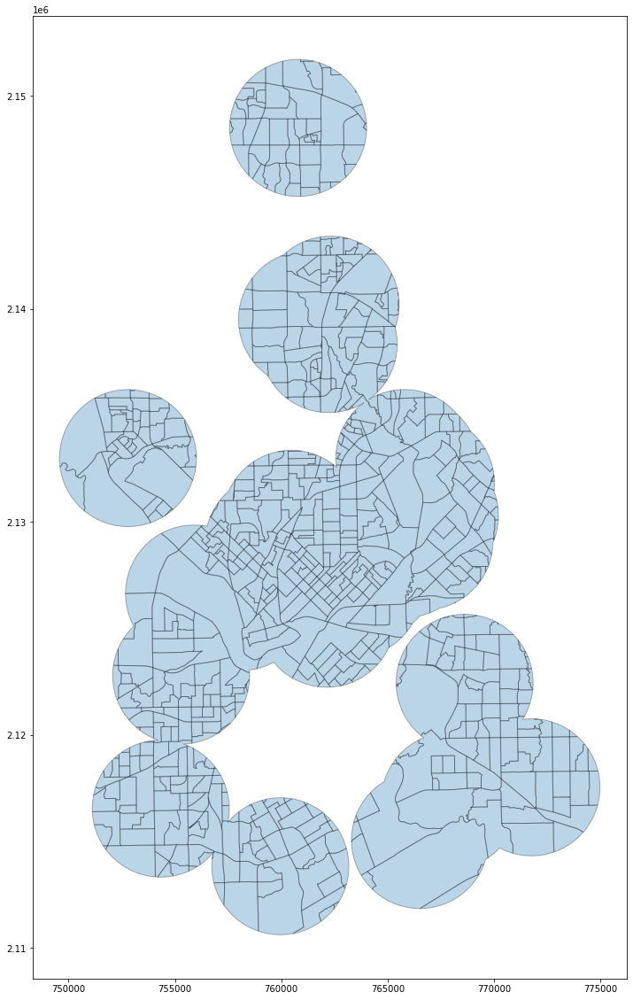

In [619]:
ax = buffer_clip_race.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [620]:
 inter_race=gpd.overlay(gdf1, buffer_clip_race, how='intersection', make_valid=True, keep_geom_type=False)
 inter_race.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,ALUCE001,ALUCE002,ALUCE003,Total block Area,geometry
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,+32.8780771,-096.8604127,G48011300098021,2859.430097,4.641000e+05,1420,1293,31,4.639863e+05,"POLYGON ((753795.760 2135585.385, 753796.460 2..."
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,+32.8786987,-096.8702659,G48011300098031,3422.213640,4.998870e+05,1166,991,46,4.997645e+05,"POLYGON ((752911.730 2135794.063, 752915.284 2..."
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,+32.8844801,-096.9082259,G48011300099002,23619.662933,2.212208e+07,1813,1150,267,2.211666e+07,"POLYGON ((749574.075 2132993.353, 749589.574 2..."
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,+32.8838316,-096.8602339,G48011300097021,3317.949070,5.727155e+05,1009,943,0,5.725749e+05,"POLYGON ((753727.101 2136073.447, 753791.962 2..."
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,+32.8840697,-096.8725139,G48011300097013,3712.135957,8.242289e+05,1309,1091,1,8.240265e+05,"POLYGON ((752164.829 2136150.196, 752477.278 2..."


In [621]:
inter_race["buffered area"]=inter_race.area
inter_race['area factor']=inter_race['buffered area']/inter_race["Total block Area"]
inter_race.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GISJOIN,Shape_Leng,Shape_Area,ALUCE001,ALUCE002,ALUCE003,Total block Area,geometry,buffered area,area factor
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,G48011300098021,2859.430097,4.641000e+05,1420,1293,31,4.639863e+05,"POLYGON ((753795.760 2135585.385, 753796.460 2...",4.639863e+05,1.000000
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,G48011300098031,3422.213640,4.998870e+05,1166,991,46,4.997645e+05,"POLYGON ((752911.730 2135794.063, 752915.284 2...",4.997645e+05,1.000000
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,G48011300099002,23619.662933,2.212208e+07,1813,1150,267,2.211666e+07,"POLYGON ((749574.075 2132993.353, 749589.574 2...",4.951983e+06,0.223903
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,G48011300097021,3317.949070,5.727155e+05,1009,943,0,5.725749e+05,"POLYGON ((753727.101 2136073.447, 753791.962 2...",2.884924e+05,0.503851
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,G48011300097013,3712.135957,8.242289e+05,1309,1091,1,8.240265e+05,"POLYGON ((752164.829 2136150.196, 752477.278 2...",3.909926e+05,0.474490


In [748]:
output_pct_race= inter_race.loc[:, ['osm_id_sensor', 'ALUCE001','ALUCE002','ALUCE003','area factor']]
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003,area factor
0,496723098.0,1411,902,454,0.012380
1,496723098.0,1662,494,1145,0.078385
2,496723098.0,927,213,714,0.879479
3,496723098.0,2890,987,1851,0.707884
4,496723098.0,2530,573,1856,0.085536


In [749]:
output_pct_race.iloc[:, 1:4] = output_pct_race.iloc[:, 1:4].mul(output_pct_race['area factor'],axis=0)
output_pct_race=output_pct_race.drop(['area factor'],axis=1)
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003
0,496723098.0,17.468144,11.166737,5.620508
1,496723098.0,130.275466,38.722070,89.750547
2,496723098.0,815.277187,187.329062,627.948125
3,496723098.0,2045.785212,698.681662,1310.293573
4,496723098.0,216.405950,49.012099,158.754721


# Aggregate by ID

In [750]:
output_pct_race=output_pct_race.groupby('osm_id_sensor', as_index=False).sum()
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003
0,28545390.0,11507.278550,10042.444870,324.632098
1,97891369.0,6640.745425,5226.856301,1031.927068
2,144869316.0,4982.844708,4028.562849,489.339517
3,170833583.0,15859.790908,12458.793973,1893.160316
4,178552402.0,4505.105631,3750.387289,434.813538


# Percentange of White and African American

In [751]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_race['pct_white']=(output_pct_race['ALUCE002']/output_pct_race['ALUCE001'])*100
output_pct_race['pct_African_American']=(output_pct_race['ALUCE003']/output_pct_race['ALUCE001'])*100
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003,pct_white,pct_African_American
0,28545390.0,11507.278550,10042.444870,324.632098,87.270373,2.821102
1,97891369.0,6640.745425,5226.856301,1031.927068,78.708879,15.539326
2,144869316.0,4982.844708,4028.562849,489.339517,80.848653,9.820485
3,170833583.0,15859.790908,12458.793973,1893.160316,78.555853,11.936855
4,178552402.0,4505.105631,3750.387289,434.813538,83.247488,9.651573


In [752]:
output_pct_race1=output_pct_race.drop(['ALUCE001','ALUCE002','ALUCE003'],axis=1)
output_pct_race1.columns=['osm_id','pct_white','pct_African_American']
output_pct_race1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_white,pct_African_American
0,28545390.0,87.270373,2.821102
1,97891369.0,78.708879,15.539326
2,144869316.0,80.848653,9.820485
3,170833583.0,78.555853,11.936855
4,178552402.0,83.247488,9.651573


# Percentage of Male and Female

In [753]:
#gender=pd.read_csv("../input/oregon-sd-data/age by sex.csv")
gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,22,7,13,20,14,23,31,29,20,42
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,44,32,33,29,17,54,40,27,9,11
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,24,59,24,15,23,28,71,25,5,14
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,9,14,14,14,14,14,9,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,17,19,19,19,19,19,19,19,19


In [754]:
gender1=pd.merge(bg_proj, gender, left_on='GISJOIN', right_on='GISJOIN', how='left')
gender1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,22,7,13,20,14,23,31,29,20,42
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,44,32,33,29,17,54,40,27,9,11
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,24,59,24,15,23,28,71,25,5,14
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,9,14,14,14,14,14,9,14,14,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,19,17,19,19,19,19,19,19,19,19


In [755]:
# Clip the data using GeoPandas clip
buffer_clip_gender = gpd.clip(gender1, gdf1)
buffer_clip_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
2831,G48008500317091,48,085,031709,1,480850317091,Block Group 1,G5030,S,1729925.0,...,44,14,17,30,14,26,24,18,14,24
2832,G48008500317092,48,085,031709,2,480850317092,Block Group 2,G5030,S,1154762.0,...,35,57,28,24,14,17,35,49,14,14
2833,G48008500317093,48,085,031709,3,480850317093,Block Group 3,G5030,S,923482.0,...,27,52,73,19,30,18,30,18,14,81
2854,G48008500317181,48,085,031718,1,480850317181,Block Group 1,G5030,S,462916.0,...,30,26,7,33,14,24,34,12,14,22
2855,G48008500317182,48,085,031718,2,480850317182,Block Group 2,G5030,S,1073031.0,...,26,27,27,32,46,9,15,19,14,19


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


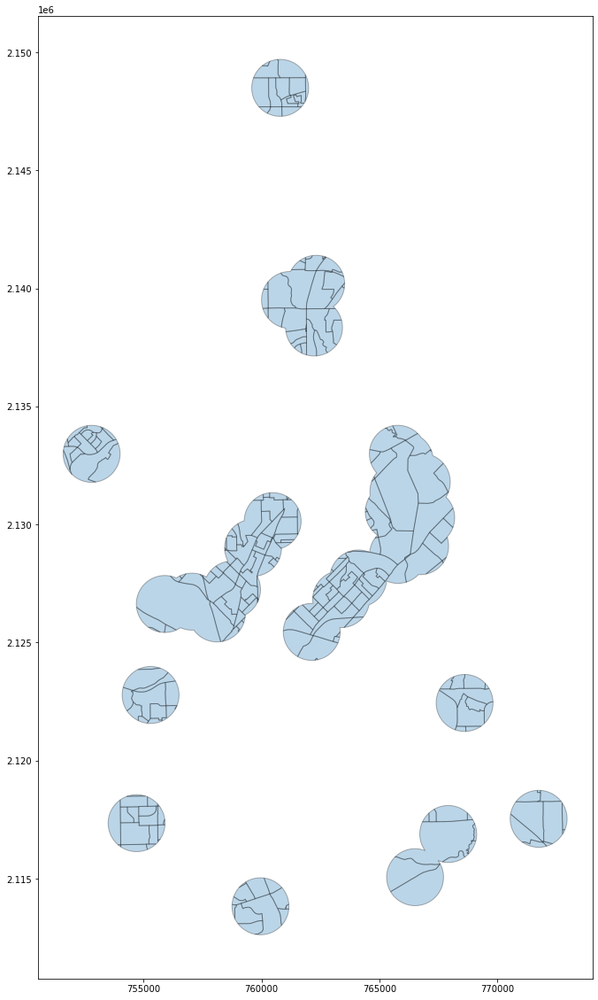

In [756]:
ax = buffer_clip_gender.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [757]:
 inter_gender=gpd.overlay(gdf1, buffer_clip_gender, how='intersection', make_valid=True, keep_geom_type=False)
 inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,62,14,14,24,14,14,14,96,39,"POLYGON ((766850.909 2117459.550, 766911.805 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,28,26,57,41,29,42,14,21,14,"POLYGON ((768768.879 2117744.053, 768848.425 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,30,27,14,14,14,14,19,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,31,17,45,25,30,14,14,42,30,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,46,45,42,29,14,15,28,17,20,"POLYGON ((769116.591 2116772.262, 769099.211 2..."


In [758]:
inter_gender["buffered area"]=inter_gender.area
inter_gender['area factor']=inter_gender['buffered area']/inter_gender["Total block Area"]
inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,24,14,14,14,96,39,"POLYGON ((766850.909 2117459.550, 766911.805 2...",58560.025422,0.012380
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,57,41,29,42,14,21,14,"POLYGON ((768768.879 2117744.053, 768848.425 2...",38031.798788,0.078385
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,19,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2...",140360.211207,0.879479
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,45,25,30,14,14,42,30,"POLYGON ((767453.493 2118005.700, 767565.019 2...",782400.072844,0.707884
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,42,29,14,15,28,17,20,"POLYGON ((769116.591 2116772.262, 769099.211 2...",74935.978849,0.085536



    Table 1:     Sex by Age
    Universe:    Total population
    Source code: B01001
    NHGIS code:  ALT0
        ALT0E001:    Total
        ALT0E002:    Male
        ALT0E003:    Male: Under 5 years
        ALT0E004:    Male: 5 to 9 years
        ALT0E005:    Male: 10 to 14 years
        ALT0E006:    Male: 15 to 17 years
        ALT0E007:    Male: 18 and 19 years
        ALT0E008:    Male: 20 years
        ALT0E009:    Male: 21 years
        ALT0E010:    Male: 22 to 24 years
        ALT0E011:    Male: 25 to 29 years
        ALT0E012:    Male: 30 to 34 years
        ALT0E013:    Male: 35 to 39 years
        ALT0E014:    Male: 40 to 44 years
        ALT0E015:    Male: 45 to 49 years
        ALT0E016:    Male: 50 to 54 years
        ALT0E017:    Male: 55 to 59 years
        ALT0E018:    Male: 60 and 61 years
        ALT0E019:    Male: 62 to 64 years
        ALT0E020:    Male: 65 and 66 years
        ALT0E021:    Male: 67 to 69 years
        ALT0E022:    Male: 70 to 74 years
        ALT0E023:    Male: 75 to 79 years
        ALT0E024:    Male: 80 to 84 years
        ALT0E025:    Male: 85 years and over
        ALT0E026:    Female
        ALT0E027:    Female: Under 5 years
        ALT0E028:    Female: 5 to 9 years
        ALT0E029:    Female: 10 to 14 years
        ALT0E030:    Female: 15 to 17 years
        ALT0E031:    Female: 18 and 19 years
        ALT0E032:    Female: 20 years
        ALT0E033:    Female: 21 years
        ALT0E034:    Female: 22 to 24 years
        ALT0E035:    Female: 25 to 29 years
        ALT0E036:    Female: 30 to 34 years
        ALT0E037:    Female: 35 to 39 years
        ALT0E038:    Female: 40 to 44 years
        ALT0E039:    Female: 45 to 49 years
        ALT0E040:    Female: 50 to 54 years
        ALT0E041:    Female: 55 to 59 years
        ALT0E042:    Female: 60 and 61 years

In [759]:
#'AHYQE001',=total, 'AHYQE002'=male,AHYQE026=female
gender_filter=inter_gender.loc[:, ['osm_id_sensor', 'ALT0E001', 'ALT0E002', 'ALT0E026','area factor']]
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026,area factor
0,496723098.0,1411,674,737,0.012380
1,496723098.0,1662,601,1061,0.078385
2,496723098.0,927,396,531,0.879479
3,496723098.0,2890,1382,1508,0.707884
4,496723098.0,2530,992,1538,0.085536


In [760]:
gender_filter.iloc[:, 1:4] = gender_filter.iloc[:, 1:4].mul(gender_filter['area factor'],axis=0)
gender_filter=gender_filter.drop(['area factor'],axis=1)
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026
0,496723098.0,17.468144,8.344103,9.124041
1,496723098.0,130.275466,47.109239,83.166227
2,496723098.0,815.277187,348.273750,467.003437
3,496723098.0,2045.785212,978.295904,1067.489308
4,496723098.0,216.405950,84.851661,131.554289


In [761]:
# Aggregate by ID
output_pct_gender=gender_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026
0,28545390.0,11507.278550,5619.536498,5887.742052
1,97891369.0,6640.745425,3579.029730,3061.715694
2,144869316.0,4982.844708,2483.592099,2499.252609
3,170833583.0,15859.790908,8745.733526,7114.057382
4,178552402.0,4505.105631,2171.449397,2333.656234


In [762]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_gender['pct_male']=(output_pct_gender['ALT0E002']/output_pct_gender['ALT0E001'])*100
output_pct_gender['pct_female']=(output_pct_gender['ALT0E026']/output_pct_gender['ALT0E001'])*100
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026,pct_male,pct_female
0,28545390.0,11507.278550,5619.536498,5887.742052,48.834626,51.165374
1,97891369.0,6640.745425,3579.029730,3061.715694,53.895000,46.105000
2,144869316.0,4982.844708,2483.592099,2499.252609,49.842856,50.157144
3,170833583.0,15859.790908,8745.733526,7114.057382,55.144066,44.855934
4,178552402.0,4505.105631,2171.449397,2333.656234,48.199744,51.800256


In [763]:
output_pct_gender1=output_pct_gender.drop(['ALT0E001', 'ALT0E002', 'ALT0E026'],axis=1)
output_pct_gender1.columns=['osm_id','pct_male','pct_female']
output_pct_gender1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_male,pct_female
0,28545390.0,48.834626,51.165374
1,97891369.0,53.895000,46.105000
2,144869316.0,49.842856,50.157144
3,170833583.0,55.144066,44.855934
4,178552402.0,48.199744,51.800256


# Number of Student (student access) and Education (pct of at least college education population)

In [764]:
#edu=pd.read_csv("../input/oregon-sd-data/education.csv")
edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,5,98,36,32,100,34,28,30,14,14
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,8,162,51,54,116,57,78,64,5,4
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,89,27,46,159,52,74,42,21,7
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,41,124,124,95,140,76,62,14,18,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,40,177,219,113,206,106,62,42,27,15


In [765]:
edu1=pd.merge(bg_proj, edu, left_on='GISJOIN', right_on='GISJOIN', how='left')
edu1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,5,98,36,32,100,34,28,30,14,14
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,8,162,51,54,116,57,78,64,5,4
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,14,89,27,46,159,52,74,42,21,7
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,41,124,124,95,140,76,62,14,18,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,40,177,219,113,206,106,62,42,27,15


In [766]:
# Clip the data using GeoPandas clip
buffer_clip_edu = gpd.clip(edu1, gdf1)
buffer_clip_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
2831,G48008500317091,48,085,031709,1,480850317091,Block Group 1,G5030,S,1729925.0,...,40,83,14,47,76,91,301,163,14,33
2832,G48008500317092,48,085,031709,2,480850317092,Block Group 2,G5030,S,1154762.0,...,14,47,14,22,53,34,100,94,46,23
2833,G48008500317093,48,085,031709,3,480850317093,Block Group 3,G5030,S,923482.0,...,14,95,14,36,57,18,148,105,24,36
2854,G48008500317181,48,085,031718,1,480850317181,Block Group 1,G5030,S,462916.0,...,14,54,16,15,45,24,64,49,28,7
2855,G48008500317182,48,085,031718,2,480850317182,Block Group 2,G5030,S,1073031.0,...,14,41,12,30,56,26,76,78,42,21


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


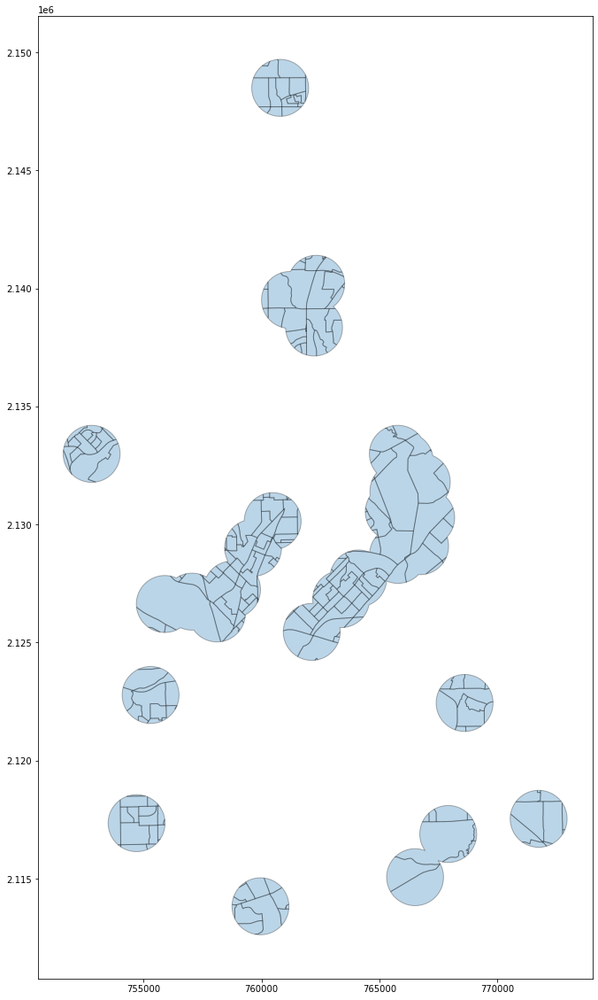

In [767]:
ax = buffer_clip_edu.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [768]:
inter_edu=gpd.overlay(gdf1, buffer_clip_edu, how='intersection', make_valid=True, keep_geom_type=False)
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,125,94,14,86,15,67,14,14,14,"POLYGON ((766850.909 2117459.550, 766911.805 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,140,14,39,49,14,16,14,14,14,"POLYGON ((768768.879 2117744.053, 768848.425 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,76,43,47,127,17,56,14,14,30,"POLYGON ((767149.678 2117823.600, 767244.818 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,179,89,60,126,40,47,22,14,14,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,251,11,22,87,14,85,39,14,14,"POLYGON ((769116.591 2116772.262, 769099.211 2..."


In [769]:
inter_edu["buffered area"]=inter_edu.area
inter_edu['area factor']=inter_edu['buffered area']/inter_edu["Total block Area"]
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,86,15,67,14,14,14,"POLYGON ((766850.909 2117459.550, 766911.805 2...",58560.025422,0.012380
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,39,49,14,16,14,14,14,"POLYGON ((768768.879 2117744.053, 768848.425 2...",38031.798788,0.078385
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,47,127,17,56,14,14,30,"POLYGON ((767149.678 2117823.600, 767244.818 2...",140360.211207,0.879479
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,60,126,40,47,22,14,14,"POLYGON ((767453.493 2118005.700, 767565.019 2...",782400.072844,0.707884
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,22,87,14,85,39,14,14,"POLYGON ((769116.591 2116772.262, 769099.211 2...",74935.978849,0.085536


In [770]:
edu_filter=inter_edu.loc[:, ['osm_id_sensor', 'ALWGE001', 'ALWGE019','ALWGE020','ALWGE021', 'ALWGE022','ALWGE023','ALWGE024','ALWGE025','area factor']]
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,area factor
0,496723098.0,936,0,155,8,71,0,0,0,0.012380
1,496723098.0,754,37,56,0,10,0,0,0,0.078385
2,496723098.0,484,37,111,11,34,0,0,19,0.879479
3,496723098.0,1348,52,258,33,48,14,0,0,0.707884
4,496723098.0,1591,11,153,0,132,31,0,0,0.085536


In [771]:
edu_filter.iloc[:, 1:9] = edu_filter.iloc[:, 1:9].mul(edu_filter['area factor'],axis=0)
edu_filter=edu_filter.drop(['area factor'],axis=1)
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025
0,496723098.0,11.587656,0.000000,1.918896,0.099040,0.878978,0.000000,0.0,0.000000
1,496723098.0,59.102107,2.900236,4.389546,0.000000,0.783848,0.000000,0.0,0.000000
2,496723098.0,425.667916,32.540729,97.622187,9.674271,29.902292,0.000000,0.0,16.710104
3,496723098.0,954.227843,36.809976,182.634112,23.360177,33.978439,9.910378,0.0,0.000000
4,496723098.0,136.087694,0.940895,13.087000,0.000000,11.290745,2.651614,0.0,0.000000


In [772]:
# Aggregate by ID
output_pct_edu=edu_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025
0,28545390.0,8040.527727,243.786413,1144.553553,303.588535,2249.055403,854.735180,335.255085,92.537721
1,97891369.0,4707.308717,107.303629,679.290795,201.922681,715.418363,271.532010,52.254528,18.086151
2,144869316.0,3769.475882,151.075381,280.576605,139.018178,1492.597536,603.522043,411.473902,120.351961
3,170833583.0,12896.280110,286.214529,871.290027,351.321092,6308.754183,2192.860739,1233.479910,420.388401
4,178552402.0,3635.207846,170.328884,432.468688,199.683900,1438.074004,502.354762,321.607148,150.139499


# Number of students 

In [773]:
scll.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,15,14,22,56,56,14,18,7,178
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,30,35,7,23,21,25,4,41,14,312
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,24,13,25,6,67,28,27,30,14,241
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,26,14,17,28,26,44,101,135,17,269
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,21,19,17,19,44,38,90,143,28,387


In [774]:
scl1=pd.merge(bg_proj, scll, left_on='GISJOIN', right_on='GISJOIN', how='left')
scl1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,19,15,14,22,56,56,14,18,7,178
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,30,35,7,23,21,25,4,41,14,312
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,24,13,25,6,67,28,27,30,14,241
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,26,14,17,28,26,44,101,135,17,269
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,21,19,17,19,44,38,90,143,28,387


In [775]:
# Clip the data using GeoPandas clip
buffer_clip_scl = gpd.clip(scl1, gdf1)
buffer_clip_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
2831,G48008500317091,48,085,031709,1,480850317091,Block Group 1,G5030,S,1729925.0,...,55,18,14,14,14,14,14,141,405,277
2832,G48008500317092,48,085,031709,2,480850317092,Block Group 2,G5030,S,1154762.0,...,14,14,14,21,14,14,21,14,34,162
2833,G48008500317093,48,085,031709,3,480850317093,Block Group 3,G5030,S,923482.0,...,14,15,22,17,48,14,82,21,33,253
2854,G48008500317181,48,085,031718,1,480850317181,Block Group 1,G5030,S,462916.0,...,10,25,14,16,18,13,18,18,14,153
2855,G48008500317182,48,085,031718,2,480850317182,Block Group 2,G5030,S,1073031.0,...,10,12,14,21,13,17,20,47,27,135


In [776]:
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,18,67,14,14,14,345,"POLYGON ((766850.909 2117459.550, 766911.805 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,17,44,12,41,41,16,14,221,"POLYGON ((768768.879 2117744.053, 768848.425 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,66,14,12,17,41,79,14,194,"POLYGON ((767149.678 2117823.600, 767244.818 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,111,39,43,143,97,81,136,21,337,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,64,27,56,14,14,52,43,48,455,"POLYGON ((769116.591 2116772.262, 769099.211 2..."


In [777]:
inter_scl["buffered area"]=inter_scl.area
inter_scl['area factor']=inter_scl['buffered area']/inter_scl["Total block Area"]
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,18,67,14,14,14,345,"POLYGON ((766850.909 2117459.550, 766911.805 2...",58560.025422,0.012380
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,44,12,41,41,16,14,221,"POLYGON ((768768.879 2117744.053, 768848.425 2...",38031.798788,0.078385
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,12,17,41,79,14,194,"POLYGON ((767149.678 2117823.600, 767244.818 2...",140360.211207,0.879479
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,43,143,97,81,136,21,337,"POLYGON ((767453.493 2118005.700, 767565.019 2...",782400.072844,0.707884
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,56,14,14,52,43,48,455,"POLYGON ((769116.591 2116772.262, 769099.211 2...",74935.978849,0.085536


In [778]:
scl_filter=inter_scl.loc[:, ['osm_id_sensor', 'ALV5E001', 'ALV5E017', 'ALV5E018','area factor']]
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018,area factor
0,496723098.0,1250,0,0,0.012380
1,496723098.0,1467,10,0,0.078385
2,496723098.0,888,63,0,0.879479
3,496723098.0,2768,151,14,0.707884
4,496723098.0,2510,39,38,0.085536


In [779]:
scl_filter.iloc[:, 1:4] = scl_filter.iloc[:, 1:4].mul(scl_filter['area factor'],axis=0)
scl_filter=scl_filter.drop(['area factor'],axis=1)
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018
0,496723098.0,15.474968,0.000000,0.000000
1,496723098.0,114.990439,0.783848,0.000000
2,496723098.0,780.977500,55.407187,0.000000
3,496723098.0,1959.423344,106.890508,9.910378
4,496723098.0,214.695231,3.335902,3.250366


In [780]:
scl_filter['total student']=scl_filter['ALV5E017']+scl_filter['ALV5E018']
output_student=scl_filter.loc[:,['osm_id_sensor','total student']]
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,496723098.0,0.000000
1,496723098.0,0.783848
2,496723098.0,55.407187
3,496723098.0,116.800886
4,496723098.0,6.586268


In [781]:
output_student=output_student.groupby('osm_id_sensor', as_index=False).sum()
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,28545390.0,545.612606
1,97891369.0,285.526358
2,144869316.0,355.652949
3,170833583.0,1474.141378
4,178552402.0,338.128108


In [782]:
output_student.columns=['osm_id', 'Student Access']
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Student Access
0,28545390.0,545.612606
1,97891369.0,285.526358
2,144869316.0,355.652949
3,170833583.0,1474.141378
4,178552402.0,338.128108


In [783]:
#pd.DataFrame.to_csv(output_student, 'Air_student_D2019_update_2.0_mile.csv',sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Education ( pct of at least college population)

In [784]:
# Calculate percentage of education 
output_pct_edu['total_at_least_college_education']=output_pct_edu.iloc[:,2:9].sum(axis=1)
output_pct_edu.head()

,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,total_at_least_college_education
0,28545390.0,8040.527727,243.786413,1144.553553,303.588535,2249.055403,854.735180,335.255085,92.537721,5223.511890
1,97891369.0,4707.308717,107.303629,679.290795,201.922681,715.418363,271.532010,52.254528,18.086151,2045.808157
2,144869316.0,3769.475882,151.075381,280.576605,139.018178,1492.597536,603.522043,411.473902,120.351961,3198.615608
3,170833583.0,12896.280110,286.214529,871.290027,351.321092,6308.754183,2192.860739,1233.479910,420.388401,11664.308883
4,178552402.0,3635.207846,170.328884,432.468688,199.683900,1438.074004,502.354762,321.607148,150.139499,3214.656886


In [785]:
output_pct_edu['pct_at_least_college_education']=(output_pct_edu['total_at_least_college_education']/output_pct_edu['ALWGE001'])*100
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,total_at_least_college_education,pct_at_least_college_education
0,28545390.0,8040.527727,243.786413,1144.553553,303.588535,2249.055403,854.735180,335.255085,92.537721,5223.511890,64.964789
1,97891369.0,4707.308717,107.303629,679.290795,201.922681,715.418363,271.532010,52.254528,18.086151,2045.808157,43.460250
2,144869316.0,3769.475882,151.075381,280.576605,139.018178,1492.597536,603.522043,411.473902,120.351961,3198.615608,84.855712
3,170833583.0,12896.280110,286.214529,871.290027,351.321092,6308.754183,2192.860739,1233.479910,420.388401,11664.308883,90.447081
4,178552402.0,3635.207846,170.328884,432.468688,199.683900,1438.074004,502.354762,321.607148,150.139499,3214.656886,88.431172


In [786]:
output_pct_edu1=output_pct_edu.loc[:,['osm_id_sensor','pct_at_least_college_education']]
output_pct_edu1.columns=['osm_id','pct_at_least_college_education']
output_pct_edu1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_at_least_college_education
0,28545390.0,64.964789
1,97891369.0,43.460250
2,144869316.0,84.855712
3,170833583.0,90.447081
4,178552402.0,88.431172


# Median Age

In [622]:
#age=pd.read_csv("../input/oregon-sd-data/median_age.csv")
age.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",42.2,42.2,42.5,"Block Group 1, Census Tract 9501, Anderson Cou...",9.9,6.6,19.2
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",37.8,37.7,39.0,"Block Group 2, Census Tract 9501, Anderson Cou...",9.9,11.6,9.0
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",53.9,51.6,58.3,"Block Group 3, Census Tract 9501, Anderson Cou...",4.8,6.1,5.5
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",34.6,34.8,14.1,"Block Group 1, Census Tract 9504.01, Anderson ...",0.8,0.9,23.4
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",40.7,40.7,39.5,"Block Group 1, Census Tract 9504.02, Anderson ...",0.8,0.7,9.3


In [623]:
age1=pd.merge(bg_proj, age, left_on='GISJOIN', right_on='GISJOIN', how='left')
age1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",42.2,42.2,42.5,"Block Group 1, Census Tract 9501, Anderson Cou...",9.9,6.6,19.2
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",37.8,37.7,39.0,"Block Group 2, Census Tract 9501, Anderson Cou...",9.9,11.6,9.0
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",53.9,51.6,58.3,"Block Group 3, Census Tract 9501, Anderson Cou...",4.8,6.1,5.5
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",34.6,34.8,14.1,"Block Group 1, Census Tract 9504.01, Anderson ...",0.8,0.9,23.4
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",40.7,40.7,39.5,"Block Group 1, Census Tract 9504.02, Anderson ...",0.8,0.7,9.3


In [624]:
# Clip the data using GeoPandas clip
buffer_clip_age = gpd.clip(age1, gdf1)
buffer_clip_age.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,NaN,NaN,"Block Group 3, Census Tract 91.05, Dallas Coun...",26.5,26.7,23.0,"Block Group 3, Census Tract 91.05, Dallas Coun...",9.0,7.6,18.2
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,NaN,NaN,"Block Group 3, Census Tract 92.01, Dallas Coun...",37.2,37.5,36.2,"Block Group 3, Census Tract 92.01, Dallas Coun...",10.1,13.0,14.3
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,NaN,NaN,"Block Group 4, Census Tract 119, Dallas County...",35.9,40.5,35.1,"Block Group 4, Census Tract 119, Dallas County...",13.5,16.4,21.3
3726,G48011300119001,48,113,011900,1,481130119001,Block Group 1,G5030,S,724983.0,...,NaN,NaN,"Block Group 1, Census Tract 119, Dallas County...",26.8,26.9,26.8,"Block Group 1, Census Tract 119, Dallas County...",1.5,4.0,2.2
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,NaN,NaN,"Block Group 4, Census Tract 92.01, Dallas Coun...",30.1,29.7,30.3,"Block Group 4, Census Tract 92.01, Dallas Coun...",4.5,9.6,5.1


In [625]:
inter_age=gpd.overlay(gdf1, buffer_clip_age, how='intersection', make_valid=True, keep_geom_type=False)
inter_age.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003,geometry
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,"Block Group 1, Census Tract 98.02, Dallas Coun...",32.3,32.2,32.7,"Block Group 1, Census Tract 98.02, Dallas Coun...",5.6,7.4,11.6,"POLYGON ((753795.760 2135585.385, 753796.460 2..."
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,"Block Group 1, Census Tract 98.03, Dallas Coun...",44.0,46.9,39.3,"Block Group 1, Census Tract 98.03, Dallas Coun...",5.8,5.2,4.5,"POLYGON ((752911.730 2135794.063, 752915.284 2..."
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,"Block Group 2, Census Tract 99, Dallas County,...",32.0,32.3,31.7,"Block Group 2, Census Tract 99, Dallas County,...",2.6,5.1,2.5,"POLYGON ((749574.075 2132993.353, 749589.574 2..."
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,"Block Group 1, Census Tract 97.02, Dallas Coun...",36.4,33.2,46.5,"Block Group 1, Census Tract 97.02, Dallas Coun...",13.9,3.9,14.1,"POLYGON ((753727.101 2136073.447, 753791.962 2..."
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,"Block Group 3, Census Tract 97.01, Dallas Coun...",44.0,40.9,47.5,"Block Group 3, Census Tract 97.01, Dallas Coun...",6.0,6.8,11.5,"POLYGON ((752164.829 2136150.196, 752477.278 2..."


In [626]:
inter_age["buffered area"]=inter_age.area
inter_age['area factor']=inter_age['buffered area']/inter_age["Total block Area"]
inter_age.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003,geometry,buffered area,area factor
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,32.3,32.2,32.7,"Block Group 1, Census Tract 98.02, Dallas Coun...",5.6,7.4,11.6,"POLYGON ((753795.760 2135585.385, 753796.460 2...",4.639863e+05,1.000000
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,44.0,46.9,39.3,"Block Group 1, Census Tract 98.03, Dallas Coun...",5.8,5.2,4.5,"POLYGON ((752911.730 2135794.063, 752915.284 2...",4.997645e+05,1.000000
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,32.0,32.3,31.7,"Block Group 2, Census Tract 99, Dallas County,...",2.6,5.1,2.5,"POLYGON ((749574.075 2132993.353, 749589.574 2...",4.951983e+06,0.223903
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,36.4,33.2,46.5,"Block Group 1, Census Tract 97.02, Dallas Coun...",13.9,3.9,14.1,"POLYGON ((753727.101 2136073.447, 753791.962 2...",2.884924e+05,0.503851
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,44.0,40.9,47.5,"Block Group 3, Census Tract 97.01, Dallas Coun...",6.0,6.8,11.5,"POLYGON ((752164.829 2136150.196, 752477.278 2...",3.909926e+05,0.474490


In [627]:
#    Table 1:     Median Age by Sex
#    Universe:    Total population
#    Source code: B01002
#    NHGIS code:  ALT1
#        ALT1E001:    Median age: Total
#        ALT1E002:    Median age: Male
#        ALT1E003:    Median age: Female
age_filter=inter_age.loc[:, ['osm_id_sensor','GEOID_x','ALT1E001']]
age_filter.columns=['osm_id_sensor','GEOID','ALT1E001']
age_filter.head()

,osm_id_sensor,GEOID,ALT1E001
0,419107440.0,481130098021,32.3
1,419107440.0,481130098031,44.0
2,419107440.0,481130099002,32.0
3,419107440.0,481130097021,36.4
4,419107440.0,481130097013,44.0


In [628]:
#age_filter.iloc[:, 1:2] = age_filter.iloc[:, 1:2].mul(age_filter['area factor'],axis=0)
#age_filter=age_filter.drop(['area factor'],axis=1)
#age_filter

In [629]:
# Aggregate by ID
#output_median_age=age_filter.groupby('ID', as_index=False).mean()
#output_median_age

In [630]:
#output_median_age.columns=['ID', 'Median_Age']
#output_median_age

# Median HH_income

In [631]:
#income=pd.read_csv("../input/oregon-sd-data/median_hh_income.csv")
income.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,UR,PCI,PUMA5A,GEOID,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501001,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",41927.0,"Block Group 1, Census Tract 9501, Anderson Cou...",13151.0
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501002,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",81786.0,"Block Group 2, Census Tract 9501, Anderson Cou...",16870.0
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501003,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",57692.0,"Block Group 3, Census Tract 9501, Anderson Cou...",19396.0
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019504011,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",75938.0,"Block Group 1, Census Tract 9504.01, Anderson ...",49363.0
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019504021,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",85921.0,"Block Group 1, Census Tract 9504.02, Anderson ...",3945.0


In [632]:
income1=pd.merge(bg_proj, income, left_on='GISJOIN', right_on='GISJOIN', how='left')
income1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,UR,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,NaN,NaN,NaN,15000US480019501001,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",41927.0,"Block Group 1, Census Tract 9501, Anderson Cou...",13151.0
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,NaN,NaN,NaN,15000US480019501002,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",81786.0,"Block Group 2, Census Tract 9501, Anderson Cou...",16870.0
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,NaN,NaN,NaN,15000US480019501003,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",57692.0,"Block Group 3, Census Tract 9501, Anderson Cou...",19396.0
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,NaN,NaN,NaN,15000US480019504011,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",75938.0,"Block Group 1, Census Tract 9504.01, Anderson ...",49363.0
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,NaN,NaN,NaN,15000US480019504021,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",85921.0,"Block Group 1, Census Tract 9504.02, Anderson ...",3945.0


In [633]:
# Clip the data using GeoPandas clip
buffer_clip_income = gpd.clip(income1, gdf1)
buffer_clip_income.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,UR,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,NaN,NaN,NaN,15000US481130091053,NaN,NaN,"Block Group 3, Census Tract 91.05, Dallas Coun...",40082.0,"Block Group 3, Census Tract 91.05, Dallas Coun...",12334.0
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,NaN,NaN,NaN,15000US481130092013,NaN,NaN,"Block Group 3, Census Tract 92.01, Dallas Coun...",38036.0,"Block Group 3, Census Tract 92.01, Dallas Coun...",30409.0
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,NaN,NaN,NaN,15000US481130119004,NaN,NaN,"Block Group 4, Census Tract 119, Dallas County...",42177.0,"Block Group 4, Census Tract 119, Dallas County...",24945.0
3726,G48011300119001,48,113,011900,1,481130119001,Block Group 1,G5030,S,724983.0,...,NaN,NaN,NaN,15000US481130119001,NaN,NaN,"Block Group 1, Census Tract 119, Dallas County...",61000.0,"Block Group 1, Census Tract 119, Dallas County...",24025.0
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,NaN,NaN,NaN,15000US481130092014,NaN,NaN,"Block Group 4, Census Tract 92.01, Dallas Coun...",51146.0,"Block Group 4, Census Tract 92.01, Dallas Coun...",23660.0


In [634]:
inter_income=gpd.overlay(gdf1, buffer_clip_income, how='intersection', make_valid=True, keep_geom_type=False)
inter_income.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001,geometry
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130098021,NaN,NaN,"Block Group 1, Census Tract 98.02, Dallas Coun...",62563.0,"Block Group 1, Census Tract 98.02, Dallas Coun...",7900.0,"POLYGON ((753795.760 2135585.385, 753796.460 2..."
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130098031,NaN,NaN,"Block Group 1, Census Tract 98.03, Dallas Coun...",87083.0,"Block Group 1, Census Tract 98.03, Dallas Coun...",17435.0,"POLYGON ((752911.730 2135794.063, 752915.284 2..."
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130099002,NaN,NaN,"Block Group 2, Census Tract 99, Dallas County,...",46214.0,"Block Group 2, Census Tract 99, Dallas County,...",3973.0,"POLYGON ((749574.075 2132993.353, 749589.574 2..."
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130097021,NaN,NaN,"Block Group 1, Census Tract 97.02, Dallas Coun...",96042.0,"Block Group 1, Census Tract 97.02, Dallas Coun...",17533.0,"POLYGON ((753727.101 2136073.447, 753791.962 2..."
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130097013,NaN,NaN,"Block Group 3, Census Tract 97.01, Dallas Coun...",115000.0,"Block Group 3, Census Tract 97.01, Dallas Coun...",33939.0,"POLYGON ((752164.829 2136150.196, 752477.278 2..."


In [635]:
inter_income["buffered area"]=inter_income.area
inter_income['area factor']=inter_income['buffered area']/inter_income["Total block Area"]
inter_income.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001,geometry,buffered area,area factor
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130098021,NaN,NaN,"Block Group 1, Census Tract 98.02, Dallas Coun...",62563.0,"Block Group 1, Census Tract 98.02, Dallas Coun...",7900.0,"POLYGON ((753795.760 2135585.385, 753796.460 2...",4.639863e+05,1.000000
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130098031,NaN,NaN,"Block Group 1, Census Tract 98.03, Dallas Coun...",87083.0,"Block Group 1, Census Tract 98.03, Dallas Coun...",17435.0,"POLYGON ((752911.730 2135794.063, 752915.284 2...",4.997645e+05,1.000000
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130099002,NaN,NaN,"Block Group 2, Census Tract 99, Dallas County,...",46214.0,"Block Group 2, Census Tract 99, Dallas County,...",3973.0,"POLYGON ((749574.075 2132993.353, 749589.574 2...",4.951983e+06,0.223903
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130097021,NaN,NaN,"Block Group 1, Census Tract 97.02, Dallas Coun...",96042.0,"Block Group 1, Census Tract 97.02, Dallas Coun...",17533.0,"POLYGON ((753727.101 2136073.447, 753791.962 2...",2.884924e+05,0.503851
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130097013,NaN,NaN,"Block Group 3, Census Tract 97.01, Dallas Coun...",115000.0,"Block Group 3, Census Tract 97.01, Dallas Coun...",33939.0,"POLYGON ((752164.829 2136150.196, 752477.278 2...",3.909926e+05,0.474490



    Table 1:     Median Household Income in the Past 12 Months (in 2019 Inflation-Adjusted Dollars)
    Universe:    Households
    Source code: B19013
    NHGIS code:  ALW1
        ALW1M001:    Median household income in the past 12 months (in 2019 inflation-adjusted dollars)

In [636]:

income_filter=inter_income.loc[:, ['osm_id_sensor','GEOID_x', 'ALW1M001','area factor']]
income_filter.columns=['osm_id_sensor','GEOID', 'ALW1M001','area factor']
income_filter.head(5)

# See rest of the part after hh density

,osm_id_sensor,GEOID,ALW1M001,area factor
0,419107440.0,481130098021,7900.0,1.000000
1,419107440.0,481130098031,17435.0,1.000000
2,419107440.0,481130099002,3973.0,0.223903
3,419107440.0,481130097021,17533.0,0.503851
4,419107440.0,481130097013,33939.0,0.474490


In [637]:
#income_filter.iloc[:, 2:3] = income_filter.iloc[:, 2:3].mul(income_filter['area factor'],axis=0)
#income_filter.head(5)

# HH_density

In [638]:
#hhdensity=pd.read_csv("../input/oregon-sd-data/household_type.csv")
hhdensity.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,NAME_M,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9501, Anderson Cou...",102,88,52,72,25,72,60,53,19
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 2, Census Tract 9501, Anderson Cou...",116,110,107,22,4,22,53,54,14
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 3, Census Tract 9501, Anderson Cou...",136,128,119,64,39,50,75,74,6
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9504.01, Anderson ...",32,28,26,11,14,11,25,25,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9504.02, Anderson ...",58,53,39,48,48,19,20,20,19


In [639]:
hhdensity1=pd.merge(bg_proj, hhdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,NAME_M,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,"Block Group 1, Census Tract 9501, Anderson Cou...",102,88,52,72,25,72,60,53,19
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,"Block Group 2, Census Tract 9501, Anderson Cou...",116,110,107,22,4,22,53,54,14
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,"Block Group 3, Census Tract 9501, Anderson Cou...",136,128,119,64,39,50,75,74,6
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,"Block Group 1, Census Tract 9504.01, Anderson ...",32,28,26,11,14,11,25,25,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,"Block Group 1, Census Tract 9504.02, Anderson ...",58,53,39,48,48,19,20,20,19


    Table 1:     Household Type (Including Living Alone)
    Universe:    Households
    Source code: B11001
    NHGIS code:  ALU9
        ALU9E001:    Total
        ALU9E002:    Family households
        ALU9E003:    Family households: Married-couple family
        ALU9E004:    Family households: Other family
        ALU9E005:    Family households: Other family: Male householder, no spouse present
        ALU9E006:    Family households: Other family: Female householder, no spouse present
        ALU9E007:    Nonfamily households
        ALU9E008:    Nonfamily households: Householder living alone
        ALU9E009:    Nonfamily households: Householder not living alone

In [640]:
hhdensity1['Total Block HH']=hhdensity1.ALU9E001
hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,102,88,52,72,25,72,60,53,19,498
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,116,110,107,22,4,22,53,54,14,674
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,136,128,119,64,39,50,75,74,6,618
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,32,28,26,11,14,11,25,25,14,95
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,58,53,39,48,48,19,20,20,19,112


In [641]:
# Clip the data using GeoPandas clip
buffer_clip_hhdensity1 = gpd.clip(hhdensity1, gdf1)
buffer_clip_hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,95,84,71,60,25,56,57,57,14,269
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,105,102,90,50,32,42,72,72,14,321
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,164,142,102,94,80,70,90,90,14,322
3726,G48011300119001,48,113,011900,1,481130119001,Block Group 1,G5030,S,724983.0,...,197,203,166,117,117,14,66,66,14,552
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,115,115,118,71,14,70,54,53,13,543


In [642]:
inter_hhdensity=gpd.overlay(gdf1, buffer_clip_hhdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_hhdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH,geometry
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,83,85,30,14,30,47,43,28,380,"POLYGON ((753795.760 2135585.385, 753796.460 2..."
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,40,43,40,25,28,40,39,24,384,"POLYGON ((752911.730 2135794.063, 752915.284 2..."
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,114,96,100,58,76,127,102,73,790,"POLYGON ((749574.075 2132993.353, 749589.574 2..."
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,80,70,32,14,32,52,52,25,372,"POLYGON ((753727.101 2136073.447, 753791.962 2..."
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,82,82,35,14,35,60,56,28,428,"POLYGON ((752164.829 2136150.196, 752477.278 2..."


In [643]:
inter_hhdensity["buffered area"]=inter_hhdensity.area
inter_hhdensity['area factor']=inter_hhdensity['buffered area']/inter_hhdensity["Total block Area"]
inter_hhdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH,geometry,buffered area,area factor
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,30,14,30,47,43,28,380,"POLYGON ((753795.760 2135585.385, 753796.460 2...",4.639863e+05,1.000000
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,40,25,28,40,39,24,384,"POLYGON ((752911.730 2135794.063, 752915.284 2...",4.997645e+05,1.000000
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,100,58,76,127,102,73,790,"POLYGON ((749574.075 2132993.353, 749589.574 2...",4.951983e+06,0.223903
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,32,14,32,52,52,25,372,"POLYGON ((753727.101 2136073.447, 753791.962 2...",2.884924e+05,0.503851
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,35,14,35,60,56,28,428,"POLYGON ((752164.829 2136150.196, 752477.278 2...",3.909926e+05,0.474490


In [644]:
# Aggregate by ID
hh=inter_hhdensity.loc[:,['osm_id_sensor',"GEOID_x","Total Block HH"]]
hh.columns=['osm_id_sensor',"GEOID","Total Block HH"]
hh.head(5)

,osm_id_sensor,GEOID,Total Block HH
0,419107440.0,481130098021,380
1,419107440.0,481130098031,384
2,419107440.0,481130099002,790
3,419107440.0,481130097021,372
4,419107440.0,481130097013,428


In [645]:
#    Table 1:     Household Type (Including Living Alone)
#    Universe:    Households
#    Source code: B11001
#    NHGIS code:  AHZZ
#        AHZZE001:    Total
#        AHZZE002:    Family households
#        AHZZE003:    Family households: Married-couple family
#        AHZZE004:    Family households: Other family
#        AHZZE005:    Family households: Other family: Male householder, no wife present
#        AHZZE006:    Family households: Other family: Female householder, no husband present
#        AHZZE007:    Nonfamily households
#        AHZZE008:    Nonfamily households: Householder living alone
#        AHZZE009:    Nonfamily households: Householder not living alone
hhdensity_filter=inter_hhdensity.loc[:, ['osm_id_sensor', 'GEOID_x','ALU9E001','area factor']]
hhdensity_filter.columns=['osm_id_sensor', 'GEOID','ALU9E001','area factor']
hh_factor=hhdensity_filter.copy()
hh_factor.head()

,osm_id_sensor,GEOID,ALU9E001,area factor
0,419107440.0,481130098021,380,1.000000
1,419107440.0,481130098031,384,1.000000
2,419107440.0,481130099002,790,0.223903
3,419107440.0,481130097021,372,0.503851
4,419107440.0,481130097013,428,0.474490


In [646]:
hh_factor["buffered_hh"]=hh_factor['ALU9E001']*hh_factor['area factor']
hh_factor['hh factor']=hh_factor['buffered_hh']/hh_factor['ALU9E001']
hh_factor.head() # factor is basically same

,osm_id_sensor,GEOID,ALU9E001,area factor,buffered_hh,hh factor
0,419107440.0,481130098021,380,1.000000,380.000000,1.000000
1,419107440.0,481130098031,384,1.000000,384.000000,1.000000
2,419107440.0,481130099002,790,0.223903,176.883198,0.223903
3,419107440.0,481130097021,372,0.503851,187.432543,0.503851
4,419107440.0,481130097013,428,0.474490,203.081863,0.474490


In [647]:
hh_factor1=hh_factor.loc[:,["osm_id_sensor","GEOID","buffered_hh"]]
hh_factor1.head()

,osm_id_sensor,GEOID,buffered_hh
0,419107440.0,481130098021,380.000000
1,419107440.0,481130098031,384.000000
2,419107440.0,481130099002,176.883198
3,419107440.0,481130097021,187.432543
4,419107440.0,481130097013,203.081863


In [648]:
hhdensity_filter.iloc[:, 2:3] = hhdensity_filter.iloc[:, 2:3].mul(hhdensity_filter['area factor'],axis=0)
hhdensity_filter=hhdensity_filter.drop(['area factor'],axis=1)
hhf=hhdensity_filter.copy()
hhdensity_filter.head()


,osm_id_sensor,GEOID,ALU9E001
0,419107440.0,481130098021,380.000000
1,419107440.0,481130098031,384.000000
2,419107440.0,481130099002,176.883198
3,419107440.0,481130097021,187.432543
4,419107440.0,481130097013,203.081863


In [649]:
# Aggregate by ID
hhdensity_filter=hhdensity_filter.drop(["GEOID"],axis=1)
output_hhdensity=hhdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_hhdensity.head()

,osm_id_sensor,ALU9E001
0,28545390.0,28660.834181
1,97891369.0,34532.375360
2,144869316.0,21472.632150
3,170833583.0,47799.309430
4,178552402.0,19661.426434


In [650]:
output_hhdensity.columns=['osm_id', 'Total_HH']
output_hhdensity.head()

,osm_id,Total_HH
0,28545390.0,28660.834181
1,97891369.0,34532.375360
2,144869316.0,21472.632150
3,170833583.0,47799.309430
4,178552402.0,19661.426434


In [651]:
output_hhdensity['HH_density']=output_hhdensity.Total_HH/(3.1416*size*size*3.86102e-7)
output_hhdensity.head()

,osm_id,Total_HH,HH_density
0,28545390.0,28660.834181,2280.749485
1,97891369.0,34532.375360,2747.990405
2,144869316.0,21472.632150,1708.732356
3,170833583.0,47799.309430,3803.736126
4,178552402.0,19661.426434,1564.601642


In [652]:
output_hhdensity1=output_hhdensity.loc[:, ['osm_id', 'HH_density']]
output_hhdensity1.head()

,osm_id,HH_density
0,28545390.0,2280.749485
1,97891369.0,2747.990405
2,144869316.0,1708.732356
3,170833583.0,3803.736126
4,178552402.0,1564.601642


# Weighted HH_income

In [653]:
whh_income=pd.merge(income_filter, hh_factor1, on=['osm_id_sensor', 'GEOID'])
whh_income.head()

,osm_id_sensor,GEOID,ALW1M001,area factor,buffered_hh
0,419107440.0,481130098021,7900.0,1.000000,380.000000
1,419107440.0,481130098031,17435.0,1.000000,384.000000
2,419107440.0,481130099002,3973.0,0.223903,176.883198
3,419107440.0,481130097021,17533.0,0.503851,187.432543
4,419107440.0,481130097013,33939.0,0.474490,203.081863


In [654]:
whh_income['wt_incme']=whh_income['ALW1M001'].mul(whh_income['buffered_hh'])
whh_income.head()

,osm_id_sensor,GEOID,ALW1M001,area factor,buffered_hh,wt_incme
0,419107440.0,481130098021,7900.0,1.000000,380.000000,3.002000e+06
1,419107440.0,481130098031,17435.0,1.000000,384.000000,6.695040e+06
2,419107440.0,481130099002,3973.0,0.223903,176.883198,7.027569e+05
3,419107440.0,481130097021,17533.0,0.503851,187.432543,3.286255e+06
4,419107440.0,481130097013,33939.0,0.474490,203.081863,6.892395e+06


In [655]:
income_filter=whh_income.drop(['GEOID','ALW1M001','area factor'],axis=1)
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme
0,419107440.0,380.000000,3.002000e+06
1,419107440.0,384.000000,6.695040e+06
2,419107440.0,176.883198,7.027569e+05
3,419107440.0,187.432543,3.286255e+06
4,419107440.0,203.081863,6.892395e+06


In [656]:
# Aggregate by ID
income_filter=income_filter.groupby('osm_id_sensor', as_index=False).sum()
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme
0,28545390.0,28660.834181,7.347248e+08
1,97891369.0,34532.375360,6.046030e+08
2,144869316.0,21472.632150,6.001457e+08
3,170833583.0,47799.309430,8.736210e+08
4,178552402.0,19661.426434,5.442036e+08


In [657]:
income_filter['HH weighted income']=income_filter['wt_incme']/income_filter['buffered_hh']
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme,HH weighted income
0,28545390.0,28660.834181,7.347248e+08,25635.149036
1,97891369.0,34532.375360,6.046030e+08,17508.295692
2,144869316.0,21472.632150,6.001457e+08,27949.329329
3,170833583.0,47799.309430,8.736210e+08,18276.854577
4,178552402.0,19661.426434,5.442036e+08,27678.746150


In [658]:
output_income=income_filter.drop(['buffered_hh','wt_incme'],axis=1)
output_income.columns=['osm_id', 'Median_HH_income']
output_income.head()

,osm_id,Median_HH_income
0,28545390.0,25635.149036
1,97891369.0,17508.295692
2,144869316.0,27949.329329
3,170833583.0,18276.854577
4,178552402.0,27678.746150


# Population Density

In [659]:
#pdensity=pd.read_csv("../input/oregon-sd-data/population.csv")
pdensity1=pd.merge(bg_proj, pdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_pdensity1 = gpd.clip(pdensity1, gdf1)
inter_pdensity=gpd.overlay(gdf1, buffer_clip_pdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_pdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALUBE001,NAME_M,ALUBM001,geometry
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130098021,NaN,NaN,"Block Group 1, Census Tract 98.02, Dallas Coun...",1420,"Block Group 1, Census Tract 98.02, Dallas Coun...",401,"POLYGON ((753795.760 2135585.385, 753796.460 2..."
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130098031,NaN,NaN,"Block Group 1, Census Tract 98.03, Dallas Coun...",1166,"Block Group 1, Census Tract 98.03, Dallas Coun...",154,"POLYGON ((752911.730 2135794.063, 752915.284 2..."
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130099002,NaN,NaN,"Block Group 2, Census Tract 99, Dallas County,...",1813,"Block Group 2, Census Tract 99, Dallas County,...",382,"POLYGON ((749574.075 2132993.353, 749589.574 2..."
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130097021,NaN,NaN,"Block Group 1, Census Tract 97.02, Dallas Coun...",1009,"Block Group 1, Census Tract 97.02, Dallas Coun...",307,"POLYGON ((753727.101 2136073.447, 753791.962 2..."
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,NaN,NaN,15000US481130097013,NaN,NaN,"Block Group 3, Census Tract 97.01, Dallas Coun...",1309,"Block Group 3, Census Tract 97.01, Dallas Coun...",325,"POLYGON ((752164.829 2136150.196, 752477.278 2..."


In [660]:
inter_pdensity["buffered area"]=inter_pdensity.area
inter_pdensity['area factor']=inter_pdensity['buffered area']/inter_pdensity["Total block Area"]
inter_pdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GEOID_y,BTTRA,BTBGA,NAME_E,ALUBE001,NAME_M,ALUBM001,geometry,buffered area,area factor
0,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130098021,NaN,NaN,"Block Group 1, Census Tract 98.02, Dallas Coun...",1420,"Block Group 1, Census Tract 98.02, Dallas Coun...",401,"POLYGON ((753795.760 2135585.385, 753796.460 2...",4.639863e+05,1.000000
1,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130098031,NaN,NaN,"Block Group 1, Census Tract 98.03, Dallas Coun...",1166,"Block Group 1, Census Tract 98.03, Dallas Coun...",154,"POLYGON ((752911.730 2135794.063, 752915.284 2...",4.997645e+05,1.000000
2,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130099002,NaN,NaN,"Block Group 2, Census Tract 99, Dallas County,...",1813,"Block Group 2, Census Tract 99, Dallas County,...",382,"POLYGON ((749574.075 2132993.353, 749589.574 2...",4.951983e+06,0.223903
3,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130097021,NaN,NaN,"Block Group 1, Census Tract 97.02, Dallas Coun...",1009,"Block Group 1, Census Tract 97.02, Dallas Coun...",307,"POLYGON ((753727.101 2136073.447, 753791.962 2...",2.884924e+05,0.503851
4,P023DAL,W NorthWest Highway,permanent,2019,Dallas,3.0,65.471429,0.205479,0.054795,263.0,...,15000US481130097013,NaN,NaN,"Block Group 3, Census Tract 97.01, Dallas Coun...",1309,"Block Group 3, Census Tract 97.01, Dallas Coun...",325,"POLYGON ((752164.829 2136150.196, 752477.278 2...",3.909926e+05,0.474490


    Table 1:     Total Population
    Universe:    Total population
    Source code: B01003
    NHGIS code:  ALUB
        ALUBE001:    Total

In [661]:
pdensity_filter=inter_pdensity.loc[:, ['osm_id_sensor', 'ALUBE001','area factor']]
pdensity_filter.head()

,osm_id_sensor,ALUBE001,area factor
0,419107440.0,1420,1.000000
1,419107440.0,1166,1.000000
2,419107440.0,1813,0.223903
3,419107440.0,1009,0.503851
4,419107440.0,1309,0.474490


In [662]:
age_pop=inter_pdensity.loc[:, ['osm_id_sensor', 'GEOID_x','ALUBE001','area factor']]
age_pop.columns=['osm_id_sensor', 'GEOID','ALUBE001','area factor']
age_pop.iloc[:, 2:3]=age_pop.iloc[:, 2:3].mul(age_pop['area factor'],axis=0)
age_pop.head()

,osm_id_sensor,GEOID,ALUBE001,area factor
0,419107440.0,481130098021,1420.000000,1.000000
1,419107440.0,481130098031,1166.000000,1.000000
2,419107440.0,481130099002,405.935744,0.223903
3,419107440.0,481130097021,508.385581,0.503851
4,419107440.0,481130097013,621.107847,0.474490


In [663]:
pp=inter_pdensity.loc[:, ['osm_id_sensor','GEOID_x', 'ALUBE001','area factor']]
pp.columns=['osm_id_sensor','GEOID', 'ALUBE001','area factor']
pp.columns=['osm_id','GEOID', 'ALUBE001','pp factor']
pp1=pp.loc[:,["osm_id",'GEOID',"pp factor"]]
pp1.head()

,osm_id,GEOID,pp factor
0,419107440.0,481130098021,1.000000
1,419107440.0,481130098031,1.000000
2,419107440.0,481130099002,0.223903
3,419107440.0,481130097021,0.503851
4,419107440.0,481130097013,0.474490


In [664]:
pdensity_filter.iloc[:, 1:2] = pdensity_filter.iloc[:, 1:2].mul(pdensity_filter['area factor'],axis=0)
pdensity_filter=pdensity_filter.drop(['area factor'],axis=1)
pdensity_filter.head()

,osm_id_sensor,ALUBE001
0,419107440.0,1420.000000
1,419107440.0,1166.000000
2,419107440.0,405.935744
3,419107440.0,508.385581
4,419107440.0,621.107847


In [665]:
# Aggregate by ID
output_pdensity=pdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pdensity.head()

,osm_id_sensor,ALUBE001
0,28545390.0,69032.886865
1,97891369.0,75473.063852
2,144869316.0,51209.763648
3,170833583.0,85513.099991
4,178552402.0,46406.621970


In [666]:
output_pdensity['population_density']=output_pdensity.ALUBE001/(3.1416*size*size*3.86102e-7)
output_pdensity.head()

,osm_id_sensor,ALUBE001,population_density
0,28545390.0,69032.886865,5493.445173
1,97891369.0,75473.063852,6005.936549
2,144869316.0,51209.763648,4075.130589
3,170833583.0,85513.099991,6804.894706
4,178552402.0,46406.621970,3692.909931


In [667]:
output_pdensity1=output_pdensity.loc[:, ['osm_id_sensor', 'population_density']]
output_pdensity1.columns=['osm_id', 'population_density']
output_pdensity1.head()

,osm_id,population_density
0,28545390.0,5493.445173
1,97891369.0,6005.936549
2,144869316.0,4075.130589
3,170833583.0,6804.894706
4,178552402.0,3692.909931


# Weighted Median Age

In [668]:
w_age=pd.merge(age_pop,age_filter,on=["osm_id_sensor","GEOID"])
w_age.head()

,osm_id_sensor,GEOID,ALUBE001,area factor,ALT1E001
0,419107440.0,481130098021,1420.000000,1.000000,32.3
1,419107440.0,481130098031,1166.000000,1.000000,44.0
2,419107440.0,481130099002,405.935744,0.223903,32.0
3,419107440.0,481130097021,508.385581,0.503851,36.4
4,419107440.0,481130097013,621.107847,0.474490,44.0


In [669]:
w_age['w_age']=(w_age['ALUBE001'].mul(w_age['ALT1E001'],axis=0))
w_age.head()

,osm_id_sensor,GEOID,ALUBE001,area factor,ALT1E001,w_age
0,419107440.0,481130098021,1420.000000,1.000000,32.3,45866.000000
1,419107440.0,481130098031,1166.000000,1.000000,44.0,51304.000000
2,419107440.0,481130099002,405.935744,0.223903,32.0,12989.943794
3,419107440.0,481130097021,508.385581,0.503851,36.4,18505.235144
4,419107440.0,481130097013,621.107847,0.474490,44.0,27328.745283


In [670]:
#w_age.iloc[:, 3:4] = w_age.iloc[:, 3:4].mul(w_age['pp factor'],axis=0)
age_filter1=w_age.drop(['GEOID','ALT1E001','area factor'],axis=1)
age_filter1.head()

,osm_id_sensor,ALUBE001,w_age
0,419107440.0,1420.000000,45866.000000
1,419107440.0,1166.000000,51304.000000
2,419107440.0,405.935744,12989.943794
3,419107440.0,508.385581,18505.235144
4,419107440.0,621.107847,27328.745283


In [671]:
# Aggregate by ID
output_median_age=age_filter1.groupby('osm_id_sensor', as_index=False).sum()
output_median_age.head()

,osm_id_sensor,ALUBE001,w_age
0,28545390.0,69032.886865,2.389071e+06
1,97891369.0,75473.063852,2.566460e+06
2,144869316.0,51209.763648,1.891132e+06
3,170833583.0,85513.099991,2.873671e+06
4,178552402.0,46406.621970,1.723831e+06


In [672]:
output_median_age['median weighted age']=output_median_age['w_age']/output_median_age['ALUBE001']
output_median_age=output_median_age.drop(['ALUBE001','w_age'],axis=1)
output_median_age.head()

,osm_id_sensor,median weighted age
0,28545390.0,34.607719
1,97891369.0,34.004977
2,144869316.0,36.929134
3,170833583.0,33.605043
4,178552402.0,37.146226


In [673]:
output_median_age.columns=["osm_id","Median Age"]
output_median_age.head()

,osm_id,Median Age
0,28545390.0,34.607719
1,97891369.0,34.004977
2,144869316.0,36.929134
3,170833583.0,33.605043
4,178552402.0,37.146226


In [674]:
data=[496723098,
356309596,
493380742,
461234382,
472409339,
469524545,
170833583,
223881880,
223881858,
313514317,
356118935,
356118935,
547170074,
492484764,
28545390,
97891369,
144869316,
496723099,
444480443,
444480443,
444489305,
419107440,
449047423,
492408761,
492447672,
459188596,
178552402,
485232341,
373275516,
492413557,
459209227

]
d1=pd.DataFrame(data,columns=['id'])
d1

,id
0,496723098
1,356309596
2,493380742
3,461234382
4,472409339
5,469524545
6,170833583
7,223881880
8,223881858
9,313514317


In [675]:
cd=pd.merge(d1,output_median_age,left_on='id',right_on='osm_id',how='inner')
cd

,id,osm_id,Median Age
0,496723098,496723098.0,29.337856
1,356309596,356309596.0,33.868361
2,493380742,493380742.0,34.063219
3,461234382,461234382.0,28.580454
4,472409339,472409339.0,30.086455
5,469524545,469524545.0,35.804109
6,170833583,170833583.0,33.605043
7,223881880,223881880.0,34.366331
8,223881858,223881858.0,35.453770
9,313514317,313514317.0,36.065038


In [676]:
cd.shape

(31, 3)

# Employment Density

In [839]:
#edensity=pd.read_csv("../input/employment/nhgis0012_ds233_20175_2017_blck_grp.csv")
edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALY6M064,ALY6M065,ALY6M066,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,9,18,14,14,14,14,12,14,4,11
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,25,51,14,14,14,14,7,14,14,7
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,33,37,14,14,14,14,14,14,14,14
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,23,14,14,14,14,14,14,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,20,19,19,19,19,19,19,19,19


In [840]:

edensity1=pd.merge(bg_proj, edensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_edensity1 = gpd.clip(edensity1, gdf1)
inter_edensity=gpd.overlay(gdf1, buffer_clip_edensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALY6M065,ALY6M066,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,64,14,14,14,14,29,14,14,15,"POLYGON ((766850.909 2117459.550, 766911.805 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,75,14,14,14,14,21,17,13,14,"POLYGON ((768768.879 2117744.053, 768848.425 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,50,14,14,14,14,14,14,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,101,14,14,14,14,33,11,14,36,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,117,14,14,14,14,68,14,14,68,"POLYGON ((769116.591 2116772.262, 769099.211 2..."


In [841]:
inter_edensity["buffered area"]=inter_edensity.area
inter_edensity['area factor']=inter_edensity['buffered area']/inter_edensity["Total block Area"]
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,29,14,14,15,"POLYGON ((766850.909 2117459.550, 766911.805 2...",58560.025422,0.012380
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,21,17,13,14,"POLYGON ((768768.879 2117744.053, 768848.425 2...",38031.798788,0.078385
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2...",140360.211207,0.879479
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,33,11,14,36,"POLYGON ((767453.493 2118005.700, 767565.019 2...",782400.072844,0.707884
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,68,14,14,68,"POLYGON ((769116.591 2116772.262, 769099.211 2...",74935.978849,0.085536


Table 1:     Sex by Occupation for the Civilian Employed Population 16 Years and Over
    Universe:    Civilian employed population 16 years and over
    Source code: C24010
    NHGIS code:  ALY6
        ALY6E001:    Total
        ALY6E002:    Male

In [842]:
filtered_columns=['osm_id_sensor','ALY6E001','area factor']
edensity_filter=inter_edensity.reindex(columns = filtered_columns)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALY6E001,area factor
0,496723098.0,564,0.012380
1,496723098.0,374,0.078385
2,496723098.0,338,0.879479
3,496723098.0,823,0.707884
4,496723098.0,682,0.085536


In [843]:
edensity_filter.iloc[:, 1:2] = edensity_filter.iloc[:, 1:2].mul(edensity_filter['area factor'],axis=0)
edensity_filter=edensity_filter.drop(['area factor'],axis=1)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALY6E001
0,496723098.0,6.982306
1,496723098.0,29.315899
2,496723098.0,297.263958
3,496723098.0,582.588661
4,496723098.0,58.335517


In [844]:
# Aggregate by ID
output_edensity=edensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_edensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALY6E001
0,28545390.0,6459.993178
1,97891369.0,3458.773809
2,144869316.0,3124.841453
3,170833583.0,12432.731684
4,178552402.0,3038.501450


In [845]:
output_edensity['employment_density']=output_edensity.ALY6E001/(3.1416*size*size*3.86102e-7)
output_edensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALY6E001,employment_density
0,28545390.0,6459.993178,3655.601296
1,97891369.0,3458.773809,1957.261822
2,144869316.0,3124.841453,1768.295128
3,170833583.0,12432.731684,7035.473383
4,178552402.0,3038.501450,1719.436776


In [846]:
output_edensity1=output_edensity.loc[:, ['osm_id_sensor', 'employment_density']]
output_edensity1.columns=['osm_id', 'employment_density']
output_edensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,employment_density
0,28545390.0,3655.601296
1,97891369.0,1957.261822
2,144869316.0,1768.295128
3,170833583.0,7035.473383
4,178552402.0,1719.436776


# Number of Jobs within the Buffer (LEHD data)

In [847]:
# Number of Jobs within buffer
Number_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,w_geocode,C000,CA01,CA02,CA03,CE01,CE02,CE03,CNS01,CNS02,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
0,480019501001001,5,0,3,2,0,1,4,0,0,...,0,0,0,0,0,0,0,0,0,20201120
1,480019501001007,20,3,7,10,1,10,9,0,0,...,0,0,0,0,0,0,0,0,0,20201120
2,480019501001014,87,13,53,21,6,39,42,0,0,...,0,0,0,0,0,0,0,0,0,20201120
3,480019501001015,26,10,13,3,14,12,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
4,480019501001018,184,14,105,65,49,68,67,0,0,...,0,0,0,0,0,0,0,0,0,20201120


In [848]:
bg_lehd1=bg_lehd.drop_duplicates(subset='BLOCKID10')
bg_lehd1['BLOCKID10'] = pd.to_numeric(bg_lehd1['BLOCKID10'])
bg_lehd1.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


STATEFP10       object
COUNTYFP10      object
TRACTCE10       object
BLOCKCE         object
BLOCKID10        int64
PARTFLG         object
HOUSING10        int64
POP10            int64
geometry      geometry
dtype: object

In [849]:
print(bg_lehd1.crs)

epsg:4269


In [850]:
# set the co-ordinate system first
bg_lehd2 = bg_lehd1.set_crs("EPSG:4269")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_lehd2_proj = bg_lehd2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_lehd2_proj = bg_lehd2_proj.to_crs('epsg:2845')
bg_lehd2_proj.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry
0,48,001,950902,3013,480019509023013,N,26,42,"POLYGON ((866211.989 2023498.986, 866212.441 2..."
1,48,001,951100,1022,480019511001022,N,10,18,"POLYGON ((862575.512 2040295.372, 862564.554 2..."
2,48,001,951100,2121,480019511002121,N,40,48,"POLYGON ((841863.893 2025832.787, 841691.659 2..."
3,48,001,950901,3002,480019509013002,N,26,68,"POLYGON ((864541.232 2011710.370, 864568.315 2..."
4,48,001,950902,2147,480019509022147,N,0,0,"POLYGON ((880623.513 2012947.733, 880562.386 2..."


In [851]:
bg_lehd2_proj["Total block Area"]=bg_lehd2_proj.area
bg_lehd2_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area
0,48,001,950902,3013,480019509023013,N,26,42,"POLYGON ((866211.989 2023498.986, 866212.441 2...",6.386139e+06
1,48,001,951100,1022,480019511001022,N,10,18,"POLYGON ((862575.512 2040295.372, 862564.554 2...",5.216410e+06
2,48,001,951100,2121,480019511002121,N,40,48,"POLYGON ((841863.893 2025832.787, 841691.659 2...",6.611003e+06
3,48,001,950901,3002,480019509013002,N,26,68,"POLYGON ((864541.232 2011710.370, 864568.315 2...",6.834664e+06
4,48,001,950902,2147,480019509022147,N,0,0,"POLYGON ((880623.513 2012947.733, 880562.386 2...",4.833077e+04


In [852]:
job1=pd.merge(bg_lehd2_proj, Number_job, left_on='BLOCKID10', right_on='w_geocode', how='left')
buffer_clip_job1 = gpd.clip(job1, gdf1)
buffer_clip_job1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
142626,48,085,031804,3012,480850318043012,N,0,0,"POLYGON ((761862.774 2148921.311, 761862.238 2...",170283.841804,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
142668,48,085,031719,1006,480850317191006,N,36,99,"POLYGON ((761545.677 2148909.878, 761547.437 2...",32094.068973,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
142669,48,085,031719,1019,480850317191019,N,0,0,"POLYGON ((761700.764 2148572.506, 761712.907 2...",1916.394899,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
142670,48,085,031709,3002,480850317093002,N,14,22,"POLYGON ((760537.107 2149063.350, 760599.262 2...",9632.673661,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143290,48,085,031709,2035,480850317092035,N,0,0,"POLYGON ((760280.961 2149497.462, 760301.388 2...",2047.492666,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [853]:
inter_job=gpd.overlay(gdf1, buffer_clip_job1, how='intersection', make_valid=True, keep_geom_type=False)
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((767698.816 2117820.358, 767702.116 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768119.329 2117440.033, 768100.317 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768539.989 2117228.411, 768542.427 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768055.366 2117424.745, 768101.817 2..."


In [854]:
inter_job["buffered area"]=inter_job.area
inter_job['area factor']=inter_job['buffered area']/inter_job["Total block Area"]
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((767453.493 2118005.700, 767565.019 2...",241169.226772,0.665201
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((767698.816 2117820.358, 767702.116 2...",16347.736380,1.000000
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768119.329 2117440.033, 768100.317 2...",29163.338691,1.000000
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768539.989 2117228.411, 768542.427 2...",39508.968976,1.000000
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((768055.366 2117424.745, 768101.817 2...",16824.716650,1.000000


In [855]:
 # columns to keep
filtered_columns=['osm_id_sensor','C000','area factor']
job_filter=inter_job.reindex(columns = filtered_columns)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000,area factor
0,496723098.0,5.0,0.665201
1,496723098.0,NaN,1.000000
2,496723098.0,NaN,1.000000
3,496723098.0,NaN,1.000000
4,496723098.0,NaN,1.000000


In [856]:
job_filter.iloc[:, 1:2] = job_filter.iloc[:, 1:2].mul(job_filter['area factor'],axis=0)
job_filter=job_filter.drop(['area factor'],axis=1)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,496723098.0,3.326006
1,496723098.0,NaN
2,496723098.0,NaN
3,496723098.0,NaN
4,496723098.0,NaN


In [857]:
# Aggregate by ID
output_job=job_filter.groupby('osm_id_sensor', as_index=False).sum()
output_job.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,28545390.0,2223.880720
1,97891369.0,19544.963374
2,144869316.0,991.076076
3,170833583.0,42754.025809
4,178552402.0,918.643460


In [858]:
output_job.columns=['osm_id', 'Number of jobs']
output_job1=output_job
output_job1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Number of jobs
0,28545390.0,2223.880720
1,97891369.0,19544.963374
2,144869316.0,991.076076
3,170833583.0,42754.025809
4,178552402.0,918.643460


# percentage of bike commute or Bike commute per Square miles

In [859]:
bike_commute.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALU1M012,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,10,14,28
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,20,14,30
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,14,14,46
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,19,19,19,19,19,19,19,19,19


In [860]:
bikecom1=pd.merge(bg_proj, bike_commute, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_bikecom1 = gpd.clip(bikecom1, gdf1)
inter_bikecom1=gpd.overlay(gdf1, buffer_clip_bikecom1, how='intersection', make_valid=True, keep_geom_type=False)
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,60,14,14,14,14,14,14,14,"POLYGON ((766850.909 2117459.550, 766911.805 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,38,14,14,"POLYGON ((768768.879 2117744.053, 768848.425 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,27,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,14,14,48,"POLYGON ((767453.493 2118005.700, 767565.019 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,20,14,14,14,14,14,14,14,36,"POLYGON ((769116.591 2116772.262, 769099.211 2..."


In [861]:
inter_bikecom1["buffered area"]=inter_bikecom1.area
inter_bikecom1['area factor']=inter_bikecom1['buffered area']/inter_bikecom1["Total block Area"]
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,14,"POLYGON ((766850.909 2117459.550, 766911.805 2...",58560.025422,0.012380
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,38,14,14,"POLYGON ((768768.879 2117744.053, 768848.425 2...",38031.798788,0.078385
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,27,14,14,"POLYGON ((767149.678 2117823.600, 767244.818 2...",140360.211207,0.879479
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,48,"POLYGON ((767453.493 2118005.700, 767565.019 2...",782400.072844,0.707884
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,14,14,14,36,"POLYGON ((769116.591 2116772.262, 769099.211 2...",74935.978849,0.085536


In [862]:
#Table 1:     Means of Transportation to Work
#    Universe:    Workers 16 years and over
#    Source code: B08301
#    NHGIS code:  ALU1
#        ALU1E001:    Total
#        ALU1E002:    Car, truck, or van
#        ALU1E003:    Car, truck, or van: Drove alone
#        ALU1E004:    Car, truck, or van: Carpooled
#        ALU1E005:    Car, truck, or van: Carpooled: In 2-person carpool
#        ALU1E006:    Car, truck, or van: Carpooled: In 3-person carpool
#        ALU1E007:    Car, truck, or van: Carpooled: In 4-person carpool
#        ALU1E008:    Car, truck, or van: Carpooled: In 5- or 6-person carpool
#        ALU1E009:    Car, truck, or van: Carpooled: In 7-or-more-person carpool
 #       ALU1E010:    Public transportation (excluding taxicab)
#        ALU1E011:    Public transportation (excluding taxicab): Bus
#        ALU1E012:    Public transportation (excluding taxicab): Subway or elevated rail
#        ALU1E013:    Public transportation (excluding taxicab): Long-distance train or commuter rail
#        ALU1E014:    Public transportation (excluding taxicab): Light rail, streetcar or trolley (carro público in Puerto Rico)
#       ALU1E015:    Public transportation (excluding taxicab): Ferryboat
#        ALU1E016:    Taxicab
#        ALU1E017:    Motorcycle
#        ALU1E018:    Bicycle
#        ALU1E019:    Walked
#        ALU1E020:    Other means
#        ALU1E021:    Worked from home

# columns to keep
filtered_columns=['osm_id_sensor','ALU1E001','ALU1E018','area factor']
bikecom_filter=inter_bikecom1.reindex(columns = filtered_columns)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,area factor
0,496723098.0,564,0,0.012380
1,496723098.0,364,0,0.078385
2,496723098.0,338,0,0.879479
3,496723098.0,823,0,0.707884
4,496723098.0,682,0,0.085536


In [863]:
bikecom_filter.iloc[:, 1:3] = bikecom_filter.iloc[:, 1:3].mul(bikecom_filter['area factor'],axis=0)
bikecom_filter=bikecom_filter.drop(['area factor'],axis=1)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,496723098.0,6.982306,0.0
1,496723098.0,28.532052,0.0
2,496723098.0,297.263958,0.0
3,496723098.0,582.588661,0.0
4,496723098.0,58.335517,0.0


In [864]:
# Aggregate by ID
output_bikecom=bikecom_filter.groupby('osm_id_sensor', as_index=False).sum()
output_bikecom.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,28545390.0,6380.149380,14.856872
1,97891369.0,3457.643183,67.982097
2,144869316.0,3083.922814,2.467824
3,170833583.0,12279.226935,70.146308
4,178552402.0,3021.148118,0.409189


In [865]:
# Calculate the percentage pf bike commuter and bike commuter density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [866]:
output_bikecom['Percentage of Bike Commuter']=(output_bikecom['ALU1E018']/output_bikecom['ALU1E001'])*100
output_bikecom['bike commuter density']=output_bikecom['ALU1E018']/(3.1416*size*size*3.861e-7)
output_bikecom.columns=["osm_id","Total Commuter", "Bike Commuter", "Percentage of Bike Commuter",'bike commuter density']
output_bikecom.head()

,osm_id,Total Commuter,Bike Commuter,Percentage of Bike Commuter,bike commuter density
0,28545390.0,6380.149380,14.856872,0.232861,8.407297
1,97891369.0,3457.643183,67.982097,1.966140,38.470122
2,144869316.0,3083.922814,2.467824,0.080022,1.396507
3,170833583.0,12279.226935,70.146308,0.571260,39.694820
4,178552402.0,3021.148118,0.409189,0.013544,0.231554


# Extract slope from raster file

In [867]:
#https://pysal.org/scipy2019-intermediate-gds/deterministic/gds2-rasters.html

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [868]:
# Open the raster image if you have multiple image combine it using arcGIS raster data set 
#eu = rasterio.open('C:/Users/mxm5116/Desktop/Eugene Portland/Eugenc.img')
print(eu.crs)
#rioplot.show(eu)

EPSG:4269


In [869]:
print(strava_proj.crs)

epsg:2845


In [870]:
# set the co-ordinate system first
stravas = strava_proj.set_crs("EPSG:2845")
stravas ["length"]=stravas["geometry"].length # in m
# Let's take a copy of our layer
strava_slope = stravas.copy()

# Reproject the geometries by replacing the values with projected ones
strava_slope_new = strava_slope.to_crs(epsg=4269)
strava_slope_new.head(10)

,ID,OSM_ID,OSM_NAME,OSM_META,OSM_SOURCE,OSM_TARGET,CLAZZ,FLAGS,SOURCE,TARGET,...,KMH,COST,REVERSE_CO,X1,Y1,X2,Y2,SHAPE_LEN,geometry,length
0,79089,9965435.0,Diplomacy Drive,None,8.181446e+07,81751138.0,32.0,3.0,87281.0,64830.0,...,50.0,0.001378,0.001378,-96.563081,32.911651,-96.563812,32.911687,0.000736,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630
1,79189,9965464.0,Bershire Drive,None,8.181478e+07,81814783.0,32.0,3.0,78314.0,100327.0,...,50.0,0.001712,0.001712,-97.056430,33.015990,-97.056430,33.015220,0.000770,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717
2,79190,9965464.0,Bershire Drive,None,8.181478e+07,81814785.0,32.0,3.0,100327.0,74424.0,...,50.0,0.001716,0.001716,-97.056430,33.015220,-97.056460,33.014449,0.000772,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632
3,79488,9965560.0,Stonecourt Drive,None,8.181584e+07,81686882.0,32.0,3.0,74577.0,52119.0,...,50.0,0.003501,0.003501,-96.775828,32.860149,-96.774024,32.859883,0.001854,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245
4,79625,9965621.0,Dark Forest Drive,None,3.443750e+09,81816457.0,32.0,3.0,1226298.0,80559.0,...,50.0,0.001044,0.001044,-97.025899,33.019110,-97.025340,33.019100,0.000560,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920
5,79890,9965711.0,West Miller Road,None,8.181785e+07,81817851.0,21.0,1.0,147690.0,153644.0,...,60.0,0.001138,1000000.000000,-96.655201,32.894356,-96.654470,32.894363,0.000731,"LINESTRING (-96.65519 32.89435, -96.65446 32.8...",68.391488
6,79893,9965711.0,West Miller Road,None,8.181785e+07,81817845.0,21.0,1.0,78969.0,106443.0,...,60.0,0.001376,1000000.000000,-96.653290,32.894371,-96.652407,32.894408,0.000884,"LINESTRING (-96.65328 32.89437, -96.65240 32.8...",82.708980
7,80007,9965739.0,Oakhurst Street,None,8.181827e+07,81818272.0,32.0,3.0,92967.0,92889.0,...,50.0,0.001966,0.001966,-96.747363,32.825820,-96.747369,32.826703,0.000884,"LINESTRING (-96.74735 32.82582, -96.74736 32.8...",98.015930
8,80143,9965782.0,Wand Drive,None,8.158751e+07,81818692.0,32.0,3.0,35943.0,74947.0,...,50.0,0.004295,0.004295,-96.957349,32.569094,-96.959450,32.568584,0.002241,"LINESTRING (-96.95734 32.56909, -96.95787 32.5...",215.029744
9,80144,9965783.0,Bellflower Lane,None,8.176494e+07,81783746.0,32.0,3.0,74948.0,74949.0,...,50.0,0.002662,0.002662,-96.903010,33.001170,-96.903150,33.002339,0.001208,"LINESTRING (-96.90300 33.00117, -96.90299 33.0...",132.749705


In [871]:
# get the slope for each link of the network
#strava_slope_new=GeoDataFrame.explode(strava_slope_new)
# First identify the starting and ending node of each link
strava_slope_new['starting point'] = None
strava_slope_new['ending point'] = None

for index, row in strava_slope_new.iterrows():
    coords = [(coords) for coords in list(row['geometry'].coords)]
    first_coord, last_coord = [ coords[i] for i in (0, -1) ]
    strava_slope_new.at[index,'starting point'] = Point(first_coord)
    strava_slope_new.at[index,'ending point'] = Point(last_coord)
    strava_slope_new

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [872]:
strava_slope_new.head(5)

,ID,OSM_ID,OSM_NAME,OSM_META,OSM_SOURCE,OSM_TARGET,CLAZZ,FLAGS,SOURCE,TARGET,...,REVERSE_CO,X1,Y1,X2,Y2,SHAPE_LEN,geometry,length,starting point,ending point
0,79089,9965435.0,Diplomacy Drive,None,8.181446e+07,81751138.0,32.0,3.0,87281.0,64830.0,...,0.001378,-96.563081,32.911651,-96.563812,32.911687,0.000736,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630,POINT (-96.56306922754553 32.91164716084116),POINT (-96.56380022673881 32.91168316071843)
1,79189,9965464.0,Bershire Drive,None,8.181478e+07,81814783.0,32.0,3.0,78314.0,100327.0,...,0.001712,-97.056430,33.015990,-97.056430,33.015220,0.000770,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717,POINT (-97.05641809748786 33.01598554855758),POINT (-97.0564180951736 33.0152155490399)
2,79190,9965464.0,Bershire Drive,None,8.181478e+07,81814785.0,32.0,3.0,100327.0,74424.0,...,0.001716,-97.056430,33.015220,-97.056460,33.014449,0.000772,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632,POINT (-97.0564180951736 33.0152155490399),POINT (-97.05644809333394 33.01444454854576)
3,79488,9965560.0,Stonecourt Drive,None,8.181584e+07,81686882.0,32.0,3.0,74577.0,52119.0,...,0.003501,-96.775828,32.860149,-96.774024,32.859883,0.001854,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245,POINT (-96.7758159438805 32.86014513796191),POINT (-96.77401214339159 32.85987894150803)
4,79625,9965621.0,Dark Forest Drive,None,3.443750e+09,81816457.0,32.0,3.0,1226298.0,80559.0,...,0.001044,-97.025899,33.019110,-97.025340,33.019100,0.000560,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920,POINT (-97.0258876139378 33.01910597982989),POINT (-97.02532811340798 33.01909558064216)


In [873]:
#show point and raster on a matplotlib plot
#fig, ax = plt.subplots(figsize=(12,12))
#strava_slope_new.boundary.plot(ax=ax, color='orangered')
#show(eu, ax=ax)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [874]:
sf1=strava_slope_new.loc[:,["OSM_ID","starting point"]]
sf1.columns=["OSM_ID","geometry"]
sf1['start_lon'] = sf1.geometry.apply(lambda p: p.x)
sf1['start_lat'] = sf1.geometry.apply(lambda p: p.y)
sf2=sf1.loc[:,["OSM_ID","geometry","start_lon","start_lat"]]
sf2.head(5)

,OSM_ID,geometry,start_lon,start_lat
0,9965435.0,POINT (-96.56307 32.91165),-96.563069,32.911647
1,9965464.0,POINT (-97.05642 33.01599),-97.056418,33.015986
2,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216
3,9965560.0,POINT (-96.77582 32.86015),-96.775816,32.860145
4,9965621.0,POINT (-97.02589 33.01911),-97.025888,33.019106


In [875]:
sf2["starting_ele"]= None
#point in test['geometry']:
x = sf2["start_lon"]
y = sf2["start_lat"]
row, col = eu.index(x,y)
sf2["starting_ele"]=eu.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [876]:
sf2.head(5)

,OSM_ID,geometry,start_lon,start_lat,starting_ele
0,9965435.0,POINT (-96.56307 32.91165),-96.563069,32.911647,149.718460
1,9965464.0,POINT (-97.05642 33.01599),-97.056418,33.015986,183.610794
2,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216,182.336105
3,9965560.0,POINT (-96.77582 32.86015),-96.775816,32.860145,192.728287
4,9965621.0,POINT (-97.02589 33.01911),-97.025888,33.019106,165.250214


In [877]:
ef1=strava_slope_new.loc[:,["OSM_ID","ending point"]]
ef1
ef1.columns=["OSM_ID","geometry"]
ef1['end_lon'] = ef1.geometry.apply(lambda p: p.x)
ef1['end_lat'] = ef1.geometry.apply(lambda p: p.y)
ef2=ef1.loc[:,["OSM_ID","geometry","end_lon","end_lat"]]
ef2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,end_lon,end_lat
0,9965435.0,POINT (-96.56380 32.91168),-96.563800,32.911683
1,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216
2,9965464.0,POINT (-97.05645 33.01444),-97.056448,33.014445
3,9965560.0,POINT (-96.77401 32.85988),-96.774012,32.859879
4,9965621.0,POINT (-97.02533 33.01910),-97.025328,33.019096


In [878]:
ef1["ending_ele"]= None
#point in test['geometry']:
x = ef1["end_lon"]
y = ef1["end_lat"]
row, col = eu.index(x,y)
ef1["ending_ele"]=eu.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [879]:
#rioplot.show(n46w123, cmap='hot')
#strava_slope_new.boundary.plot(ax=plt.gca(), color='skyblue')

In [880]:
ef1.head()

,OSM_ID,geometry,end_lon,end_lat,ending_ele
0,9965435.0,POINT (-96.56380 32.91168),-96.563800,32.911683,150.084518
1,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216,182.336105
2,9965464.0,POINT (-97.05645 33.01444),-97.056448,33.014445,181.016983
3,9965560.0,POINT (-96.77401 32.85988),-96.774012,32.859879,193.097916
4,9965621.0,POINT (-97.02533 33.01910),-97.025328,33.019096,163.883881


In [881]:
s=sf2
s=s.drop(["geometry"],axis=1)
s.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,start_lon,start_lat,starting_ele
0,9965435.0,-96.563069,32.911647,149.718460
1,9965464.0,-97.056418,33.015986,183.610794
2,9965464.0,-97.056418,33.015216,182.336105
3,9965560.0,-96.775816,32.860145,192.728287
4,9965621.0,-97.025888,33.019106,165.250214


In [882]:
e=ef1
e=e.drop(["geometry"],axis=1)
e.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,end_lon,end_lat,ending_ele
0,9965435.0,-96.563800,32.911683,150.084518
1,9965464.0,-97.056418,33.015216,182.336105
2,9965464.0,-97.056448,33.014445,181.016983
3,9965560.0,-96.774012,32.859879,193.097916
4,9965621.0,-97.025328,33.019096,163.883881


In [883]:
strava_slope_new=strava_slope_new.loc[:, ['ID','OSM_ID',"geometry","length"]]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [884]:
from functools import reduce
strava_all=[strava_slope_new,s,e]

strava_all1= reduce(lambda  left,right: pd.merge(left,right,on=['OSM_ID'],
                                            how='outer'), strava_all).fillna('0')
strava_all1["slope"]=abs((strava_all1['starting_ele']-strava_all1['ending_ele'])/strava_all1['length'])*100
strava_all1=strava_all1.drop_duplicates(subset=['ID'], keep='first')
strava_all1.head()


,ID,OSM_ID,geometry,length,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,79089,9965435.0,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.530461
4,79088,9965435.0,"LINESTRING (-96.56259 32.91173, -96.56270 32.9...",47.249178,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.774740
8,79189,9965464.0,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.492859
17,79190,9965464.0,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.490121
26,79188,9965464.0,"LINESTRING (-97.05638 33.01651, -97.05639 33.0...",59.759430,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,2.133034


In [885]:
strava_slope_new.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ID,OSM_ID,geometry,length
0,79089,9965435.0,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630
1,79189,9965464.0,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717
2,79190,9965464.0,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632
3,79488,9965560.0,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245
4,79625,9965621.0,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920


In [886]:
print(strava_all1.crs)
strava_all2=strava_all1.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


epsg:4269


In [887]:
# set the co-ordinate system first
strava_all2 = strava_all2.set_crs("EPSG:4269")

# Reproject the geometries by replacing the values with projected ones
strava_all2_slope = strava_all2.to_crs(epsg=2845)
strava_all2_slope.head(10)

,ID,OSM_ID,geometry,length,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,79089,9965435.0,"LINESTRING (781159.392 2139725.371, 781103.281...",69.007630,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.530461
4,79088,9965435.0,"LINESTRING (781204.010 2139735.843, 781194.323...",47.249178,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.774740
8,79189,9965464.0,"LINESTRING (734861.229 2150551.998, 734861.850...",85.385717,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.492859
17,79190,9965464.0,"LINESTRING (734862.402 2150466.620, 734860.774...",85.542632,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.490121
26,79188,9965464.0,"LINESTRING (734863.787 2150610.589, 734863.141...",59.759430,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,2.133034
35,79488,9965560.0,"LINESTRING (761356.940 2133668.425, 761418.709...",175.354245,-96.775816,32.860145,192.728287,-96.774012,32.859879,193.097916,0.210790
36,79625,9965621.0,"LINESTRING (737708.394 2150937.594, 737760.674...",52.281920,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.613395
72,79626,9965621.0,"LINESTRING (737760.674 2150937.175, 737811.253...",50.579868,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.701338
108,79624,9965621.0,"LINESTRING (737659.758 2150937.976, 737708.394...",48.637337,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.809227
144,79629,9965621.0,"LINESTRING (737912.618 2150924.659, 737924.363...",57.559098,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.373792


In [888]:
inter_road.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'osm_id', 'name',
       'ref', 'type', 'oneway', 'bridge', 'maxspeed', 'geometry', 'Length'],
      dtype='object')

In [889]:
#Identify the OSM ID link that have bridge

inter_road_bridge=pd.merge (left=bridge_only, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
inter_road_bridge=inter_road_bridge.loc[:,["osm_id_sensor", "bridge"]]
#inter_road_bridge=inter_road_bridge.drop_duplicates(subset='osm_id_1')
#inter_road_bridge = inter_road_bridge[inter_road_bridge['bridge'] > 0]
inter_road_bridge.head()

,osm_id_sensor,bridge
0,28545390.0,0
1,97891369.0,0
2,144869316.0,0
3,170833583.0,0
4,178552402.0,0


In [890]:
strava_all2_slope=strava_all2_slope.loc[:,['geometry','slope']]
gdf1=gdf1.loc[:,['osm_id_sensor','geometry']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [891]:
# Now clip with buffer for each location
#buffer_clip_slope = gpd.clip(strava_all2_slope, gdf1)
#buffer_clip_slope=buffer_clip_slope.drop(["osm_id"],axis=1)
buffer_clip_slope1=gpd.sjoin(strava_all2_slope,gdf1,op='intersects') 
buffer_clip_slope1.head(5)

,geometry,slope,index_right,osm_id_sensor
24993,"LINESTRING (765242.769 2128503.614, 765249.620...",0.272213,16,144869316.0
25354,"LINESTRING (765226.113 2128428.607, 765237.840...",0.158994,16,144869316.0
25715,"LINESTRING (765263.614 2128588.972, 765275.638...",0.177940,16,144869316.0
26076,"LINESTRING (765240.809 2128494.809, 765242.359...",1.205289,16,144869316.0
26437,"LINESTRING (765439.094 2128817.467, 765520.039...",0.073868,16,144869316.0


In [892]:
#Make all link having bridge  slope is zero
buffer_clip_slope2=pd.merge(inter_road_bridge,buffer_clip_slope1, right_on='osm_id_sensor', left_on='osm_id_sensor',how='inner')
buffer_clip_slope2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (765160.332 2128164.218, 765173.350...",0.159334,14
1,28545390.0,0,"LINESTRING (765148.208 2128115.383, 765160.332...",0.171004,14
2,28545390.0,0,"LINESTRING (765173.350 2128216.627, 765186.789...",0.155762,14
3,28545390.0,0,"LINESTRING (764328.741 2126914.493, 764488.656...",0.689505,14
4,28545390.0,0,"LINESTRING (764037.367 2127205.188, 764179.572...",0.773007,14


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

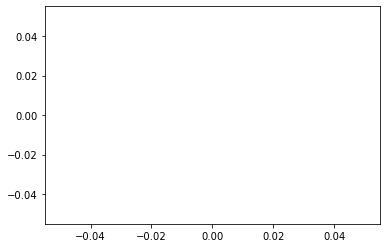

In [893]:
# Separate bridge and non bridge data
bridge_presence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge ==1] 
bridge_presence.slope.plot()


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

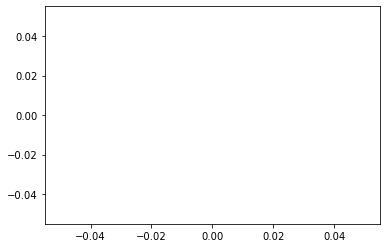

In [894]:
bridge_presence['slope']=0
bridge_presence.slope.plot()

In [895]:
bridge_absence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge==0] 
bridge_absence.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (765160.332 2128164.218, 765173.350...",0.159334,14
1,28545390.0,0,"LINESTRING (765148.208 2128115.383, 765160.332...",0.171004,14
2,28545390.0,0,"LINESTRING (765173.350 2128216.627, 765186.789...",0.155762,14
3,28545390.0,0,"LINESTRING (764328.741 2126914.493, 764488.656...",0.689505,14
4,28545390.0,0,"LINESTRING (764037.367 2127205.188, 764179.572...",0.773007,14


In [896]:
# now join again
buffer_clip_slope3=pd.concat([bridge_presence,bridge_absence])
# put the cap for the slope as maximum 25%
buffer_clip_slope3=buffer_clip_slope3[buffer_clip_slope3['slope']<25]
buffer_clip_slope3.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (765160.332 2128164.218, 765173.350...",0.159334,14
1,28545390.0,0,"LINESTRING (765148.208 2128115.383, 765160.332...",0.171004,14
2,28545390.0,0,"LINESTRING (765173.350 2128216.627, 765186.789...",0.155762,14
3,28545390.0,0,"LINESTRING (764328.741 2126914.493, 764488.656...",0.689505,14
4,28545390.0,0,"LINESTRING (764037.367 2127205.188, 764179.572...",0.773007,14


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

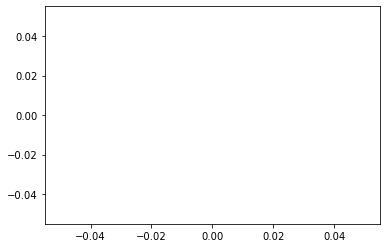

In [897]:
check=buffer_clip_slope3[buffer_clip_slope3['bridge']== 1]
check.slope.plot()

In [898]:
# Now calculate the mean slope for each count location
output_slope=buffer_clip_slope3.groupby(by=['osm_id_sensor'])['slope'].mean().reset_index()
output_slope.columns=['osm_id','slope']
output_slope.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,slope
0,28545390.0,2.095622
1,97891369.0,0.627645
2,144869316.0,2.842775
3,170833583.0,1.410979
4,178552402.0,2.388643


# Import Weather Daily level data from weather underground website Using python coding

1. https://www.shanelynn.ie/analysis-of-weather-data-using-pandas-python-and-seaborn/
2. https://bojanstavrikj.github.io/content/page1/wunderground_scraper

In [899]:
#!pip install beautifulsoup4
#!pip install -U selenium
#!pip install webdriver-manager
#!pip install chromedriver 
#!pip3 install webdrivermanager


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [900]:
from bs4 import BeautifulSoup as BS #conda install -c anaconda beautifulsoup4 
from selenium import webdriver
from functools import reduce
import pandas as pd
import time

In [901]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from os import system as System
from webdriver_manager.utils import ChromeType
#from selenium.webdriver.common.desired_capabilities import DesiredCapabilities

In [902]:
    def render_page(url):
        options = Options()
        options.add_argument("user-data-dir=C:\\Users\\mxm5116\\Desktop\\Profile 1")
        driver = webdriver.Chrome(executable_path=r'C:/Program Files/Google/Chrome/Application/chromedriver_win32/chromedriver.exe', chrome_options=options)
        driver.get(url)
        time.sleep(3)
        r = driver.page_source
        driver.quit()
        return r  

In [903]:
# driver =webdriver.Chrome(r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')
# driver = webdriver.Firefox(executable_path=r'C:\Users\mxm5116\Downloads\geckodriver-v0.29.0-win64\geckodriver.exe')
#chrome_options = Options()
# chrome_options.add_argument('--headless')
#chrome_options.add_argument('--no-sandbox')
# chrome_options.add_argument('--disable-dev-shm-usage')
#driver = webdriver.Chrome(chrome_options=chrome_options, executable_path=r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')

#driver.get(r'https://www.google.com')
#time.sleep(5)
#r = driver.page_source
#print(r)

In [904]:
#def render_page(url):
#        chrome_options = Options()
#        chrome_options.add_argument('--headless')
#        chrome_options.add_argument('--no-sandbox')
#        chrome_options.add_argument('--disable-dev-shm-usage')
#        driver = webdriver.Chrome("executable_path=r"C:/Users/mxm5116/Downloads/chromedriver_win32/chromedriver.exe")
#        driver.get(url)
#        time.sleep(3)
#        r = driver.page_source
#        driver.quit()
#       return r

In [905]:
  def scraper(page, dates):
        output = pd.DataFrame()

        for d in dates:

            url = str(str(page) + str(d))
            print(url)

            r = render_page(url)
            print(r)
            soup = BS(r, "html.parser")
            container = soup.find('lib-city-history-observation')
            check = container.find('tbody')

            data = []

            for c in check.find_all('tr', class_='ng-star-inserted'):
                for i in c.find_all('td', class_='ng-star-inserted'):
                    trial = i.text
                    trial = trial.strip('  ')
                    data.append(trial)

            if round(len(data) / 17 - 1) == 31:
                Temperature = pd.DataFrame([data[32:128][x:x + 3] for x in range(0, len(data[32:128]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[128:224][x:x + 3] for x in range(0, len(data[128:224]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[224:320][x:x + 3] for x in range(0, len(data[224:320]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[320:416][x:x + 3] for x in range(0, len(data[320:416]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[416:512][x:x + 3] for x in range(0, len(data[416:512]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:32][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[512:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 28:
                Temperature = pd.DataFrame([data[29:116][x:x + 3] for x in range(0, len(data[29:116]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[116:203][x:x + 3] for x in range(0, len(data[116:203]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[203:290][x:x + 3] for x in range(0, len(data[203:290]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[290:377][x:x + 3] for x in range(0, len(data[290:377]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[377:464][x:x + 3] for x in range(0, len(data[377:463]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:29][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[464:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 29:
                Temperature = pd.DataFrame([data[30:120][x:x + 3] for x in range(0, len(data[30:120]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[120:210][x:x + 3] for x in range(0, len(data[120:210]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[210:300][x:x + 3] for x in range(0, len(data[210:300]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[300:390][x:x + 3] for x in range(0, len(data[300:390]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[390:480][x:x + 3] for x in range(0, len(data[390:480]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:30][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[480:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 30:
                Temperature = pd.DataFrame([data[31:124][x:x + 3] for x in range(0, len(data[31:124]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[124:217][x:x + 3] for x in range(0, len(data[124:217]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[217:310][x:x + 3] for x in range(0, len(data[217:310]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[310:403][x:x + 3] for x in range(0, len(data[310:403]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[403:496][x:x + 3] for x in range(0, len(data[403:496]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:31][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[496:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            else:
                print('Data not in normal length')

            dfs = [Date, Temperature, Dew_Point, Humidity, Wind, Pressure, Precipitation]

            df_final = reduce(lambda left, right: pd.merge(left, right, left_index=True, right_index=True), dfs)

            df_final['Date'] = str(d) + "-" + df_final.iloc[:, :1].astype(str)

            output = output.append(df_final)

        print('Scraper done!')

        output = output[['Temp_avg', 'Temp_min', 'Dew_max', 'Dew_avg', 'Dew_min', 'Hum_max',
                         'Hum_avg', 'Hum_min', 'Wind_max', 'Wind_avg', 'Wind_min', 'Pres_max',
                         'Pres_avg', 'Pres_min', 'Precipitation', 'Date']]

        return output


# Please input the date and page link to extract the data for your study area here

In [906]:
dates = ['2019-1','2019-2','2019-3','2019-4','2019-5','2019-6','2019-7','2019-8','2019-9','2019-10','2019-11','2019-12']
# insert the date you want to extract the data
page = 'https://www.wunderground.com/history/monthly/us/or/eugene/KEUG/date/'
# insert your study location link here
#df_output = scraper(page,dates)

In [907]:
w19=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/dallas_weather.csv")
w19.head()

,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date
0,39.6,37,38,32.0,28,82,74.2,67,17,13.1,7,29.8,29.7,29.6,0.00,2019-1-1
1,35.2,33,36,31.9,27,97,88.2,72,16,9.4,6,29.8,29.7,29.6,0.02,2019-1-2
2,38.3,36,38,36.2,34,97,92.4,83,14,8.4,0,29.6,29.5,29.4,0.99,2019-1-3
3,44.6,38,37,34.3,30,93,70.8,33,14,8.6,0,29.5,29.5,29.4,0.48,2019-1-4
4,53.1,37,43,37.9,33,86,60.0,32,13,4.2,0,29.6,29.6,29.5,0.00,2019-1-5


In [908]:
output_weather=w19.loc[:, ['Temp_avg', 'Hum_avg','Precipitation']]
output_weather

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Temp_avg,Hum_avg,Precipitation
0,39.6,74.2,0.00
1,35.2,88.2,0.02
2,38.3,92.4,0.99
3,44.6,70.8,0.48
4,53.1,60.0,0.00
...,...,...,...
360,63.9,71.8,0.00
361,63.1,88.1,0.01
362,49.4,65.2,0.86
363,45.5,47.1,0.01


In [909]:
output_weather.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Temp_avg         float64
Hum_avg          float64
Precipitation    float64
dtype: object

In [910]:
# Convert object to float
output_weather2=output_weather.astype(str).astype(float)

In [911]:
output_weather2.isnull().values.any()

False

In [912]:
# Take the average for annual
output_weather3=output_weather2.mean()
output_weather3

Temp_avg         67.624384
Hum_avg          62.316438
Precipitation     0.106521
dtype: float64

# Aggregate all output together in a dataframe

In [913]:
from functools import reduce
import pandas as pd
# compile the list of dataframes you want to merge
df_all = [emerging_data,output_bikecom,output_lane,output_intersection_densitya,output_commercial,commercial_distance1,commercialcc_distance1,output_industrial,industrial_distance1,industrialcc_distance1, output_residential,residential_distance1,residentialcc_distance1, output_retail,retail_distance1,retailcc_distance1,output_grass,grass_distance1,grasscc_distance1,output_park,Park_distance1,parkcc_distance1,output_water,water_distance1,watercc_distance1,output_forest,forest_distance1,forestcc_distance1,CBD_distance1,output_bparking,output_bstop,output_school,output_school_distance,output_college,output_college_distance,output_university,output_university_distance,output_intersection_density1,output_primary,output_secondary,output_tertiary,output_residential,output_path,output_cycleway,output_footway,output_bikeway_all_lane,output_bikeway_all_track, pt_road_type2,output_bikeway_all_lane_binary,output_bikeway_all_track_binary,output_meanspeed,output_pointspeed,output_bridge,output_point_bridge,output_pct_race1,output_pct_gender1,output_student,output_pct_edu1,output_median_age,output_income,output_hhdensity1,output_pdensity1,output_edensity1,output_job1,output_slope]

In [914]:
#Merge by ID
df_merged_eco_short = reduce(lambda  left,right: pd.merge(left,right,on=['osm_id'],
                                            how='left'), df_all)
df_merged_eco_short=df_merged_eco_short.drop_duplicates(subset=['site_id'],keep='first')
df_merged_eco_short

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,pct_female,Student Access,pct_at_least_college_education,Median Age,Median_HH_income,HH_density,population_density,employment_density,Number of jobs,slope
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0,1206.057000,0.000000,0.000000,...,56.134610,213.208402,33.688389,387.865907,8197.664412,703.352479,2163.261898,682.930902,74.175327,2.537197
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,3311.041210,3.288666,0.099324,...,45.729058,266.238677,75.929813,498.233911,42785.798280,1386.460613,3227.708959,1895.355778,1572.789274,3.102783
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,4761.949568,22.182266,0.465823,...,50.633729,733.010982,69.381878,424.017275,13586.933967,2185.369377,5002.207316,2757.722432,30800.215837,2.600057
3,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,2061.274053,0.000000,0.000000,...,49.149617,229.629228,26.715600,535.315831,11382.323694,811.474256,3020.970720,1176.680554,414.353643,1.705124
4,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,2606.048968,0.000000,0.000000,...,50.280034,234.184247,30.690666,613.317200,23991.919633,1042.741177,3634.988473,1489.069775,410.984098,2.084966
5,469524545.0,P007DAL,permanent,15.088095,0.000000,0.000000,8.0,2403.779636,0.000000,0.000000,...,55.208811,225.702806,45.513351,469.782437,9037.728974,1307.337837,3172.618189,1369.264467,621.384084,2.370933
6,170833583.0,P008DAL,permanent,409.750513,42.575342,9.273973,1373.0,12279.226935,70.146308,0.571260,...,44.855934,1474.141378,90.447081,1241.650616,19147.345586,5466.838810,8974.788456,7035.473383,42754.025809,1.410979
7,223881880.0,P009DAL,permanent,632.923809,40.821918,9.547945,2624.0,19424.397991,145.591809,0.749531,...,47.785556,2005.853196,93.253350,923.418474,22825.940218,9017.636218,13778.876442,11128.356951,40030.257838,2.048803
8,223881858.0,P010DAL,permanent,521.530357,41.205479,9.876712,2559.0,11262.689163,80.446075,0.714271,...,51.037387,1186.620814,91.465529,659.501162,23869.779086,5391.651136,8870.640604,6493.481990,16499.924517,1.780186
9,313514317.0,P011DAL,permanent,304.138095,41.767123,7.972603,1124.0,6055.596692,35.208187,0.581416,...,52.263109,1151.204870,91.315738,588.144888,37067.477641,2969.942719,6109.280965,3557.328851,8771.960408,1.468047


In [915]:
#dfs = [df1, df2, df3, df4, df5] 
#from functools import partial 
#outer_merge = partial(pd.merge, how='left') 
#reduce(outer_merge, df_all )

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [916]:
# Add weather data in this new data frame
df_merged_eco_short['Temp_avg'] = pd.Series(output_weather3.Temp_avg, index=df_merged_eco_short.index)
df_merged_eco_short['Hum_avg '] = pd.Series(output_weather3.Hum_avg , index=df_merged_eco_short.index)
df_merged_eco_short['Precipitation'] = pd.Series(output_weather3.Precipitation, index=df_merged_eco_short.index)
df_merged_eco_short.head(5)

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,Median Age,Median_HH_income,HH_density,population_density,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0,1206.057000,0.000000,0.000000,...,387.865907,8197.664412,703.352479,2163.261898,682.930902,74.175327,2.537197,67.624384,62.316438,0.106521
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,3311.041210,3.288666,0.099324,...,498.233911,42785.798280,1386.460613,3227.708959,1895.355778,1572.789274,3.102783,67.624384,62.316438,0.106521
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,4761.949568,22.182266,0.465823,...,424.017275,13586.933967,2185.369377,5002.207316,2757.722432,30800.215837,2.600057,67.624384,62.316438,0.106521
3,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,2061.274053,0.000000,0.000000,...,535.315831,11382.323694,811.474256,3020.970720,1176.680554,414.353643,1.705124,67.624384,62.316438,0.106521
4,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,2606.048968,0.000000,0.000000,...,613.317200,23991.919633,1042.741177,3634.988473,1489.069775,410.984098,2.084966,67.624384,62.316438,0.106521


In [917]:
# If you want to export the excel
pd.DataFrame.to_csv(df_merged_eco_short, 'Eco_Short_Dallas_data_circular_0.75_mile_buffer_2019.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Use Keplergl to produce dynamic Map for all variables

In [918]:
# Make dynamic visualization
#!pip install keplergl

In [919]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,1416.286315,36782.751742
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,966.507266,14815.512107
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,1842.555130,52828.936547
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,803.735072,45877.867288
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,218.202498,30425.587446


In [920]:
ecoshort_selected=ecoshort.loc[:,["osm_id_sensor","geometry"]]
ecoshort_selected
print(ecoshort_selected.crs)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


epsg:2845


In [921]:
# set the co-ordinate system first
ecoshort_selected1 = ecoshort_selected.set_crs("EPSG:2845")
# Let's take a copy of our layer
ecoshort_selected_3D = ecoshort_selected1.copy()

# Reproject the geometries by replacing the values with projected ones
ecoshort_selected_3D  = ecoshort_selected_3D .to_crs(epsg=4211) # Initially given
ecoshort_selected_3D.head()

,osm_id_sensor,geometry
0,496723098.0,POINT (-96.70881 32.70787)
1,356309596.0,POINT (-96.84244 32.76284)
2,493380742.0,POINT (-96.76442 32.91885)
3,461234382.0,POINT (-96.66779 32.71307)
4,472409339.0,POINT (-96.70038 32.75781)


In [922]:
ecoshort_selected_3D['Lon'] = ecoshort_selected_3D.geometry.x
ecoshort_selected_3D['Lat'] = ecoshort_selected_3D.geometry.y
ecoshort_selected_3D=ecoshort_selected_3D.drop(['geometry'],axis=1)
ecoshort_selected_3D.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,Lon,Lat
0,496723098.0,-96.70881,32.70787
1,356309596.0,-96.84244,32.76284
2,493380742.0,-96.76442,32.91885
3,461234382.0,-96.66779,32.71307
4,472409339.0,-96.70038,32.75781


In [923]:
ecoshort_selected_3D.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor    float64
Lon              float64
Lat              float64
dtype: object

In [924]:
print(gdf1.crs)
# set the co-ordinate system first
gdf_selected1 = gdf1.set_crs("EPSG:2845")

# Reproject the geometries by replacing the values with projected ones
gdf_selected_3D  = gdf_selected1.to_crs(epsg=4211) # Initially given
gdf_selected_3D=gdf_selected_3D.loc[:,["osm_id_sensor","geometry"]]
gdf_selected_3D['geometry'] = gdf_selected_3D['geometry'].apply(shapely.geometry.shape)
gdf_selected_3D
newdf=(pd.merge(ecoshort_selected_3D, gdf_selected_3D, left_on='osm_id_sensor', right_on='osm_id_sensor', how='inner'))
buffer_vis=newdf
buffer_vis.columns=['osm_id_sensor','Lon','Lat','geometry']
buffer_vis.head()

epsg:2845


,osm_id_sensor,Lon,Lat,geometry
0,496723098.0,-96.70881,32.70787,"POLYGON ((-96.69594 32.70768, -96.69602 32.706..."
1,356309596.0,-96.84244,32.76284,"POLYGON ((-96.82956 32.76267, -96.82964 32.761..."
2,493380742.0,-96.76442,32.91885,"POLYGON ((-96.75152 32.91867, -96.75160 32.917..."
3,461234382.0,-96.66779,32.71307,"POLYGON ((-96.65492 32.71288, -96.65500 32.711..."
4,472409339.0,-96.70038,32.75781,"POLYGON ((-96.68750 32.75762, -96.68758 32.756..."


In [925]:
# Make a copy of our data frame to visualize it
df_dynamic=df_merged_eco_short.copy()
#cols = df_dynamic.columns
#df_dynamic[cols[1:]] = df_dynamic[cols[1:]].astype(str).astype(float)
#df_dynamic
# Bring the buffer geometry
df_dynamic1=(pd.merge(df_dynamic, buffer_vis, left_on='osm_id', right_on='osm_id_sensor', how='inner'))
df_dynamic1
pd.DataFrame.to_csv(df_dynamic1, 'keplergl_eco_short_2019_Dallas_circular_0.75_mile_buffer.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

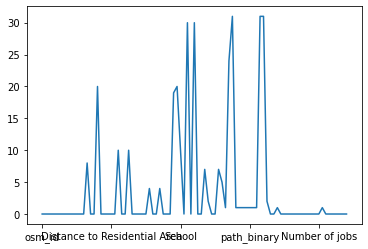

In [926]:
df_dynamic1.isnull().sum().plot()


In [927]:
# We do not have any null point. lets plot the map
# Load an empty map
from keplergl import KeplerGl
map_1 = KeplerGl()
map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


KeplerGl()

In [928]:
#cols = df_dynamic1.columns
#df_dynamic1[cols[1:]] = df_dynamic1[cols[1:]].astype(str).astype(float)
#df_dynamic1

In [929]:
#from shapely import wkt
#df_dynamic1['str_geom'] = df_dynamic1.geometry.apply(lambda x: wkt.dumps(x))
#df_dynamic1=df_dynamic1.drop(['geometry'],axis=1)
#df_dynamic1
#df_dynamic1.rename(columns={'str_geom':'geometry'}, inplace=True)
#df_dynamic1

In [930]:
#df_dynamic1.dtypes

In [931]:
#df_dynamic2=df_dynamic1.drop(["geometry"],axis=1)
#df_dynamic3=df_dynamic1.copy()
#df_dynamic3['geometry'] = df_dynamic3['geometry'].apply(shapely.geometry.shape)
#df_dynamic3

In [932]:
# Load a map with data and config and height
from keplergl import KeplerGl
data=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/keplergl_eco_short_2019_Dallas_circular_0.75_mile_buffer.csv")
data=data.fillna('0')
map_2 = KeplerGl(height=500, data={"data_1":data})
map_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data_1':          osm_id  site_id sensor_type        AADBT     stv_adb  stv_c_adb  \
0   49672…

In [933]:
data.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0,1206.057000,0.000000,0.000000,...,682.930902,74.175327,2.537197,67.624384,62.316438,0.106521,496723098.0,-96.70881,32.70787,POLYGON ((-96.69593710561055 32.70768375041284...
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,3311.041210,3.288666,0.099324,...,1895.355778,1572.789274,3.102783,67.624384,62.316438,0.106521,356309596.0,-96.84244,32.76284,"POLYGON ((-96.8295588625853 32.76266759460748,..."
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,4761.949568,22.182266,0.465823,...,2757.722432,30800.215837,2.600057,67.624384,62.316438,0.106521,493380742.0,-96.76442,32.91885,POLYGON ((-96.75151633856943 32.91866951330086...
3,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,2061.274053,0.000000,0.000000,...,1176.680554,414.353643,1.705124,67.624384,62.316438,0.106521,461234382.0,-96.66779,32.71307,POLYGON ((-96.65491643921446 32.71287950083791...
4,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,2606.048968,0.000000,0.000000,...,1489.069775,410.984098,2.084966,67.624384,62.316438,0.106521,472409339.0,-96.70038,32.75781,POLYGON ((-96.68749988124409 32.75762287729489...


In [934]:
# save as htm file
map_2.save_to_html(file_name="Dallas_eco_short_2019_keplergl_circular_0.75_mile_buffer.html")

Map saved to Dallas_eco_short_2019_keplergl_circular_0.75_mile_buffer.html!


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [935]:
#conda list ipython

In [936]:
end = time.time()
print("Total Run Time:", end - start)

Total Run Time: 2275.7978298664093


# Keplergl Dynamic map is done----END

# Run Random Forest to filter the variables

# Run Negative Binomial Model to predict the AADBT